#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.4em; color:#00b3e5;"> Exploratory Data Analysis (EDA) with Hypothesis Testing</span>

** **
### *Including:*
** **

 - **<span style="color: red;">Univariate Analysis:</span>**
   - **Categoricl:** 
     - **Plots:** barh / squarify (TreeMap)
   - **Scalar:** 
     - **Plots:** stripplot / boxplot / hist / displot
     - **Distribution metrics:** Skewness & Kurtosis
     - **Normality Tests:** Shapiro-Wilk / D'Agostino's K^2 / Anderson-Darling
   - **Time-Series:** 
     - **Trend-Stationary Tests:** Augmented Dickey-Fuller Unit Root Test / Kwiatkowski-Phillips-Schmidt-Shin Test
** **
 - **<span style="color: red;">Bivariate Analysis:</span>**
   - **Categorical - Scalar:**
     - **Plots:** squarify (TreeMap) / boxplot / displot
     - **Hypothesis Tests:** ANOVA + Tukey_HSD / Kruskal-Wallis H + Dunn's Test  (Rank-Based)
   - **Scalar - Scalar:**
     - **Plots:** displot / regplot / scatterplot / jointplot / pairplot / heatmap
     - **Hypothesis Tests:** 
       - **Non-Paired Samples:** Mann-Whitney U / Spearman's Rank Correlation / Student’s t-test / Pearson's Correlation
       - **Paired Samples:** Wilcoxon Signed-Rank / Paired Student’s t-test
       - **Ordinal Samples:** Kendall's Rank Correlation
       - **Categorical Samples:** Chi-Squared
   - **TimeSeries - Scalar:**
     - **Plot:** lineplot
   - **Categorical - Categorical:**
     - **Plots:** bar / countplot
** **       
 - **<span style="color: red;">Trivariate Analysis:</span>**
   - **Categorical-Categorical - Scalar:**
     - **Plots:** boxplot / barplot / displot / 
   - **Scalar-Scalar - Categorical:**
     - **Plots:** scatterplot / implot
   - **TimeSeries - Scalar - Categorical:**
     - **Plots:** lineplot
   - **Scalar-Scalar-Scalar: ( 3 & more Scalars )**
     - **Plots:** displot / heatmap / pairplot
     - **Hypothesis Tests:** 
       - **Non-Paired Samples:** Kruskal-Wallis H + Dunn's Test (Rank-Based) / ANOVA + Tukey_HSD
       - **Paired Samples:** Friedman Test
       - **Ordinal Samples:** Kendall's Rank Correlation
       - **Categorical Samples:** Chi-Squared
** **       
 - **<span style="color: red;">Multivariate Analysis:</span>**  
   - **Scalar-Scalar - Categorical-Categorical:**
     - **Plots:** lmplot
   - **Scalar-Scalar - Categorical-Categorical-Categorical:**
     - **Plots:** lmplot
   - **Scalar-Scalar-Scalar-Scalar-...-Scalar:**
     - similar to Trivariate Analysis (Scalar-Scalar-Scalar)

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Loading Libraries

In [1]:
#pip install modin[all]

In [1]:
#import os
#os.environ["MODIN_CPUS"] = "2"

In [18]:
import pickle, time, re  # re: text editing
import statistics as stat 

import numpy  as np
import pandas as pd
#import modin.pandas as mpd
import polars as pl

pd.set_option('display.max_rows',200)
pd.set_option('display.max_columns',None)

from sklearn.model_selection import train_test_split

import scikit_posthocs as    sp   # pip install scikit-posthocs
from   scipy.stats   import norm

from   matplotlib import pyplot as plt
import  seaborn     as    sns                
sns.set(style="whitegrid", color_codes=True) #sns.set(style='ticks')

from matplotlib.colors import LinearSegmentedColormap as lscmap
W2B_Cmap = lscmap.from_list('WhiteToBlue', ['white','dodgerblue'] )

from scipy.stats import chi2_contingency 

import warnings 
warnings.filterwarnings('ignore') 

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Cheat Sheet for Ordinal-Data
 - **sns.plotname( ..., order = [ 'Jan', 'Feb', 'Mar' ] )**

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:deeppink;"> Palette

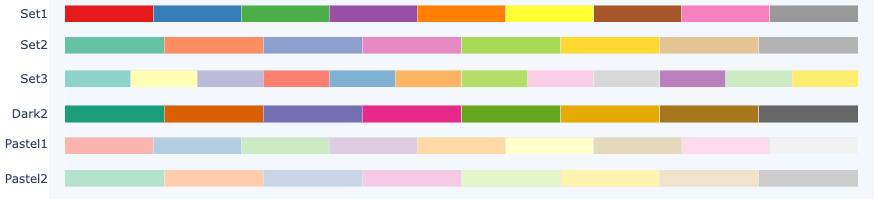

In [19]:
Set2 = [ '#66C2A5', '#FC8D62', '#8DA0CB', '#DB96C0', '#A2C865', '#E5C949', '#DBC29E', '#B3B3B3' ]

p0 = 'Blues'
p1 = sns.light_palette('blue',n_colors=7)
p2 = sns.color_palette('coolwarm', as_cmap=False, n_colors=7)

Palette = Set2   # 'Set1' 'Set2' 'Set3' 'Dark2' 'Pastel1' 'Pastel2'  

#####     

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:deeppink;"> Loading DataSet

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [20]:
# (input) choose

# either  clean data
#df_raw = pickle.load( open('Data_Clean'            ,'rb') )  # load

#   or   feature-selected + pca
df_raw = pickle.load( open('Data_PCA'              ,'rb') )  # load

# (auto)
df_raw.tail()

pca1,pca2,pca3,Age,Avg_Account_Balance,Credit_Product,Gender,Is_Active,Is_Lead,Month,Percentiles,Tenthiles,Vintage,Occupation,Channel_Code,Region_Code
f64,f64,f64,i8,i32,str,str,str,str,str,str,str,i16,str,str,str
0.233268,0.9312,1.293132,67,467276,"""No""","""Male""","""Yes""","""No""","""Oct""","""P092""","""P100""",122,"""Other""","""X3""","""RG251"""
1.166184,-0.473296,1.0087,63,594475,"""No""","""Female""","""No""","""Yes""","""Jul""","""P089""","""P100""",63,"""Other""","""X3""","""RG276"""
1.538023,-0.122014,1.310493,62,761403,"""Yes""","""Male""","""Yes""","""Yes""","""May""","""P088""","""P100""",67,"""Other""","""X3""","""RG283"""
0.373712,-0.335307,1.580605,85,697840,"""Yes""","""Female""","""No""","""No""","""Jul""","""P100""","""P100""",79,"""Other""","""X3""","""RG277"""
0.771606,-1.338883,-1.016564,65,1454571,"""No""","""Male""","""Yes""","""No""","""Jul""","""P091""","""P100""",87,"""Other""","""X2""","""RG283"""


#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:deeppink;"> Year Column

In [21]:
# input
Year_Column = None

try:
    df_raw.loc[:,Year_Column] = np.round(df_raw[Year_Column])
    print( set(df_raw[Year_Column].unique()) )
except:
    ;

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Estimated Column

In [22]:
estimated_column = pickle.load( open('estimated_column','rb') )  # load
RANDOM_STATE     =  3

estimated_column

'Age'

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Drop Percentiles

In [23]:
try:
    Drop_List = ['Percentiles']
    Keep_List = []
    for ft in df_raw.columns:
        if ft not in Drop_List:
            Keep_List.append(ft)
    df_raw = df_raw[ Keep_List ]
except:
    ;

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Observing Random Records

In [24]:
np.random.seed( RANDOM_STATE )
cm = sns.light_palette("cyan", as_cmap=True)

Sc  = [ col   for col in df_raw.columns if df_raw.head(1).to_pandas()[col].dtypes != 'object' ]  
Sc1 = [ Sc[i] for  i  in np.arange(0,len(Sc),2) ]
Sc2 = [ Sc[i] for  i  in np.arange(1,len(Sc),2) ]

df_raw.sample(n=10).to_pandas().style.\
    background_gradient( subset=Sc1, cmap=cm).\
    bar(subset=Sc2, color='pink' ).\
    highlight_null( color='lime' ).\
    format(precision=3).\
    hide(axis="index")       #.to_excel('styled.xlsx', engine='openpyxl')

pca1,pca2,pca3,Age,Avg_Account_Balance,Credit_Product,Gender,Is_Active,Is_Lead,Month,Tenthiles,Vintage,Occupation,Channel_Code,Region_Code
2.173,-0.029,-0.128,27,427938,No,Female,No,No,Mar,P025,20,Other,X1,RG280
-0.459,2.078,1.033,24,1699544,No,Male,No,No,Feb,P025,13,Salaried,X1,RG254
1.424,-1.539,0.719,29,314588,Yes,Female,No,Yes,Dec,P025,33,Salaried,X1,RG266
1.873,0.545,0.443,52,891441,No,Female,No,Yes,Aug,P075,39,Entrepreneur,X3,RG283
-2.067,0.428,-0.146,38,1540536,No,Male,Yes,No,Apr,P050,32,Self_Employed,X2,RG268
2.546,-0.258,1.317,40,830263,No,Female,Yes,No,Oct,P050,50,Self_Employed,X2,RG268
0.593,0.618,-1.021,56,718861,No,Male,Yes,No,Aug,P100,117,Self_Employed,X3,RG273
-2.742,-1.321,-0.445,29,754319,No,Male,Yes,No,Jan,P025,13,Self_Employed,X4,RG257
-1.452,0.647,1.599,28,391831,No,Female,No,No,Jan,P025,19,Salaried,X1,RG251
0.749,-2.107,1.001,34,1331084,No,Female,Yes,No,May,P050,13,Self_Employed,X2,RG269


#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:lime;"> Business Question
 - How is the **estimated-column** affected by **other columns?**  

In [25]:
print( 'Business Question:' )
print( 'How is "'+estimated_column+'" affected by other features?' )

Business Question:
How is "Age" affected by other features?


#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Count of Data Types

In [26]:
C = df_raw.head().to_pandas().dtypes.value_counts()
C

object     9
float64    3
int8       1
int32      1
int16      1
Name: count, dtype: int64

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:deeppink;"> report

In [27]:
cats  = [ x for x in df_raw.head().to_pandas().columns if df_raw.head().to_pandas()[x].dtype == 'object' ]
sclrs = [ x for x in df_raw.head().to_pandas().columns if df_raw.head().to_pandas()[x].dtype != 'object' ]

try:     cats.remove(  estimated_column ); cats  = [estimated_column]+cats
except:
    try: sclrs.remove( estimated_column ); sclrs = [estimated_column]+sclrs
    except:
        ;
print('\n There are '+str(len(cats)) +" categorical features:  ",cats       )
print('\n There are '+str(len(sclrs))+" scalar features:       ",sclrs, '\n')


 There are 9 categorical features:   ['Credit_Product', 'Gender', 'Is_Active', 'Is_Lead', 'Month', 'Tenthiles', 'Occupation', 'Channel_Code', 'Region_Code']

 There are 6 scalar features:        ['Age', 'pca1', 'pca2', 'pca3', 'Avg_Account_Balance', 'Vintage'] 



#####     

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> Removing null values from cat features

In [28]:
# removing
df_raw = df_raw.drop_nulls( subset=cats )

# checking
'''
df_raw[ df_raw.isnull().any(axis=1) ].\
    style.\
    background_gradient( subset=[], cmap=cm    ).\
    bar(subset=[], color='lime'     ).\
    highlight_null( color='lime' ).\
    format(precision=0)
'''
pass

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> df_cats

In [29]:
df_cats  = pd.DataFrame( index=cats, columns=['subcats','n_subs'] ) 
ord_cats = []
for cat in cats:
    df_cats.loc[cat,'subcats'] = np.sort(np.array( df_raw[cat].unique() )).tolist()
    L = df_cats.loc[cat,'subcats']
    df_cats.loc[cat,'n_subs'] = len(L)
df_cats = df_cats.sort_values(['n_subs'],ascending=False)
df_cats = df_cats[['subcats']]

# updating cats
cats = df_cats.index.tolist(); print('\ncats (updated) =',cats)

df_cats


cats (updated) = ['Region_Code', 'Month', 'Tenthiles', 'Occupation', 'Channel_Code', 'Credit_Product', 'Gender', 'Is_Active', 'Is_Lead']


,subcats
Region_Code,"[RG250, RG251, RG252, RG253, RG254, RG255, RG2..."
Month,"[Apr, Aug, Dec, Feb, Jan, Jul, Jun, Mar, May, ..."
Tenthiles,"[P025, P050, P075, P100]"
Occupation,"[Entrepreneur, Other, Salaried, Self_Employed]"
Channel_Code,"[X1, X2, X3, X4]"
Credit_Product,"[No, Yes]"
Gender,"[Female, Male]"
Is_Active,"[No, Yes]"
Is_Lead,"[No, Yes]"


#####     

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:deeppink;"> fixing ordinal subcats

In [30]:
# help
for cat in cats:  print('\n'+cat+': ',df_raw[cat].unique())


Region_Code:  shape: (35,)
Series: 'Region_Code' [str]
[
	"RG255"
	"RG261"
	"RG262"
	"RG280"
	"RG274"
	…
	"RG271"
	"RG254"
	"RG266"
	"RG278"
	"RG263"
]

Month:  shape: (12,)
Series: 'Month' [str]
[
	"Sep"
	"Aug"
	"Feb"
	"Jul"
	"May"
	…
	"Dec"
	"Nov"
	"Jun"
	"Mar"
	"Oct"
]

Tenthiles:  shape: (4,)
Series: 'Tenthiles' [str]
[
	"P025"
	"P050"
	"P075"
	"P100"
]

Occupation:  shape: (4,)
Series: 'Occupation' [str]
[
	"Entrepreneur"
	"Salaried"
	"Other"
	"Self_Employed"
]

Channel_Code:  shape: (4,)
Series: 'Channel_Code' [str]
[
	"X1"
	"X4"
	"X3"
	"X2"
]

Credit_Product:  shape: (2,)
Series: 'Credit_Product' [str]
[
	"No"
	"Yes"
]

Gender:  shape: (2,)
Series: 'Gender' [str]
[
	"Male"
	"Female"
]

Is_Active:  shape: (2,)
Series: 'Is_Active' [str]
[
	"Yes"
	"No"
]

Is_Lead:  shape: (2,)
Series: 'Is_Lead' [str]
[
	"Yes"
	"No"
]


In [31]:
# input
cat          =  'Month'
subcat_order = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec'] 

# auto
ord_cats.append(cat)
ord_cats = list(set(ord_cats))
                
df_cats.loc[cat,'subcats'] = None
df_cats.loc[cat,'subcats'] = subcat_order
df_cats

,subcats
Region_Code,"[RG250, RG251, RG252, RG253, RG254, RG255, RG2..."
Month,"[Jan, Feb, Mar, Apr, May, Jun, Jul, Aug, Sep, ..."
Tenthiles,"[P025, P050, P075, P100]"
Occupation,"[Entrepreneur, Other, Salaried, Self_Employed]"
Channel_Code,"[X1, X2, X3, X4]"
Credit_Product,"[No, Yes]"
Gender,"[Female, Male]"
Is_Active,"[No, Yes]"
Is_Lead,"[No, Yes]"


#####     

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> ordinal cats & nominal cats

In [32]:
df = df_raw.head().to_pandas().copy()
nom_cats = [x for x in df.columns if (df[x].dtype in ['object'] and x not in ord_cats) ]
print('\nord_cats =',ord_cats)
print('\nnom_cats =',nom_cats)


ord_cats = ['Month']

nom_cats = ['Credit_Product', 'Gender', 'Is_Active', 'Is_Lead', 'Tenthiles', 'Occupation', 'Channel_Code', 'Region_Code']


#####     

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> 2D PCA

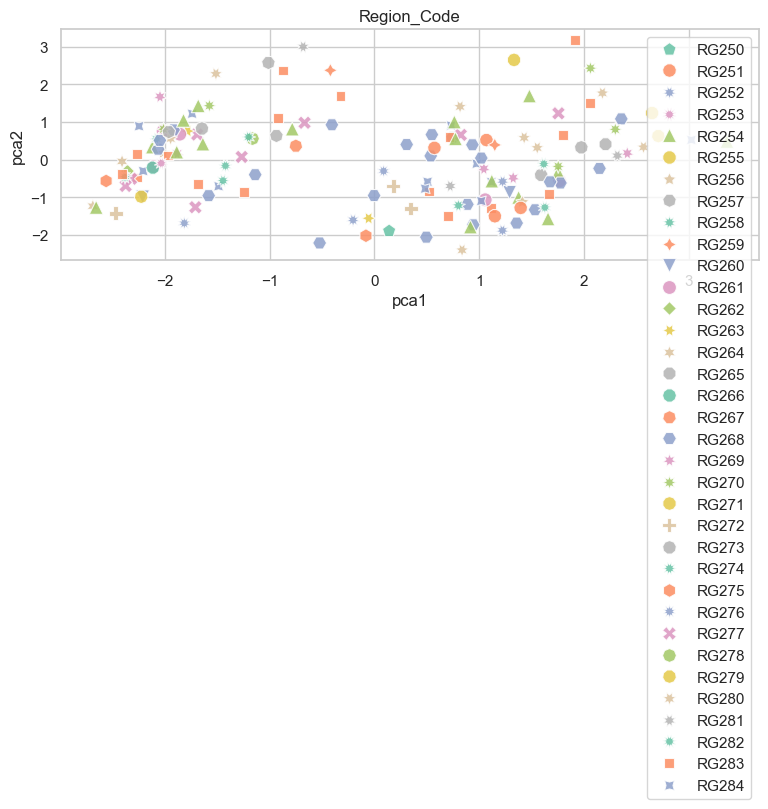

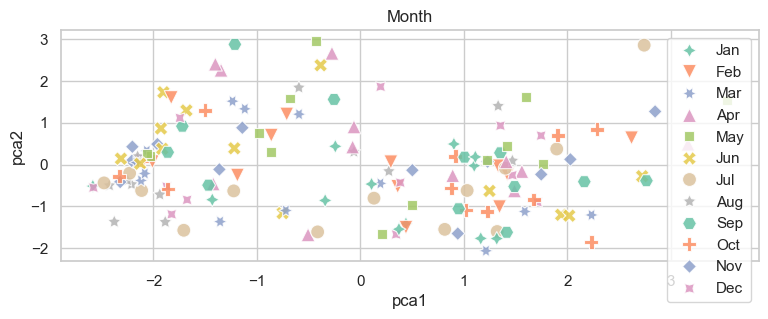

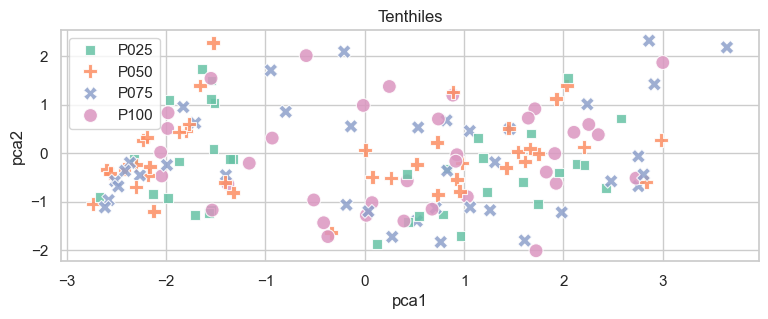

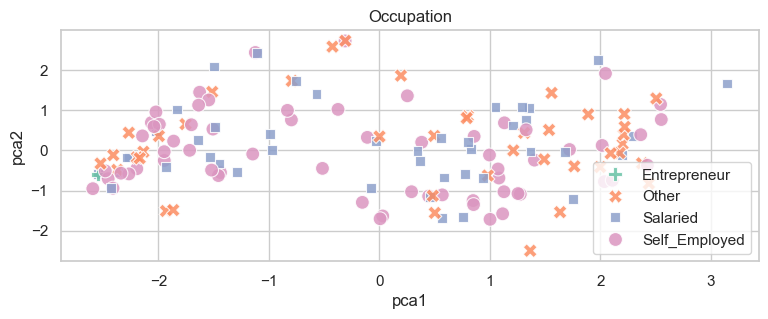

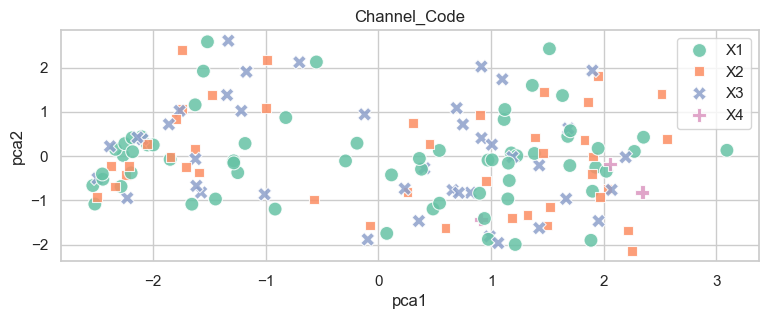

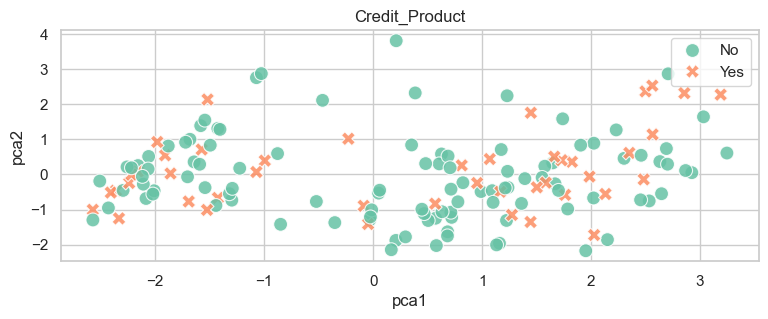

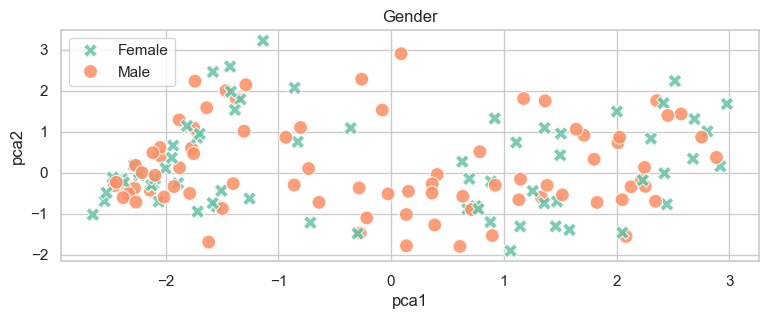

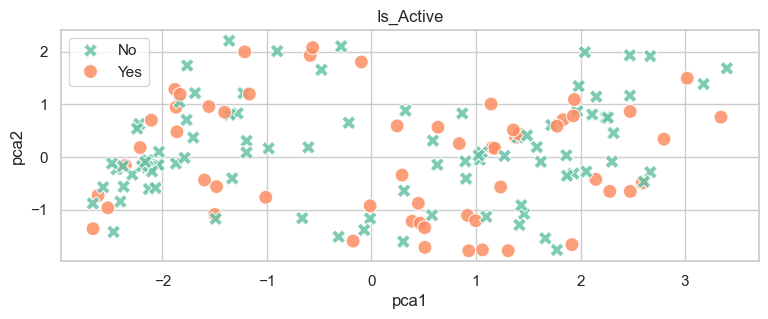

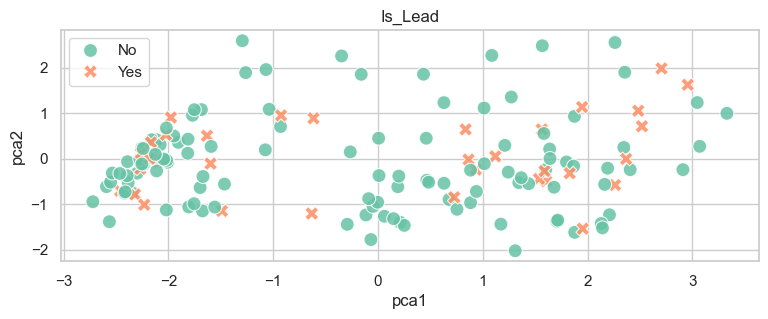

In [33]:
def PCA_2D( cat, df_raw, subcats, N, RANDOM_STATE ):
    Sample, _, _, _ = train_test_split( df_raw, df_raw[cat], train_size=N/df_raw.shape[0]
                                      , random_state=RANDOM_STATE, stratify=df_raw[cat] )
    # Scatter-Plot
    plt.figure(figsize=(9,3))
    n_sample = min(150,df_raw.shape[0])
    sns_plot = sns.scatterplot( 
        data = Sample, x='pca1', y='pca2', hue_order=subcats,
        markers=True, hue=cat, style=cat, palette=Palette, s=100, alpha=0.85 )
    sns_plot.set( title=cat.title() )
    sns_plot.get_legend().set_title(None)
    # Savefig
    sns_plot.get_figure().savefig('PCA_'+cat+'_ScatterPlot.png',bbox_inches='tight',dpi=360); plt.show()

for cat in cats: 
    subcats = df_cats.loc[cat,'subcats'] 
    PCA_2D( cat, df_raw[[cat,'pca1','pca2']].to_pandas(), subcats, 150, RANDOM_STATE )

#####     

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Univariate Analysis of Cats


 There are 9 Cats:
 ['Region_Code', 'Month', 'Tenthiles', 'Occupation', 'Channel_Code', 'Credit_Product', 'Gender', 'Is_Active', 'Is_Lead'] 



 Region_Code


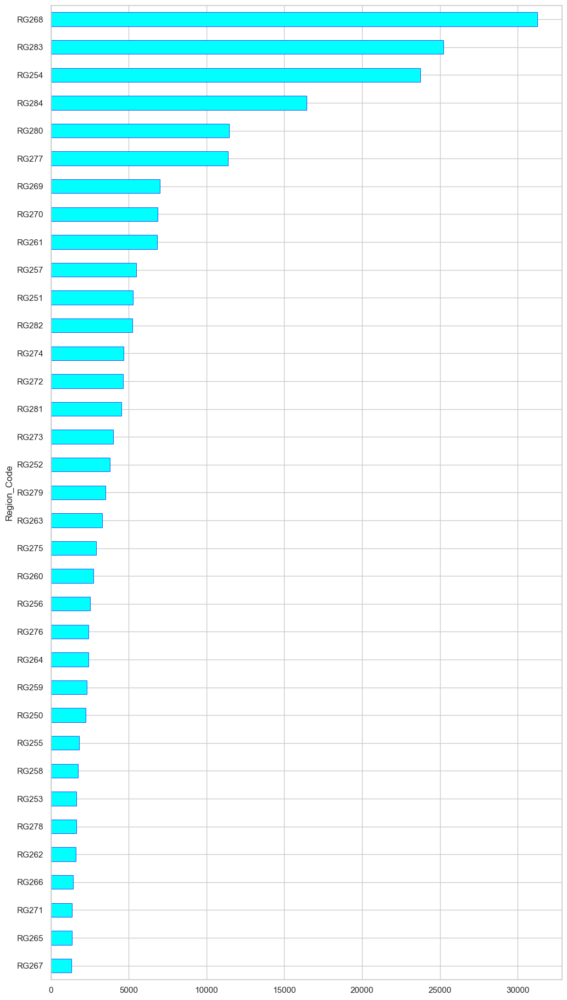



 Month


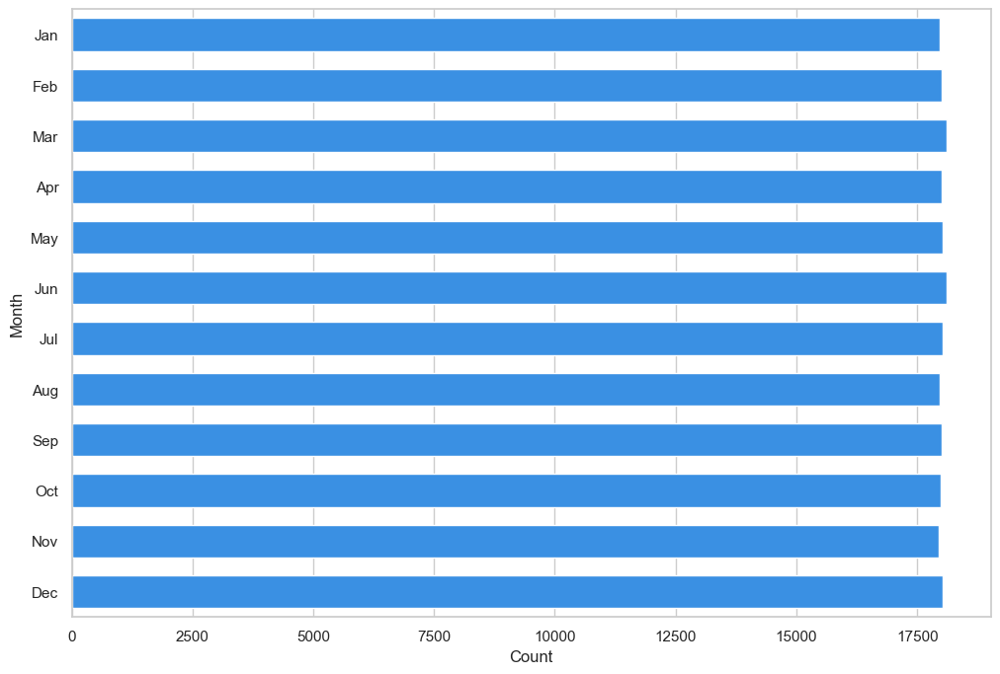



 Tenthiles


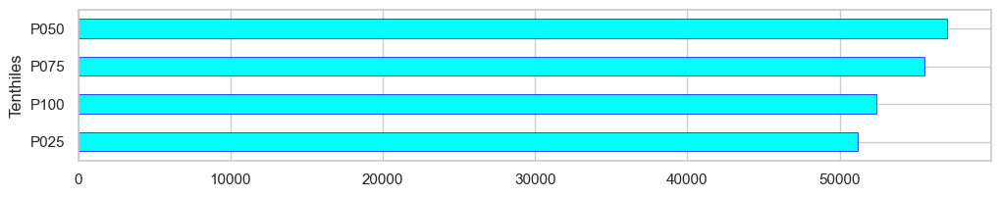



 Occupation


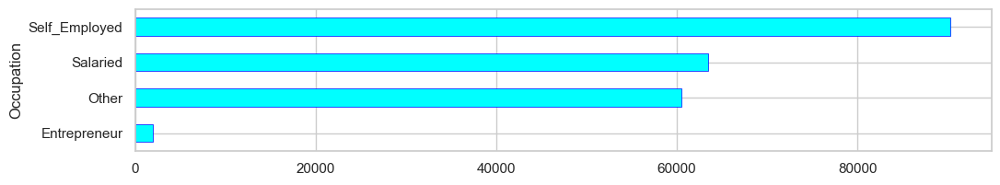



 Channel_Code


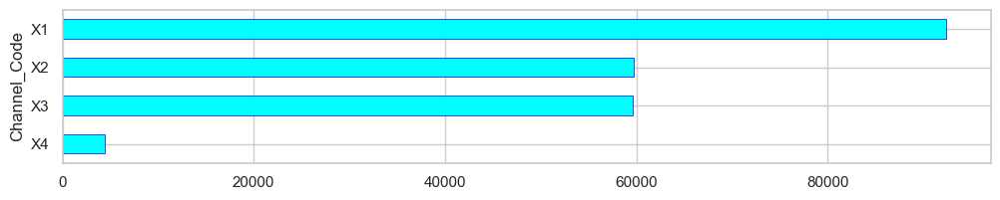



 Credit_Product


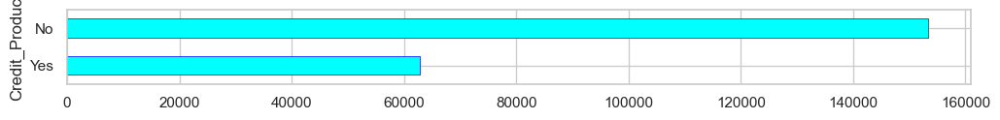



 Gender


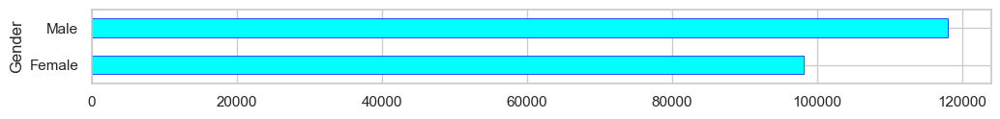



 Is_Active


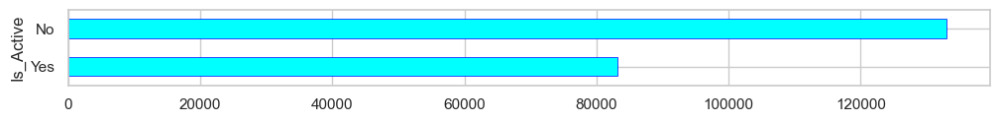



 Is_Lead


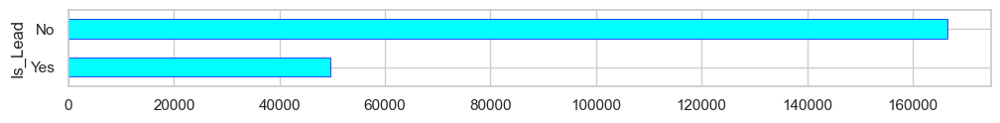



 y = Region_Code   x = Month


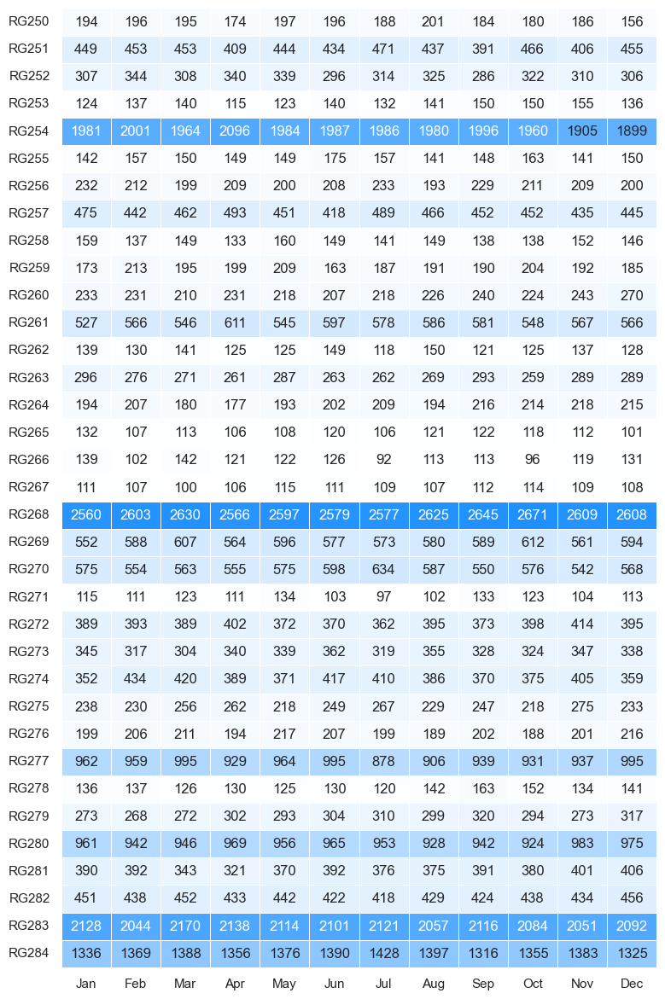



 y = Region_Code   x = Tenthiles


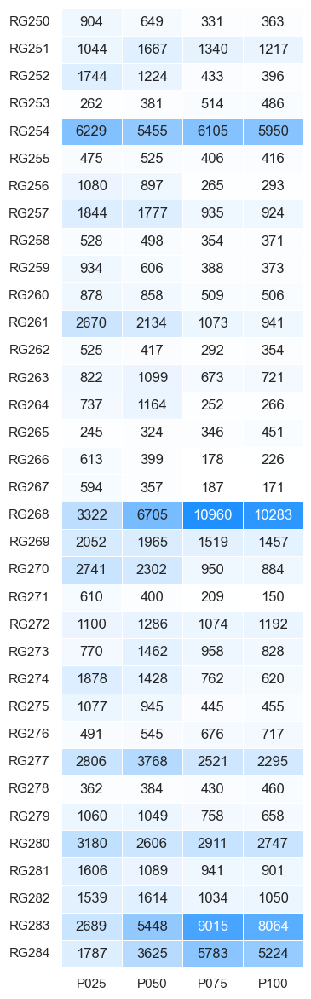



 y = Region_Code   x = Occupation


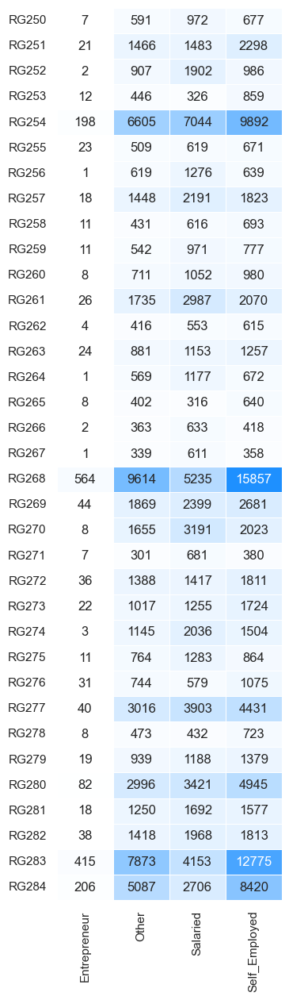



 y = Region_Code   x = Channel_Code


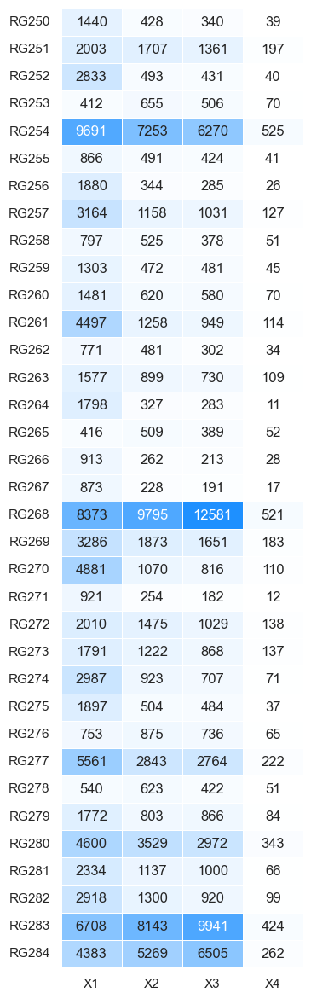



 y = Region_Code   x = Credit_Product


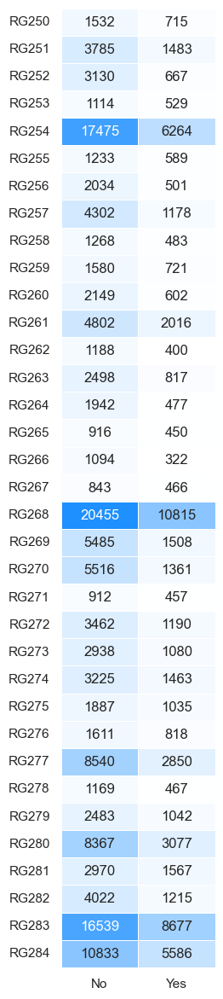



 y = Region_Code   x = Gender


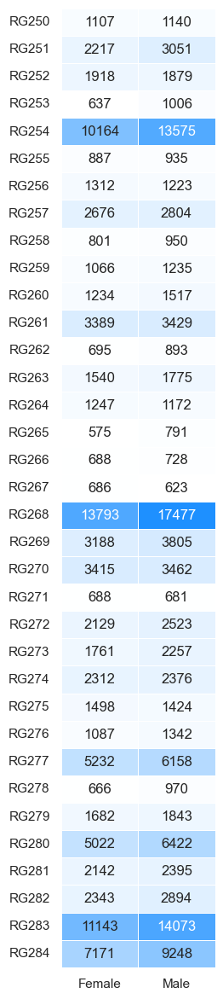



 y = Region_Code   x = Is_Active


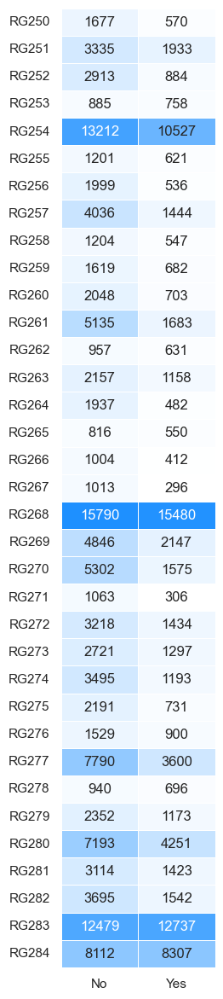



 y = Region_Code   x = Is_Lead


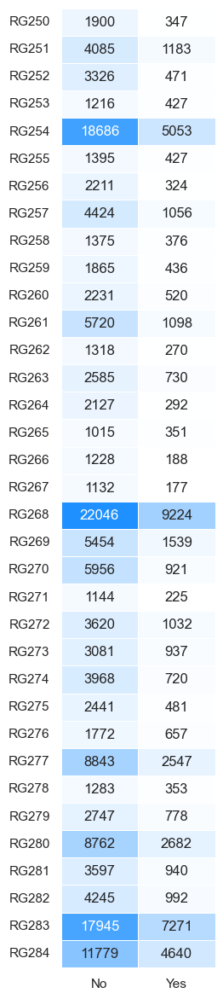



 y = Month   x = Tenthiles


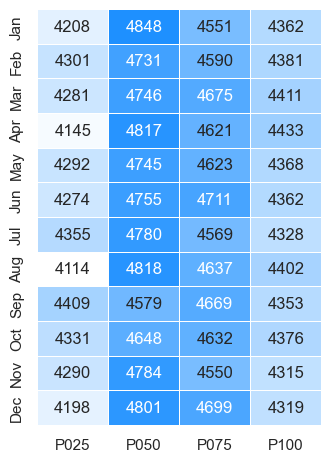



 y = Month   x = Occupation


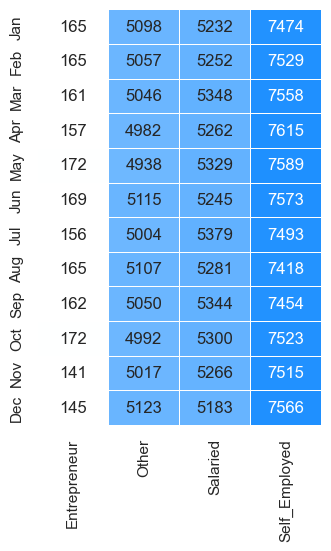



 y = Month   x = Channel_Code


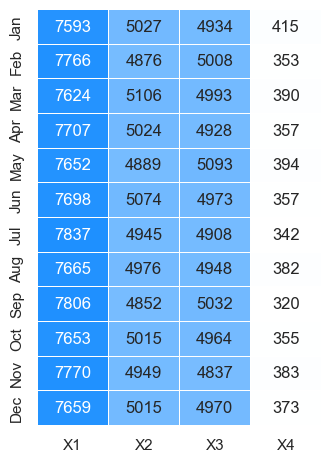



 y = Month   x = Credit_Product


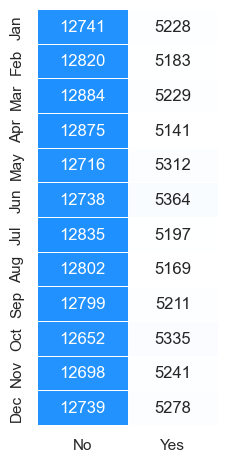



 y = Month   x = Gender


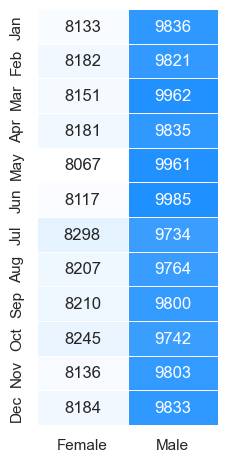



 y = Month   x = Is_Active


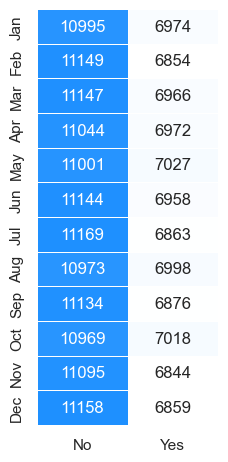



 y = Month   x = Is_Lead


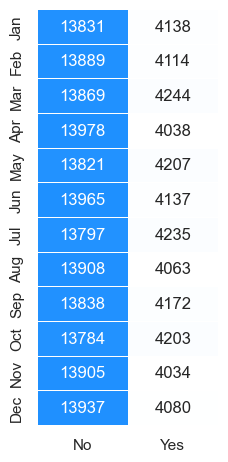



 y = Tenthiles   x = Occupation


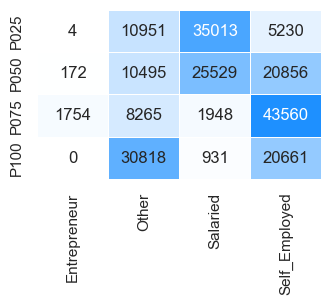



 y = Tenthiles   x = Channel_Code


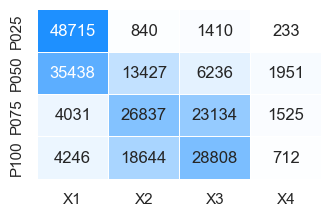



 y = Tenthiles   x = Credit_Product


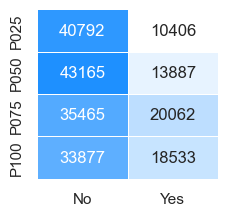



 y = Tenthiles   x = Gender


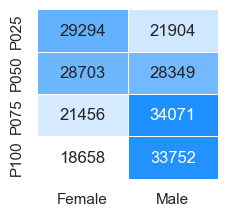



 y = Tenthiles   x = Is_Active


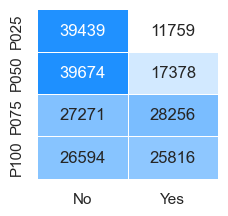



 y = Tenthiles   x = Is_Lead


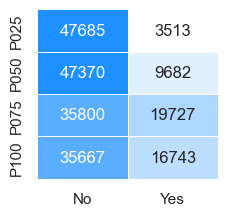



 y = Occupation   x = Channel_Code


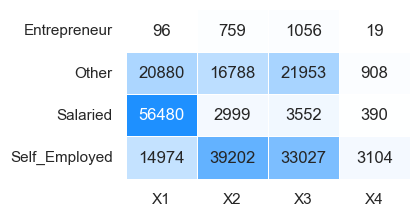



 y = Occupation   x = Credit_Product


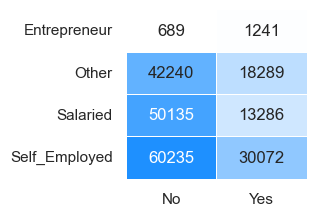



 y = Occupation   x = Gender


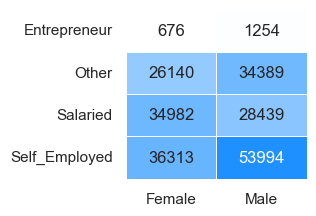



 y = Occupation   x = Is_Active


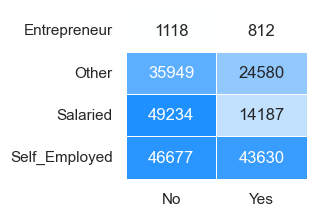



 y = Occupation   x = Is_Lead


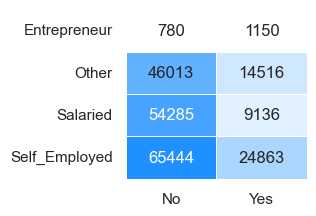



 y = Channel_Code   x = Tenthiles


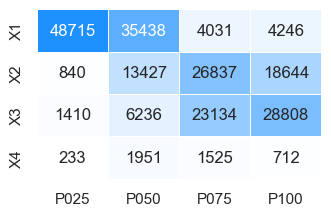



 y = Channel_Code   x = Credit_Product


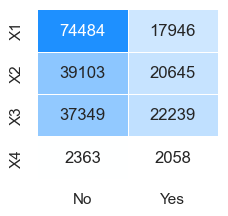



 y = Channel_Code   x = Gender


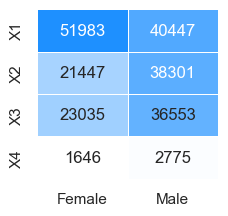



 y = Channel_Code   x = Is_Active


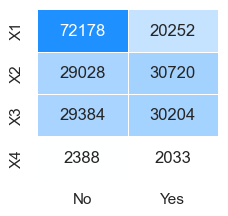



 y = Channel_Code   x = Is_Lead


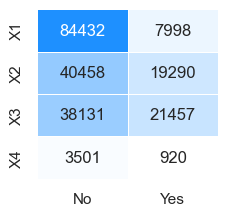



 y = Credit_Product   x = Gender


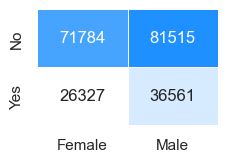



 y = Credit_Product   x = Is_Active


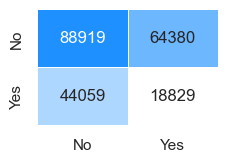



 y = Credit_Product   x = Is_Lead


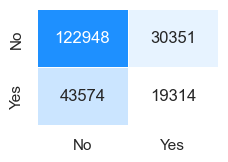



 y = Gender   x = Is_Active


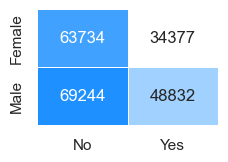



 y = Gender   x = Is_Lead


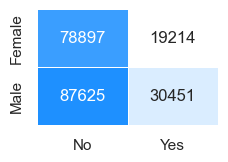



 y = Is_Active   x = Gender


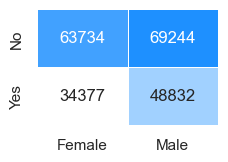



 y = Is_Active   x = Is_Lead


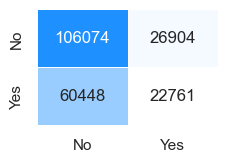

In [34]:
# (auto) 
print('\n There are',len(cats),'Cats:\n', list(cats), '\n')

# Observing sub-cats of object columns
for col in cats: 
        
    print('\n\n',col)
    L = df_raw[col].to_pandas().copy().dropna().astype('str')
    N = min( 35, int(L.nunique()*.67) )
    
    if col in ord_cats:
        plt.figure(figsize=(12,N))
        L = L.value_counts().reindex( df_cats.loc[col,'subcats'] ) 
        L = pd.DataFrame( L )
        
        L.columns=['Count'];  L[col]=L.index
        sns_plot = sns.barplot( data=L, y=col, x='Count', width=0.65, palette=['dodgerblue'] )
        
        #L.columns = ['']; L[' '] = L.index 
        #sns_plot = sns.barplot( data=L, y=' ', x='', width=0.65, palette=['dodgerblue'] )
        
        sns_plot.get_figure().savefig('univar_cat_'+col+'_.png',bbox_inches='tight',dpi=600);   plt.show()
    
    else:
        fig, ax = plt.subplots(figsize=(12, N))
        L.value_counts(normalize=False).sort_values().plot.barh(linewidth=.5, edgecolor='blue', facecolor='cyan')
        fig.savefig('univar_cat_'+col+'_.png',bbox_inches='tight',dpi=600);   plt.show()

from matplotlib.colors import LinearSegmentedColormap as lscmap
W2B_Cmap = lscmap.from_list('WhiteToBlue', ['white','dodgerblue'] )
Cols = cats.copy()
LIST = []
for c1 in Cols:
    for c2 in Cols:
        if c1!=c2:
            L = list(set([c1,c2]))
            if L not in LIST:
                LIST.append(L)
                s1 = df_raw[c1].unique().to_list()
                s2 = df_raw[c2].unique().to_list()
                df = pd.DataFrame(columns=s2,index=s1)
                for i in range(len(s1)):
                    for j in range(len(s2)):
                        try:
                            df2 = df_raw[[c1,c2]].to_pandas().copy()
                        except:
                            df2 = df_raw[[c2]].to_pandas().copy()
                        I1  = df2[ df2[c1]==s1[i] ].index.to_list()
                        I2  = df2[ df2[c2]==s2[j] ].index.to_list()
                        df.loc[ s1[i], s2[j] ] = len(list(set(I1). intersection(set(I2))))
                        
                df = df.astype(int)
                df = df.reindex( df_cats.loc[c1,'subcats'] ).T.reindex(df_cats.loc[c2,'subcats']).T
                
                ## Sorting
                #df = df.sort_values( list(df.columns), axis=0, ascending=False )
                #df = df.sort_values( list(df.index)  , axis=1, ascending=False )
            
                if c1==c2:
                    df2 = pd.DataFrame( [np.diag(df)] ).T
                    df2.index   = df.index
                    df2.columns = ['subcats']
                    df2 = df2.sort_values(['subcats'],ascending=False)
                    df  = pd.DataFrame()
                    for i in df2.index: df.loc[i,i] = df2.loc[i,'subcats']  
                    df = df.fillna(0)
                    
                ## horizontal rectangle
                #if len(df.index) > len(df.columns): df = df.T
                
                print('\n\n y =',c1,'  x =',c2)
                _,ax = plt.subplots(figsize=( max(1.5,(1.5+df.shape[1])/1.5), max(1.5,(1.5+df.shape[0])/2.5) ))
                sns_plot = sns.heatmap( df,  mask=np.zeros_like(df,dtype=bool),  cmap=W2B_Cmap, cbar=False,
                                        center=None, square=False, ax=ax, annot=True, fmt='.0f', linewidth=.5 )
                #plt.xticks(rotation=30); plt.yticks(rotation=30)
                sns_plot.get_figure().savefig('count_heatmap_'+c1+'_'+c2+'.png',bbox_inches='tight',dpi=360); plt.show()

#####   

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Univariate Analysis of Sclrs

In [35]:
###
#   Descriptive Statistics
###
INFO         = df_raw[ sclrs ].describe().to_pandas().T
INFO.columns = INFO.loc['statistic',:].tolist()
INFO         = INFO.drop(['statistic'],axis=0)
INFO         = INFO.drop(['count','null_count'],axis=1)
INFO         = INFO.astype(float)
INFO         = np.round(INFO,1)


# Shape Parameters: Skewness and Kurtosis
SKEW = df_raw.select([ pl.all().exclude(nom_cats+ord_cats).skew()     ]).to_pandas().T[0]
KURT = df_raw.select([ pl.all().exclude(nom_cats+ord_cats).kurtosis() ]).to_pandas().T[0]

Shape_Parameters         = pd.DataFrame([SKEW,KURT]).T
Shape_Parameters.columns = ['Skewness','Kurtosis']

SKEW_REPORT = []
for i in Shape_Parameters.index:
    Skewness = Shape_Parameters.loc[i,'Skewness']
    if   Skewness >0:  SKEW_REPORT.append( 'Median < Mean ..... Right-Tail'  )
    elif Skewness==0:  SKEW_REPORT.append( 'Mean = Median ..... Equal-Tails' )
    elif Skewness <0:  SKEW_REPORT.append( 'Mean < Median ..... Left-Tail'   )

KURT_REPORT = []
for i in Shape_Parameters.index:
    Kurtosis = Shape_Parameters.loc[i,'Kurtosis']
    if   Kurtosis >0:  KURT_REPORT.append( '( LeptoKurtic )  Relatively-Peaked with Many-Outliers ( Heavy-Tail )' )
    elif Kurtosis==0:  KURT_REPORT.append( '( MesoKurtic )  ( Normal )' )
    elif Kurtosis <0:  KURT_REPORT.append( '( PlatyKurtic )  Relatively-Flat  with  Few-Outliers ( Flat-Tail ) Desirable-Curve!!')
    
Shape_Parameters['Skewness Report'] = SKEW_REPORT
Shape_Parameters['Kurtosis Report'] = KURT_REPORT

# Report
Descriptive_Statistics = pd.concat( [INFO, Shape_Parameters], axis=1 )
#Descriptive_Statistics.sort_values(['Skewness','Kurtosis'],ascending=[True,False],inplace=True)
print('\nDescriptive Statistics:')
Descriptive_Statistics.T.style.format(precision=1)


Descriptive Statistics:


,Age,pca1,pca2,pca3,Avg_Account_Balance,Vintage
mean,43.4,0.0,-0.0,0.0,1057638.9,46.8
std,14.5,1.7,1.1,1.0,624729.8,32.2
min,23.0,-2.9,-3.0,-1.6,20790.0,7.0
25%,30.0,-1.7,-0.8,-0.7,601577.0,20.0
50%,43.0,0.3,-0.1,0.1,887445.0,32.0
75%,53.0,1.5,0.6,0.7,1345012.0,73.0
max,85.0,3.8,4.1,1.6,3385070.0,135.0
Skewness,0.6,-0.0,0.5,-0.0,1.2,0.8
Kurtosis,-0.4,-1.4,0.1,-1.2,1.1,-0.7
Skewness Report,Median < Mean ..... Right-Tail,Mean < Median ..... Left-Tail,Median < Mean ..... Right-Tail,Mean < Median ..... Left-Tail,Median < Mean ..... Right-Tail,Median < Mean ..... Right-Tail


#####   


 There are 6 scalar features:
 ['Age', 'pca1', 'pca2', 'pca3', 'Avg_Account_Balance', 'Vintage']



 Age


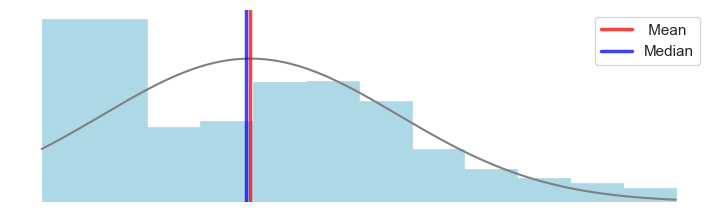

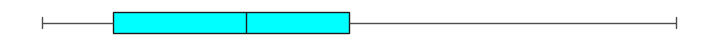


Skewness (Degree of Assymetry Around The Mean) = 0.6
Positive  Skewness:  Mode<Median<Mean  (Right-Tail)

Kurtosis (Degree of Thickness of Tails) = -0.4
PlatyKurtic Distribution:   Relatively-Flat  with  Few-Outliers  (Flat-Tails)  Desirable-Curve!!

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=4371.555 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=4371.555 ≮  critical_value=1.092



 pca1


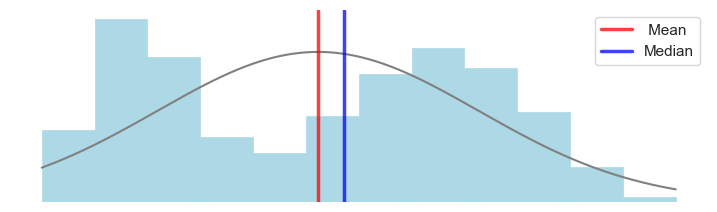

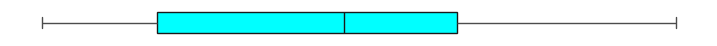


Skewness (Degree of Assymetry Around The Mean) = -0.0
Zero  Skewness:  Mean=Median=Mode  (Equal Tails)

Kurtosis (Degree of Thickness of Tails) = -1.4
PlatyKurtic Distribution:   Relatively-Flat  with  Few-Outliers  (Flat-Tails)  Desirable-Curve!!

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=5474.319 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=5474.319 ≮  critical_value=1.092



 pca2


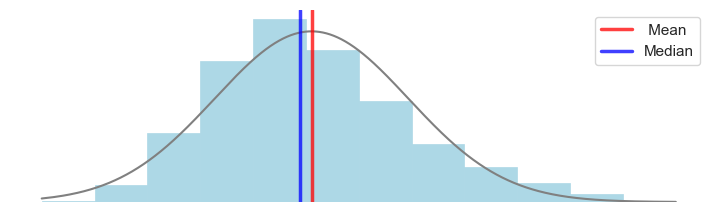

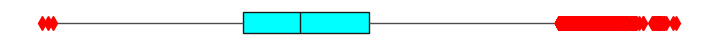


Skewness (Degree of Assymetry Around The Mean) = 0.5
Positive  Skewness:  Mode<Median<Mean  (Right-Tail)

Kurtosis (Degree of Thickness of Tails) = 0.1
LeptoKurtic Distribution:   Relatively-Peaked  with  Many-Outliers  (Heavy-Tails)

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=1113.606 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=1113.606 ≮  critical_value=1.092



 pca3


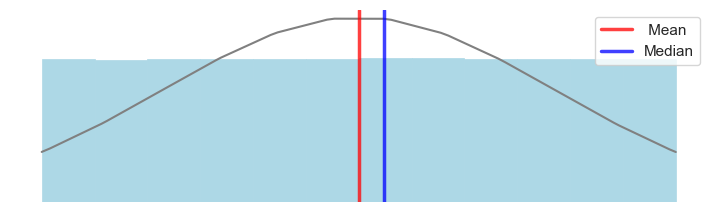

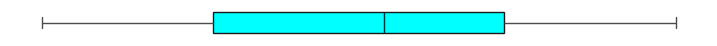


Skewness (Degree of Assymetry Around The Mean) = -0.0
Zero  Skewness:  Mean=Median=Mode  (Equal Tails)

Kurtosis (Degree of Thickness of Tails) = -1.2
PlatyKurtic Distribution:   Relatively-Flat  with  Few-Outliers  (Flat-Tails)  Desirable-Curve!!

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=3196.392 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=3196.392 ≮  critical_value=1.092



 Avg_Account_Balance


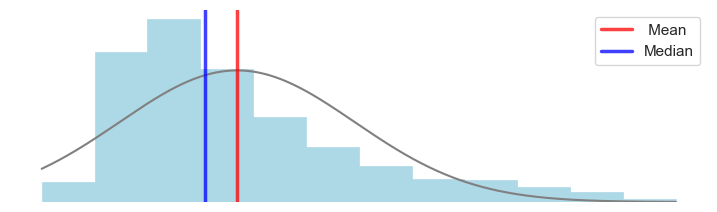

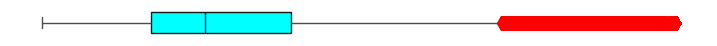


Skewness (Degree of Assymetry Around The Mean) = 1.2
Positive  Skewness:  Mode<Median<Mean  (Right-Tail)

Kurtosis (Degree of Thickness of Tails) = 1.1
LeptoKurtic Distribution:   Relatively-Peaked  with  Many-Outliers  (Heavy-Tails)

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=6810.886 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=6810.886 ≮  critical_value=1.092



 Vintage


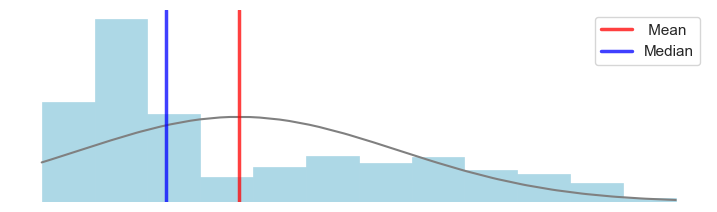

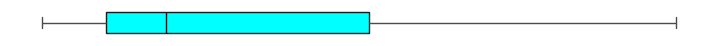


Skewness (Degree of Assymetry Around The Mean) = 0.8
Positive  Skewness:  Mode<Median<Mean  (Right-Tail)

Kurtosis (Degree of Thickness of Tails) = -0.7
PlatyKurtic Distribution:   Relatively-Flat  with  Few-Outliers  (Flat-Tails)  Desirable-Curve!!

Anderson-Darling Normality Test:
Probably not Gaussian  @ significance_level = 5%   ---   stat=11014.478 ≮  critical_value=0.787
Probably not Gaussian  @ significance_level = 1%   ---   stat=11014.478 ≮  critical_value=1.092



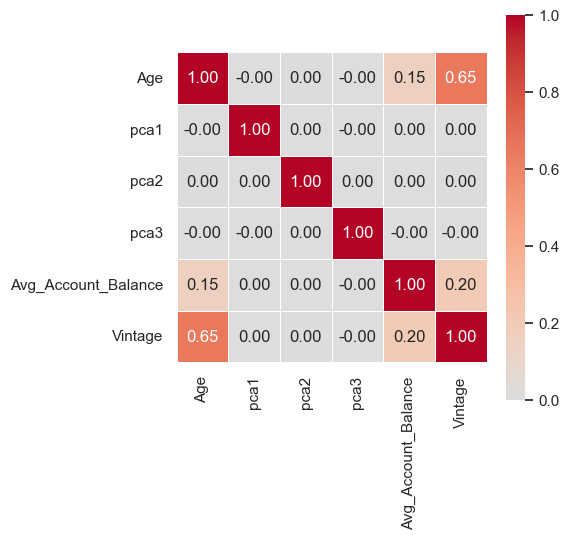

In [36]:
# (auto)
print('\n There are',len(sclrs),'scalar features:\n', list(sclrs) )  


for sclr in sclrs:
    
    print('\n\n\n',sclr)
    L   = df_raw[sclr].to_pandas().copy().dropna()
    
    # Density Curve:
    h   = sorted( np.asarray(L) ) 
    fit = norm.pdf( h, np.mean(h), np.std(h) )
    fig, ax = plt.subplots( figsize=(9,2.5) )
    ax.plot( h, fit, color='gray', linestyle='-', linewidth=1.5 )
    ax.hist( L, density=True, bins=12, linewidth=.5, edgecolor='lightblue', facecolor='lightblue' )
    Mean, Median = L.mean(), L.median() 
    plt.axvline(Mean  ,color='red' ,linewidth=2.5,label=' Mean' , alpha=.75)
    plt.axvline(Median,color='blue',linewidth=2.5,label='Median', alpha=.75)
    ax.set_yticks([]); ax.legend(); #plt.title(sclr); 
    plt.axis('off')
    fig.savefig('univar_'+sclr+'_hist_.png',bbox_inches='tight',dpi=120);   plt.show()
    
    # BoxPlot
    boxprops    = dict( edgecolor = 'k', facecolor  = 'cyan', linewidth = 1 )
    medianprops = dict( color     = 'k', linewidth  = 1  )
    flierprops  = dict( marker    = 'd', markersize = 7, markerfacecolor = 'red', markeredgecolor = 'red' ) 
                  
    plt.figure(  figsize=(9,.35)  )
    sns_plot = sns.boxplot( x=L
                          , boxprops    = boxprops
                          , medianprops = medianprops
                          , flierprops  = flierprops  
                          )
    #plt.title(sclr)
    plt.xlabel('')
    plt.axis('off')
    fig = sns_plot.get_figure(); fig.savefig('univar_'+sclr+'_BoxPlot_.png',bbox_inches='tight',dpi=120);   plt.show()
    
    
    # Univariate Analysis
    
    # Skewness
    Skewness = np.round(L.skew(),1)
    Skewness_Type      = None
    Skewness_interpret = None
    if   Skewness >0:
        Skewness_Type, Skewness_interpret = 'Positive ', 'Mode<Median<Mean  (Right-Tail)'
    elif Skewness==0:
        Skewness_Type, Skewness_interpret = 'Zero '    , 'Mean=Median=Mode  (Equal Tails)'
    elif Skewness <0:
        Skewness_Type, Skewness_interpret = 'Negative ', 'Mean<Median<Mode  (Left-Tail)'
    print( '\nSkewness (Degree of Assymetry Around The Mean) =', Skewness )
    print( Skewness_Type, 'Skewness: ', Skewness_interpret )


    # Kurtosis
    Kurtosis          = np.round(L.kurt(),1)
    Krtosis_Type      = None
    Krtosis_interpret = None
    if   Kurtosis >0:
        Krtosis_Type, Krtosis_interpret = 'LeptoKurtic', ' Relatively-Peaked  with  Many-Outliers  (Heavy-Tails)'
    elif Kurtosis==0:
        Krtosis_Type, Krtosis_interpret = 'MesoKurtic' , ' (Normal)'
    elif Kurtosis <0:
        Krtosis_Type, Krtosis_interpret = 'PlatyKurtic', ' Relatively-Flat  with  Few-Outliers  (Flat-Tails)  Desirable-Curve!!'
    print( '\nKurtosis (Degree of Thickness of Tails) =', Kurtosis )
    print( Krtosis_Type, 'Distribution: ', Krtosis_interpret )
    
    
    # Anderson-Darling Normality Test
    from scipy.stats import anderson 
    print("\nAnderson-Darling Normality Test:")
    result = anderson(L)
    FIT      = result.fit_result;          #print( 'fit_result:' ); print(FIT ,'\n')
    stat     = result.statistic;           
    stat     = np.round(stat,3);           #print( 'stat                    = %.3f' % (stat) ) 
    C_VALs   = result.critical_values;     #print( 'Critical_Values         ='      , C_VALs )
    SIG_LVLs = result.significance_level;  #print( 'Significance_Levels (%) ='    , SIG_LVLs, '\n' ) 
    C_VALs, SIG_LVLs = [ C_VALs[-3],C_VALs[-1] ], [ SIG_LVLs[-3], SIG_LVLs[-1] ]
    for i in range(len(C_VALs)):
        sig_lvl, c_val = SIG_LVLs[i], C_VALs[i]
        if stat < c_val:   print( 'Probably Gaussian  @ significance_level = '    +str(int(np.round(sig_lvl,1)))
                                +'%   ---   stat='+str(stat)+' < critical_value=' +str(c_val) )
        else           :   print( 'Probably not Gaussian  @ significance_level = '+str(int(np.round(sig_lvl,1)))
                                +'%   ---   stat='+str(stat)+' ≮  critical_value='+str(c_val) ) 
            
# Correlation-Matrix
print('')
fig, ax  = plt.subplots(figsize=(5,5))
corr     = df_raw[sclrs].to_pandas().corr('pearson')
sns_plot = sns.heatmap( corr,  mask=np.zeros_like(corr,dtype=bool),  cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
sns_plot.get_figure().savefig('heatmap.png',bbox_inches='tight',dpi=360); plt.show()

''' 
# Hist
df_raw[ sclrs ].hist(bins=32,grid=False,color='dodgerblue',figsize=(13,7.3)); plt.show()

# kde
for i in range(len(sclrs)):
    fig = sns.pairplot( df_raw[[sclrs[i]]], diag_kind='kde', height=3, aspect=1.78 )
    fig.savefig('kde_'+sclrs[i]+'.png',bbox_inches='tight',dpi=360); plt.tight_layout(); plt.show()
''' 
pass

#####   

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Importance Factors

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble        import RandomForestClassifier
from sklearn.inspection      import permutation_importance
from sklearn.preprocessing   import OneHotEncoder
from sklearn.compose         import ColumnTransformer

In [47]:
try:
    cats.remove('Month')
    cats.remove('Region_Code')
    
    
    
    cats.remove('Tenthiles')
    sclrs.remove('pca1')
    sclrs.remove('pca2')
    sclrs.remove('pca3')
except:
    ;

In [48]:
new_cats = [ ]
df = df_raw[cats+sclrs].to_pandas()
DF = df[cats].copy()
for sclr in sclrs:
    A = []
    P = []
    if sclr==estimated_column:
        for i in np.arange(15,101,15).tolist():
            p = np.percentile(df[sclr],i)
            P.append(p)
        for val in df[sclr]:
            i=0
            while val>P[i] and i<len(P)-1:
                i=i+1
            A.append(sclr+'_P'+str(i))
    else:
        for i in np.arange(25,101,25).tolist():
            p = np.percentile(df[sclr],i)
            P.append(p)
        for val in df[sclr]:
            i=0
            while val>P[i] and i<len(P)-1:
                i=i+1
            A.append(sclr+'_P'+str(i))
    new_cat = sclr+'_Percentiles'
    new_cats.append( new_cat )
    DF[new_cat] = A

df['I']=''
for c in cats+new_cats:
    df['I'] = DF[c] +'_'+ df['I']
del DF
len( df['I'].unique() )

10417

In [49]:
df.head(3)

,Occupation,Channel_Code,Credit_Product,Gender,Is_Active,Is_Lead,Age,Avg_Account_Balance,Vintage,I
0,Salaried,X3,No,Female,No,Yes,28,1067101,19,Vintage_P0_Avg_Account_Balance_P2_Age_P0_Yes_N...
1,Salaried,X1,No,Male,No,Yes,26,1162206,14,Vintage_P0_Avg_Account_Balance_P2_Age_P0_Yes_N...
2,Salaried,X1,No,Male,No,Yes,28,2234879,14,Vintage_P0_Avg_Account_Balance_P3_Age_P0_Yes_N...


In [50]:
new = pd.DataFrame( df['I'].value_counts() )
new['Uniq'] = new.index
new.index = range(new.shape[0])
for i in new.index:
    if new.loc[i,'I'] < 4:
        new.loc[i,'Uniq'] = None
new = new['Uniq'].dropna().tolist()
print(len(new))

6042


In [51]:
A = []
for val in df['I']:
    if val in new:
        A.append(val)
    else:
        A.append('Other')
df['I'] = A
df

,Occupation,Channel_Code,Credit_Product,Gender,Is_Active,Is_Lead,Age,Avg_Account_Balance,Vintage,I
0,Salaried,X3,No,Female,No,Yes,28,1067101,19,Other
1,Salaried,X1,No,Male,No,Yes,26,1162206,14,Vintage_P0_Avg_Account_Balance_P2_Age_P0_Yes_N...
2,Salaried,X1,No,Male,No,Yes,28,2234879,14,Vintage_P0_Avg_Account_Balance_P3_Age_P0_Yes_N...
3,Salaried,X1,No,Female,No,Yes,28,535673,32,Vintage_P1_Avg_Account_Balance_P0_Age_P0_Yes_N...
4,Salaried,X1,No,Male,No,Yes,27,633457,18,Vintage_P0_Avg_Account_Balance_P1_Age_P0_Yes_N...
...,...,...,...,...,...,...,...,...,...,...
216158,Self_Employed,X3,No,Female,No,No,54,2428614,87,Vintage_P3_Avg_Account_Balance_P3_Age_P5_No_No...
216159,Other,X3,Yes,Male,Yes,No,68,1733568,91,Vintage_P3_Avg_Account_Balance_P3_Age_P5_No_Ye...
216160,Other,X3,Yes,Female,Yes,No,81,1303271,99,Vintage_P3_Avg_Account_Balance_P2_Age_P5_No_Ye...
216161,Other,X2,No,Female,Yes,Yes,65,487453,91,Vintage_P3_Avg_Account_Balance_P0_Age_P5_Yes_Y...


In [52]:
Sample = df.groupby('I', group_keys=False).apply(lambda x: x.sample(n=4))
Sample.index = range(Sample.shape[0])

X  = Sample.drop( estimated_column, axis=1 )
y  = Sample[ estimated_column ]

del Sample
X

,Occupation,Channel_Code,Credit_Product,Gender,Is_Active,Is_Lead,Avg_Account_Balance,Vintage,I
0,Salaried,X3,No,Female,No,Yes,381267,32,Other
1,Self_Employed,X1,No,Female,Yes,Yes,776774,92,Other
2,Salaried,X1,No,Male,Yes,Yes,1243552,50,Other
3,Self_Employed,X1,Yes,Male,Yes,No,2519785,21,Other
4,Other,X1,No,Female,No,No,340976,13,Vintage_P0_Avg_Account_Balance_P0_Age_P0_No_No...
...,...,...,...,...,...,...,...,...,...
24167,Salaried,X3,Yes,Male,Yes,Yes,1442601,99,Vintage_P3_Avg_Account_Balance_P3_Age_P5_Yes_Y...
24168,Self_Employed,X3,Yes,Male,Yes,Yes,2634408,128,Vintage_P3_Avg_Account_Balance_P3_Age_P5_Yes_Y...
24169,Self_Employed,X3,Yes,Male,Yes,Yes,1507526,123,Vintage_P3_Avg_Account_Balance_P3_Age_P5_Yes_Y...
24170,Self_Employed,X3,Yes,Male,Yes,Yes,1634832,99,Vintage_P3_Avg_Account_Balance_P3_Age_P5_Yes_Y...


In [53]:
preprocessor = ColumnTransformer(
      transformers=[('cat', OneHotEncoder(handle_unknown='ignore'), cats )]
    , remainder='passthrough'  # Keep other columns (numerical)
    )

In [54]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.75, random_state=RANDOM_STATE, stratify=X['I'] )

X_train = X_train.drop(['I'], axis=1 )
X_test  = X_test.drop( ['I'], axis=1 )

X_train = preprocessor.fit_transform(X_train)
X_test  = preprocessor.transform(X_test)

X_train.shape

(6043, 18)

In [55]:
model = RandomForestClassifier( random_state=RANDOM_STATE )
model.fit( X_train, y_train )

RandomForestClassifier(random_state=3)

In [56]:
result = permutation_importance( model, X_test, y_test, n_repeats=2, random_state=RANDOM_STATE, n_jobs=-1 )

In [57]:
if isinstance(X_train, pd.DataFrame):
    feature_names = X_train.columns
else: # Handle sparse matrices
    feature_names = preprocessor.get_feature_names_out()

In [72]:
sorted_importances_idx = result.importances_mean.argsort()[::-1]
A,B = [],[] 
for i in sorted_importances_idx:
    A.append( feature_names[i].split('__')[1]           )
    B.append( (result.importances_mean[i])/(sum(result.importances_mean)) )
df = pd.DataFrame()
df['feature']        = A
df['IMP Factor (%)'] = np.round( 100*np.array(B), 1 )
df.index             = df['feature'].values
df                   = df[['IMP Factor (%)']]
df

,IMP Factor (%)
Vintage,43.5
Occupation_Salaried,21.3
Channel_Code_X1,21.3
Avg_Account_Balance,10.3
Occupation_Self_Employed,6.3
Is_Active_Yes,2.6
Occupation_Entrepreneur,1.6
Occupation_Other,1.5
Channel_Code_X2,1.3
Is_Lead_No,1.3


<span style="font-family:Arial; font-weight:Bold; font-size:1.5em; color:#00b3e5;"> Importance Factor of SubCats with PCA

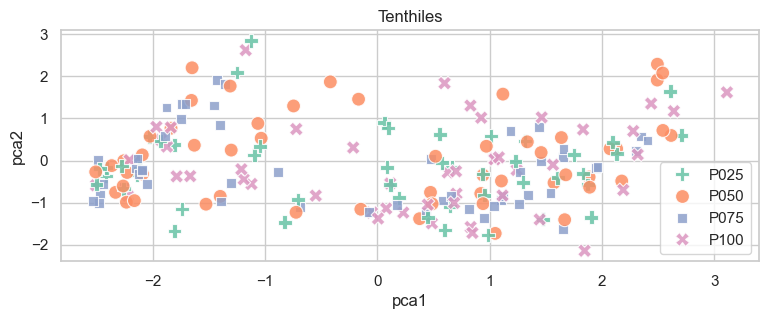


Occupation 
                   IMP Factor (%)
Salaried                21.3
Self_Employed            6.3
Entrepreneur             1.6
Other                    1.5 



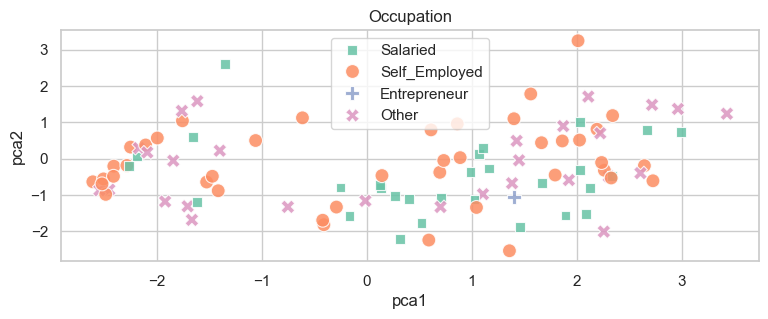


Channel_Code 
        IMP Factor (%)
X1           21.3
X2            1.3
X4            0.1
X3           -1.7 



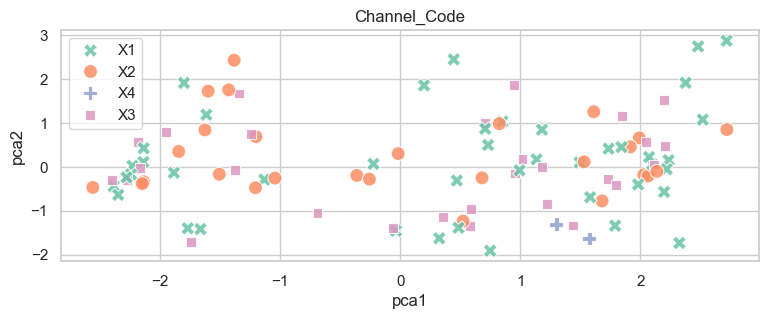


Credit_Product 
         IMP Factor (%)
Yes            1.0
No            -2.6 



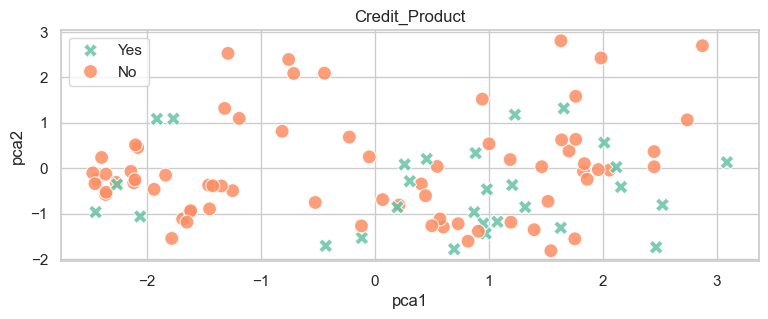


Gender 
            IMP Factor (%)
Male             -1.3
Female           -1.7 



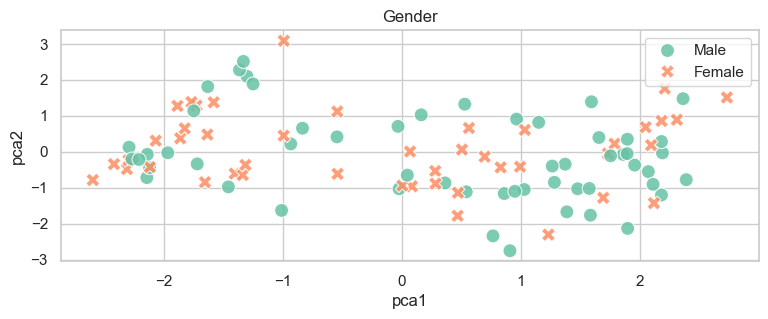


Is_Active 
         IMP Factor (%)
Yes            2.6
No            -1.3 



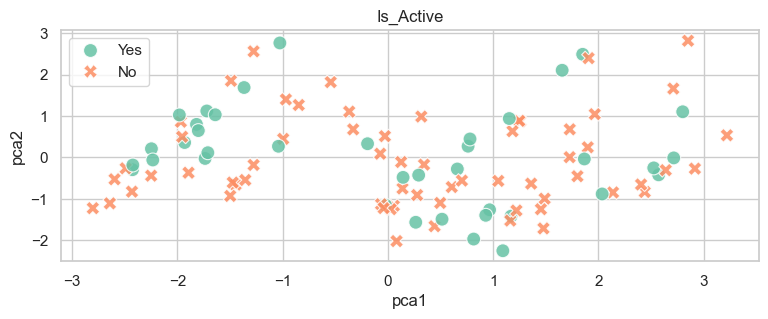


Is_Lead 
         IMP Factor (%)
No             1.3
Yes           -3.6 



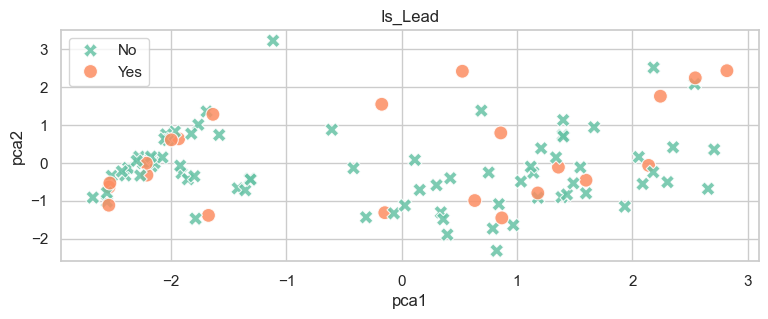

In [95]:
cat     = 'Tenthiles'
subcats =  df_cats.loc[cat,'subcats']
PCA_2D( cat, df_raw[[cat,'pca1','pca2']].to_pandas(), subcats, 200, RANDOM_STATE )

for cat in cats:
    subcats = df_cats.loc[cat,'subcats']
    df2 = pd.DataFrame( index=subcats, columns=['IMP Factor (%)'] )
    for sub in subcats:
        cat_sub = cat+'_'+sub
        df2.loc[ sub, 'IMP Factor (%)' ] = df.loc[cat_sub,'IMP Factor (%)']
    df2 = df2.sort_values('IMP Factor (%)',ascending=False)
    subcats = df2.index.tolist()
    print(); print(cat,'\n    ',df2,'\n')    
    PCA_2D( cat, df_raw[[cat,'pca1','pca2']].to_pandas(), subcats, 100, RANDOM_STATE )

In [44]:
#del A, new, X, y, X_train, X_test, y_train, y_test

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:orange;"> Mini Game --- Cats over Time
 - y = estimated_column
 - x = sclr_time
 - plot = sub_cats

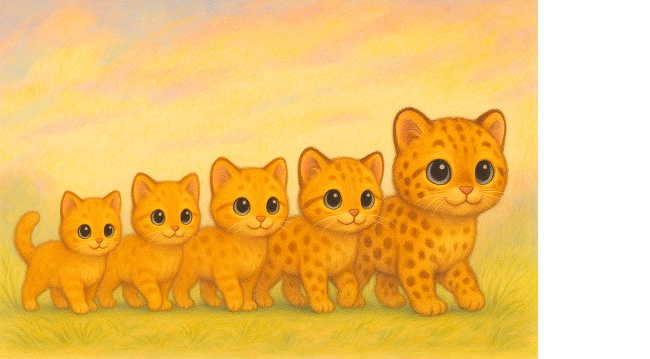

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:deeppink;"> estimated_column over Time

In [153]:
# input
sclr_time = 'year'            # x

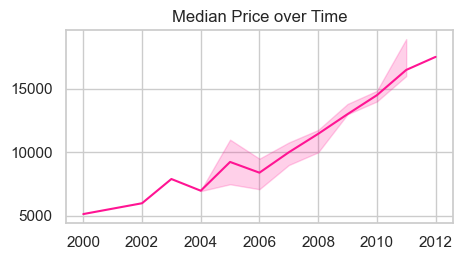

In [154]:
# auto
sclr2     = estimated_column  # y 

# lineplot (mean)
plt.figure(figsize=(5,2.5)) 
sns_plot  = sns.lineplot( data=df_raw, x=sclr_time, y=sclr2, estimator='mean', markers=True
                        , color='deeppink', palette=Palette )  # hue='cat1', style='cat2'
plt.xlabel(''); plt.ylabel('');  #plt.axis('off');  plt.xticks(rotation=30)
plt.title('Mean '+(sclr2).title()+' over Time')
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr_time+'_lineplot.png'); plt.show()

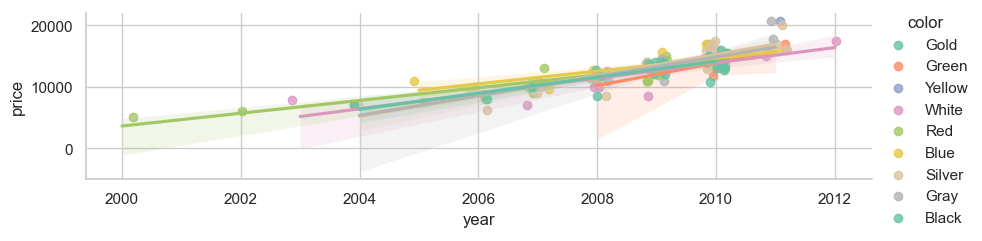

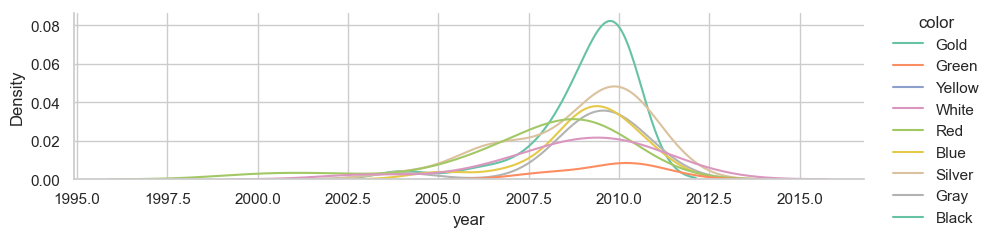

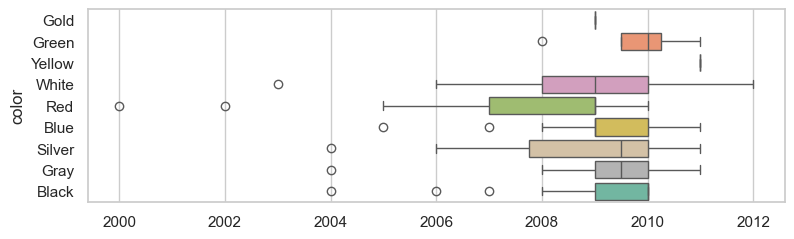

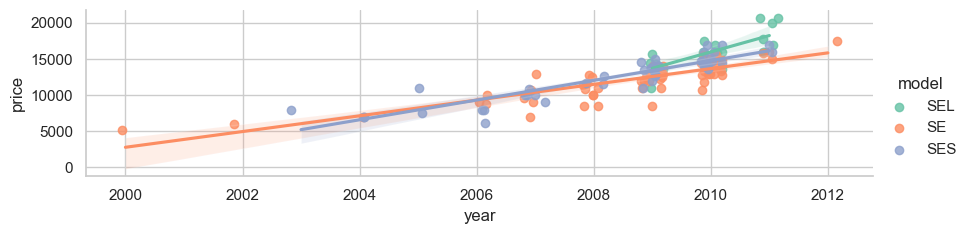

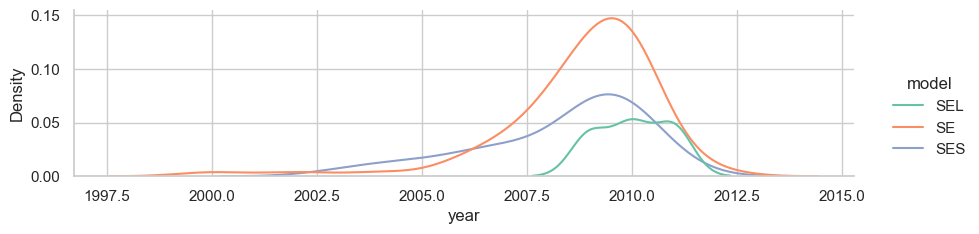

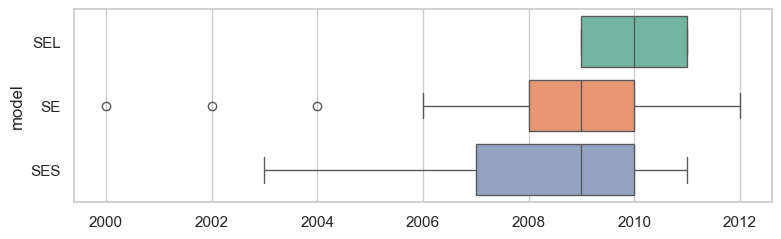

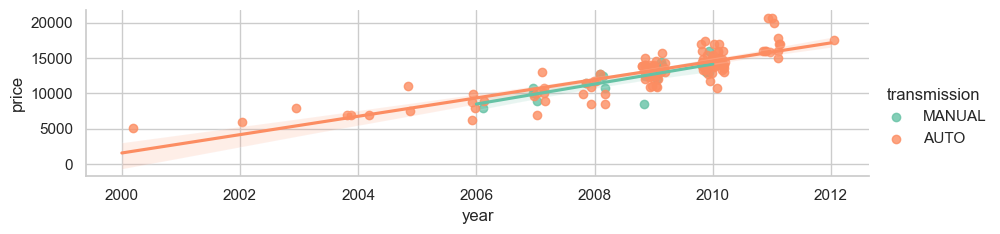

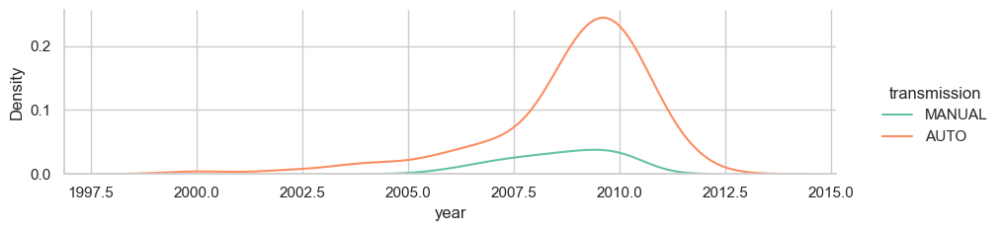

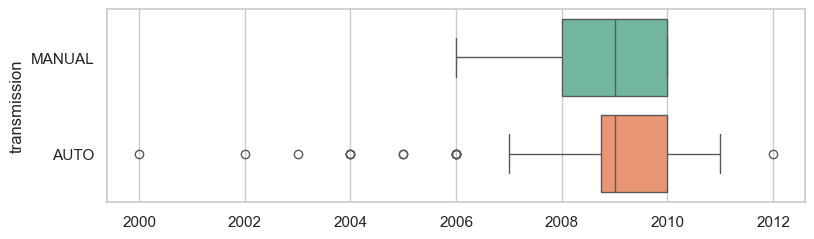

In [155]:
for cat in cats:
    SubCats = df_cats.loc[cat,'subcats']
    
    # ImPlot 
    sns.lmplot( x=sclr_time, y=sclr2, data=df_raw, hue=cat, palette=Palette, height=2.5, aspect=9/2.5, x_jitter=0.2, hue_order=SubCats ); plt.show() 

    # displot 
    sns_plot = sns.displot( data=df_raw, x=sclr_time, hue=cat, kind="kde", height=2.5, aspect=9/2.5, palette=Palette, hue_order=SubCats )
    sns_plot.savefig('bivar_'+cat+'_'+sclr_time+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()

    # BoxPlot
    plt.figure(figsize=(9,2.5))
    sns_plot = sns.boxplot( y=cat, x=sclr_time, data=df_raw, linewidth=1.0, palette=Palette, order=SubCats )
    plt.xlabel(''); #plt.axis('off'); #plt.title(sclr)
    fig = sns_plot.get_figure(); fig.savefig('bivar_'+cat+'_'+sclr+'_BoxPlot_.png',bbox_inches='tight',dpi=120);   plt.show()


In [156]:
def group_and_aggregate( df_raw, sclr_time, estimated_column, cat ):
    summary = df_raw.groupby( [sclr_time, cat] ).agg(
        mean = (estimated_column,'mean'),
        count  = (estimated_column, 'size' )
        ).reset_index()
    summary['mean '+estimated_column] = summary['mean'].copy()
    summary = summary.drop(['mean'],axis=1)
    return summary    

def add_jittery( df, ft, jit ):
    np.random.seed(0)
    return df[ft].copy() + np.random.uniform( -jit, +jit, size=df.shape[0] )

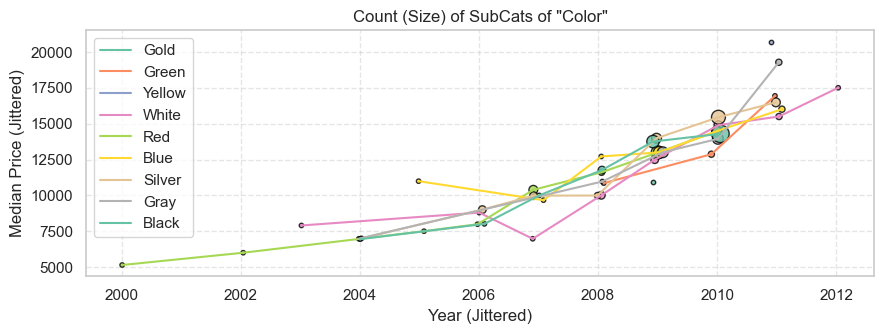

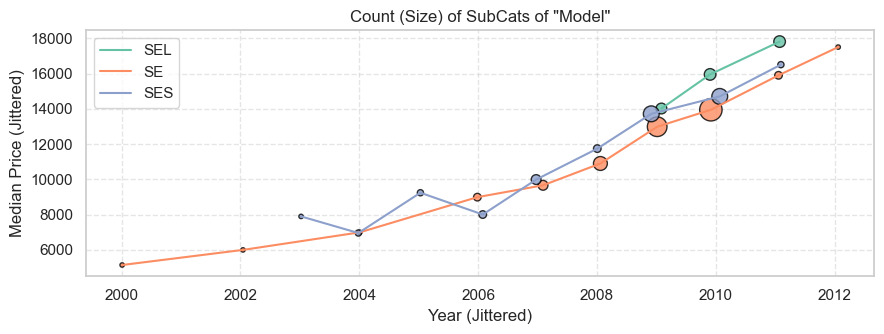

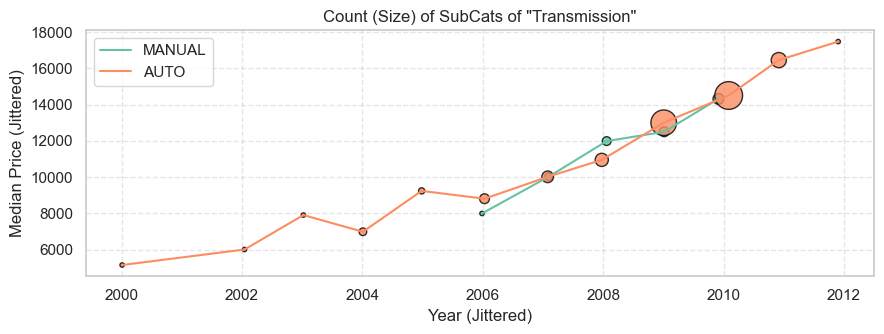

In [157]:
for cat in cats:
    
    # SubCats
    SubCats = df_cats.loc[cat,'subcats']
    
    # group and aggregate
    summary = group_and_aggregate( df_raw, sclr_time, estimated_column, cat )
    
    # add jitter
    summary['jittery '       +    sclr_time   ] = add_jittery( summary, sclr_time        , .1 )
    summary['jittery mean '+estimated_column] = add_jittery( summary, 'mean '+estimated_column, 20 ) 
    
    # normalize size
    summary['size'] = summary['count']*10
    
    # set color palette
    Palette = sns.color_palette('Set2',n_colors=len(SubCats))
    cat_colors = dict(zip(SubCats,Palette))
    
    # Plot
    plt.figure(figsize=(9,3.5))
    for subcat in SubCats:
        data = summary[ summary[cat]==subcat ]
        plt.plot(    data['jittery '+sclr_time], data['jittery mean '+estimated_column], 
                     color=cat_colors[subcat], label=subcat, linestyle='-', marker='o', markersize=0 ) # line only
        plt.scatter( data['jittery '+sclr_time], data['jittery mean '+estimated_column], 
                     s=data['size'], color=cat_colors[subcat], edgecolor='black', alpha=0.8
                   )
        #for _, row in data.iterrows():
        #    plt.text(row['jittery '+sclr_time], row['jittery mean '+estimated_column]+300,
        #            f"n={row['count']}", ha='center', fontsize=9 )
    plt.xlabel(sclr_time.title()+' (Jittered)')
    plt.ylabel('Mean '+estimated_column.title()+' (Jittered)')
    plt.title('Count (Size) of SubCats of "'+cat.title()+'"')
    plt.legend(title=''); plt.grid(True,linestyle='--',alpha=0.5)
    plt.tight_layout(); plt.show()

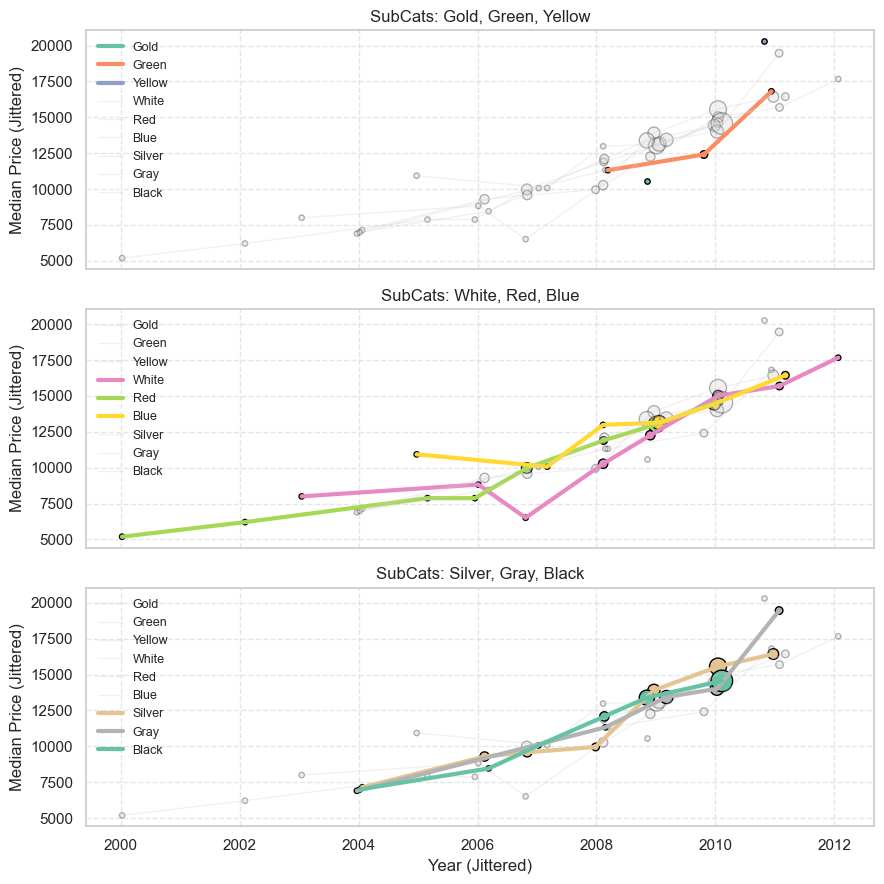

In [158]:
for cat in cats:
    
    # SubCats
    SubCats = df_cats.loc[cat,'subcats']
    
    # group and aggregate
    summary = group_and_aggregate( df_raw, sclr_time, estimated_column, cat )
    
    # add jitter
    summary['jittery '       +    sclr_time   ] = add_jittery( summary, sclr_time        , .2 )
    summary['jittery mean '+estimated_column] = add_jittery( summary, 'mean '+estimated_column, 500 )
    
    # Settings
    cats_per_plot = 3
    n_plots = int(np.ceil( len(SubCats) / cats_per_plot ))
    
    # normalize size
    summary['size'] = summary['count']*15
    
    # set color palette
    Palette = sns.color_palette('Set2',n_colors=len(SubCats))
    cat_colors = dict(zip(SubCats,Palette))
    
    # Plot
    if n_plots > 1:
        
        # Setup figure
        fig, axes = plt.subplots( n_plots, 1, figsize=(9,n_plots*3), sharex=True, sharey=True )
        if n_plots==1: axes = [axes]
            
        for i in range(n_plots):
            ax = axes[i]
            start = i * cats_per_plot
            end = start + cats_per_plot
            highlight_SubCats = SubCats[start:end]
        
            for subcat in SubCats:
                subcat_data = summary[ summary[cat]==subcat ]
                color = cat_colors[subcat] if subcat in highlight_SubCats else 'lightgray'
                alpha = 1.0 if subcat in highlight_SubCats else 0.3
                lw = 3 if subcat in highlight_SubCats else 1
                # line plot
                ax.plot(    subcat_data['jittery '+sclr_time], subcat_data['jittery mean '+estimated_column], 
                            label=subcat, color=color, linestyle='-', alpha=alpha, linewidth=lw, marker='o', markersize=0 
                       )    # line only
                # scatter plot
                ax.scatter( subcat_data['jittery '+sclr_time], subcat_data['jittery mean '+estimated_column], 
                            s=subcat_data['size'], color=color, edgecolor='black', alpha=alpha
                          )
                #for _, row in data.iterrows():
                #    plt.text(row['jittery '+sclr_time], row['jittery mean '+estimated_column]+300,
                #            f"n={row['count']}", ha='center', fontsize=9 )
            ax.set_title( f"SubCats: {', '.join(highlight_SubCats)}")
            ax.set_ylabel('Mean '+estimated_column.title()+' (Jittered)')
            ax.legend(fontsize=9,frameon=False)
            ax.grid(True,linestyle='--',alpha=0.5)
    
        axes[-1].set_xlabel(sclr_time.title()+' (Jittered)')
        plt.tight_layout(); plt.show()

#####     

#####     

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> 3D PCA

In [ ]:
try:
    sclr1 = 'pca1'
    sclr2 = 'pca2'
    sclr3 = 'pca3'
    cat1  = 'Percentiles'

    D = { 'P10':'cyan',
          'P25':'blue',
          'P50':'orange',
          'P75':'green',
          'P90':'pink',
          'P99':'red'
        }

    fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
    try:
        ax.scatter( df_raw[sclr1], df_raw[sclr2], df_raw[sclr3], c=df_raw[cat1].replace(D), palette=Palette )
    except:
        ax.scatter( df_raw[sclr1], df_raw[sclr2], df_raw[sclr3], c=['dodgerblue'], palette=Palette )
    ax.set(xticklabels=[],
           yticklabels=[],
           zticklabels=[])
    plt.show()
except:
    ;

#####     

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> 1 Cat

In [39]:
# help
print(' There are '+str(len(cats))+' cats:\n',cats, '\n')

 There are 3 cats:
 ['model', 'color', 'transmission'] 



#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified


color:

         Sub_Count
Black          32
Silver         32
Red            24
Blue           17
Gray           16
White          16
Green           5
None            4
Yellow          3
Gold            1 

color
Records of Missing Values:  [118, 124, 142, 121] 




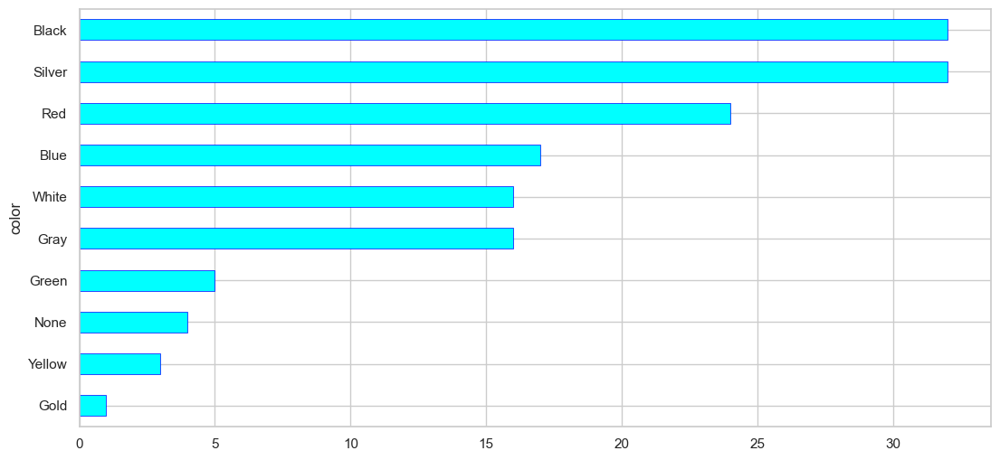

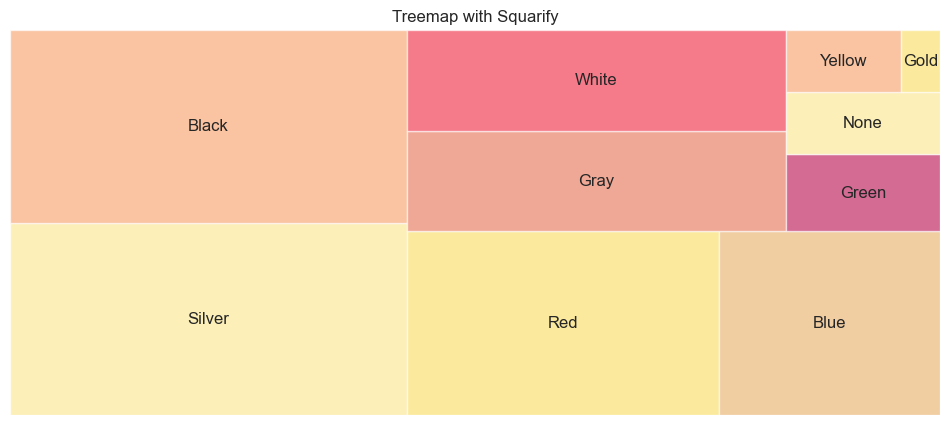

In [61]:
# (input)
cat = 'color'

# (auto)
# subcats
i = -1
for c in cats:
    i = i+1
    if c==cat: subcats = SubCats[i]
        
# Frequency Table  
freq_tab = pd.crosstab( index=df_raw[cat].astype('str'), columns='count' )# frequency_table 
freq_tab = pd.crosstab( index=df_raw[cat].astype('str'), columns='Sub_Count' )
Val, Ind = freq_tab.values, freq_tab.index.values
freq_tab = pd.DataFrame( Val, index=Ind, columns=['Sub_Count'] ).sort_values(['Sub_Count'],ascending=[False]) 
print( '\n'+cat+':\n\n', freq_tab, '\n' )

# Missing Values
NoneRecords = df_raw[ df_raw[cat].isna() ].index.tolist()
NoneRecords = list(np.array(NoneRecords)+2)
print(cat+'\nRecords of Missing Values: ', NoneRecords ,'\n\n')

# Scatter-Plot of PCA 
try:
    sclr1 = 'pca1'
    sclr2 = 'pca2'
    cat1  =  cat
 
    sns.set(rc={'figure.figsize':(12,5)}); sns.set(style='whitegrid')
    sns_plot = sns.scatterplot( data=df_raw, x=sclr1, y=sclr2, markers=True, hue=cat1, style=cat1 ) # ,size=sclr2
    fig = sns_plot.get_figure(); fig.savefig('scatterplot.png',bbox_inches='tight',dpi=360); plt.show(); print() 
except:
    ;

# Barh
L = df_raw[cat].astype('str')
N = min( 35, int(L.nunique()*.67) )
fig, ax = plt.subplots(figsize=(13, N))
L.value_counts(normalize=False).sort_values().plot.barh(linewidth=.5, edgecolor='blue', facecolor='cyan')
plt.show();print()


# TreeMap
import squarify   #pip install squarify
TreeMap_Series = L.value_counts(normalize=True)
label  = TreeMap_Series.index
sizes  = list( TreeMap_Series )
colors = ['#fae588','#f79d65','#f9dc5c','#e8ac65','#e76f51','#ef233c','#b7094c'] #color palette

squarify.plot(sizes=sizes, label=label, alpha=0.6,color=colors).set(title='Treemap with Squarify')
plt.axis('off'); plt.show(); print()



# TreeMap --- plotly
import plotly.express as px
df_counts = df_raw[[cat]].copy().groupby([cat]).size().reset_index(name='Count')

fig = px.treemap( df_counts, path=[cat], values='Count', color='Count', 
                  color_continuous_scale="Blues", #px.colors.sequential.Teal,
                  hover_data={'Count':True}
                )
fig.update_traces(
    texttemplate="<b>%{label}</b><br>Count: %{value}",
    textposition="middle center",
    marker      =dict( 
        line=dict(color="blue",width=0),
        pad ={"t":3.,"l":3.,"r":3.,"b":3.}
    ),
    root_color  ="white",
    insidetextfont=dict(family="MV Boli",size=16), #color='black' 
                 )
fig.update_layout(
    title={
        'text':'Count of SubCats of '+cat,
        'y'   : 0.97,
        'x'   : 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20, family='MV Boli')
    }, width=900, height=700, margin=dict(t=50, l=25, r=25, b=25)
)
fig.write_image('treemap'+cat+".png" )   # pip install -U kaleido
fig.show()

#####   

#####   
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Info

In [10]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 2 to 151
Data columns (total 6 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   year          148 non-null    float32
 1   model         145 non-null    object 
 2   price         148 non-null    float32
 3   mileage       148 non-null    float32
 4   color         146 non-null    object 
 5   transmission  147 non-null    object 
dtypes: float32(3), object(3)
memory usage: 5.4+ KB


#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:deeppink;"> Descriptive Statistics

In [17]:
# help
sclrs

['price', 'year', 'mileage']

In [18]:
# input
sclr = 'year'

# auto
pd.DataFrame( np.round( df_raw[sclr].copy().dropna().describe(), 1 ))

,year
count,148.0
mean,2008.7
std,2.2
min,2000.0
25%,2008.0
50%,2009.0
75%,2010.0
max,2012.0


#####   

#####   

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> 1 Scalar

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [20]:
# help
print('\n There are '+str(len(sclrs))+' sclrs:\n',sclrs, '\n')


 There are 3 sclrs:
 ['price', 'year', 'mileage'] 



<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

count      148.00
mean     12920.92
std       3121.21
min       3800.00
25%      10995.00
50%      13504.50
75%      14894.75
max      21992.00
Name: price, dtype: float64 

price
Records of Missing Values:  [150, 151] 


price
Records of Extreme Outliers:  [] 


Empty DataFrame
Columns: [price]
Index: []



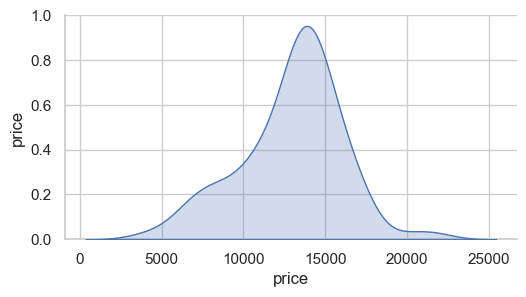

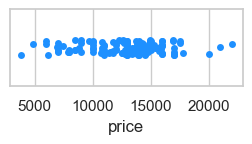

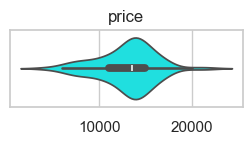

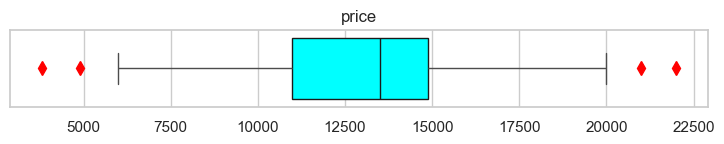

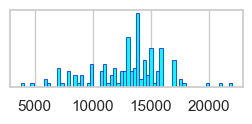

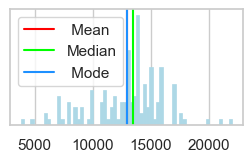

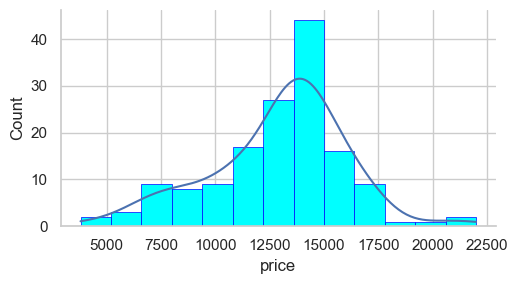


Skewness (Degree of Assymetry Around The Mean) = -0.4
Negative Skewness:  Mean<Median<Mode  (Left-Tail)

Kurtosis (Degree of Thickness of Tails) = 0.5
LeptoKurtic Distribution:  Relatively-Peaked  with  Many-Outliers (Heavy-Tails)


Shapiro-Wilk Normality Test:
stat=0.966, p=0.001
Probably not Gaussian

D'Agostino's K^2 Normality Test:
stat=5.920, p=0.052
Probably Gaussian


Anderson-Darling Normality Test:

fit_result:
  params: FitParams(loc=12920.9189453125, scale=3121.213623046875)
 success: True
 message: '`anderson` successfully fit the distribution to the data.' 

stat                    = 2.165
Critical_Values         = [0.561 0.639 0.767 0.895 1.064]
Significance_Levels (%) = [15.  10.   5.   2.5  1. ] 

Probably not Gaussian  @ significance_level = 15.0%   ---   stat=2.165 ≮  critical_value=0.561
Probably not Gaussian  @ significance_level = 10.0%   ---   stat=2.165 ≮  critical_value=0.639
Probably not Gaussian  @ significance_level = 5.0%   ---   stat=2.165 ≮  critical_valu

In [21]:
# (input)
sclr = 'price'   # estimated_column
            
# (auto)            
# Univariate Analysis
L = df_raw[sclr].copy()
print( np.round( L.describe(), 2 ), '\n' )

# Missing Values
NoneRecords = L[ L.isna() ].index.tolist()
NoneRecords = list(np.array(NoneRecords)+2)      
print(sclr+'\nRecords of Missing Values: ',NoneRecords,'\n\n')

# Extreme Outliers
Extremes = find_extreme_outliers(df_raw,sclr)
print(sclr+'\nRecords of Extreme Outliers: ',Extremes,'\n\n')
print(df_raw.loc[Extremes,[sclr]])
print()
    
    
# pair-plot
sns.pairplot( df_raw[[sclr]], diag_kind='kde', height=3, aspect=1.78, dropna=True )
#plt.tight_layout()
plt.show()

# strip-plot
plt.figure(  figsize=(3,1)  )
sns.stripplot( data=df_raw, x=sclr, color='dodgerblue' ); plt.show()

# ViolinPlot
plt.figure(  figsize=(3,1)  )
sns.violinplot( x=L
              , color = 'cyan'
              )
plt.title(sclr)
plt.xlabel('') 
#plt.xlim(min(L),max(L))
plt.xlabel('')
plt.show()

# BoxPlot
boxprops    = dict( edgecolor = 'k', facecolor  = 'cyan', linewidth = 1 )
medianprops = dict( color     = 'k', linewidth  = 1  )
flierprops  = dict( marker    = 'd', markersize = 7, markerfacecolor = 'red', markeredgecolor = 'red' ) 
                  
plt.figure(  figsize=(9,1)  )
sns.boxplot( x=L
           , boxprops    = boxprops
           , medianprops = medianprops
           , flierprops  = flierprops  
           )
plt.title(sclr)
plt.xlabel('') 
plt.show()


# Histogram: 
fig, ax = plt.subplots( figsize=(3,1) )
ax.hist( L, density=True, bins=64, linewidth=.5, edgecolor='blue', facecolor='cyan' )
ax.set_yticks([]) 
plt.show()

# Density Curve:
from scipy.stats import norm 
h = sorted( np.asarray(L) ) 
fit = norm.pdf( h, np.mean(h), np.std(h) )
fig, ax = plt.subplots( figsize=(3,1.5) )
ax.plot( h, fit, color='gray', linestyle='-', linewidth=1.5 )
ax.hist( L, density=True, bins=64, linewidth=.5, edgecolor='lightblue', facecolor='lightblue' )
Mean = L.mean()
Median = L.median()
Mode = L.mode() 
plt.axvline(Mean,color='red',linewidth=1.5,label=' Mean')
plt.axvline(Median,color='lime',linewidth=1.5,label='Median')
for i in range(len(Mode)): plt.axvline(Mode[i],color='dodgerblue',linewidth=1.5,label=' Mode')
ax.set_yticks([]) 
ax.legend()
#plt.title('Normal Dist. with Same Mean & SD')
plt.show()

# displot:
sns.displot(data=df_raw, x=sclr, kde=True, linewidth=.5, edgecolor='blue', facecolor='cyan', height=3, aspect=1.78)
plt.show()



##
## Skewness & Kurtosis
##

# Skewness
Skewness = np.round(L.skew(),1)
Skewness_Type      = None
Skewness_interpret = None
if   Skewness >0:
    Skewness_Type, Skewness_interpret = 'Positive', 'Mode<Median<Mean  (Right-Tail)'
elif Skewness==0:
    Skewness_Type, Skewness_interpret = 'Zero'    , 'Mean=Median=Mode  (Equal Tails)'
elif Skewness <0:
    Skewness_Type, Skewness_interpret = 'Negative', 'Mean<Median<Mode  (Left-Tail)'
print( '\nSkewness (Degree of Assymetry Around The Mean) =', Skewness )
print( Skewness_Type, 'Skewness: ', Skewness_interpret )


# Kurtosis
Kurtosis          = np.round(L.kurt(),1)
Krtosis_Type      = None
Krtosis_interpret = None
if   Kurtosis >0:
    Krtosis_Type, Krtosis_interpret = 'LeptoKurtic', 'Relatively-Peaked  with  Many-Outliers (Heavy-Tails)'
elif Kurtosis==0:
    Krtosis_Type, Krtosis_interpret = 'MesoKurtic' , '(Normal)'
elif Kurtosis <0:
    Krtosis_Type, Krtosis_interpret = 'PlatyKurtic', 'Relatively-Flat  with  Few-Outliers (Flat-Tails)  Desirable-Curve!!'
print( '\nKurtosis (Degree of Thickness of Tails) =', Kurtosis )
print( Krtosis_Type, 'Distribution: ', Krtosis_interpret )



##
## Normality Tests
##
df = df_raw[[sclr]].copy().dropna()

# Shapiro-Wilk Normality Test
from scipy.stats import shapiro
print('\n\nShapiro-Wilk Normality Test:')
np.random.seed(3); 
df = df.sample(n=min(5000,df.shape[0])) 
stat, p = shapiro(df[sclr])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Probably Gaussian')
else: print('Probably not Gaussian')
    
# D'Agostino's K^2 Normality Test
from scipy.stats import normaltest 
print("\nD'Agostino's K^2 Normality Test:")
stat, p = normaltest(df[sclr])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Probably Gaussian')
else: print('Probably not Gaussian')

# Anderson-Darling Normality Test
from scipy.stats import anderson 
print("\n\nAnderson-Darling Normality Test:\n")
result = anderson(df[sclr])
FIT      = result.fit_result;          print( 'fit_result:' ); print(FIT ,'\n')
stat     = result.statistic;           
stat     = np.round(stat,3);           print( 'stat                    = %.3f' % (stat) ) 
C_VALs   = result.critical_values;     print( 'Critical_Values         ='      , C_VALs )
SIG_LVLs = result.significance_level;  print( 'Significance_Levels (%) ='    , SIG_LVLs, '\n' ) 
for i in range(len(C_VALs)):
    sig_lvl, c_val = SIG_LVLs[i], C_VALs[i]
    if stat < c_val:   print( 'Probably Gaussian  @ significance_level = '    +str(np.round(sig_lvl,1))
                            +'%   ---   stat='+str(stat)+' < critical_value=' +str(c_val) )
    else           :   print( 'Probably not Gaussian  @ significance_level = '+str(np.round(sig_lvl,1))
                            +'%   ---   stat='+str(stat)+' ≮  critical_value='+str(c_val) )    
    
'''
# Anderson-Darling Normality Test
from scipy.stats import anderson 
print("\nAnderson-Darling Normality Test")
result = anderson(df[sclr])
print('stat=%.3f' % (result.statistic)) 
for i in range(len(result.critical_values)):
    sl, cv = result.significance_level[i], result.critical_values[i]
    print([sl,cv])
    if result.statistic < cv: print('Probably Gaussian at the %.1f%% level' % (sl))
    else: print('Probably not Gaussian at the %.1f%% level' % (sl))
'''
pass

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> 1 Sclr ( Time )


year:

Number of Missing Values = 0 

count     148.00
mean     2008.71
std         2.21
min      2000.00
25%      2008.00
50%      2009.00
75%      2010.00
max      2012.00
Name: year, dtype: float64 



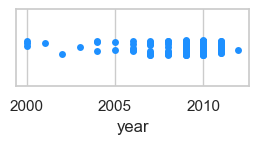

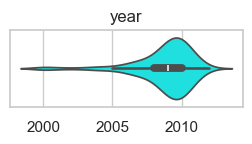

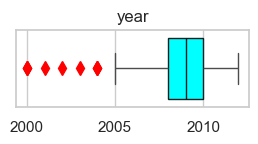

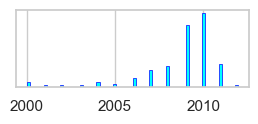

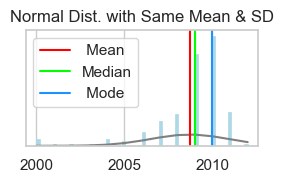

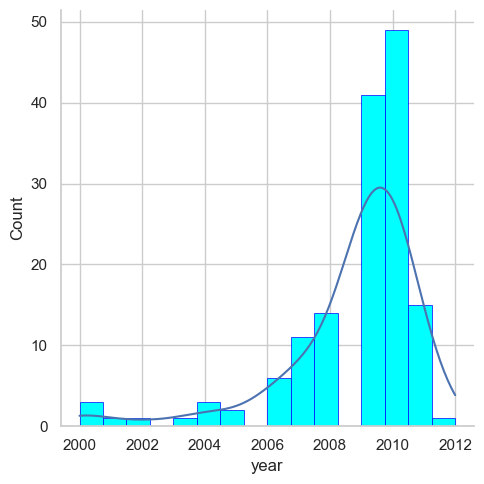


Skewness (Degree of Assymetry Around The Mean) = -2.1
Negative Skewness:  Mean<Median<Mode  (Left-Tail)

Kurtosis (Degree of Thickness of Tails) = 4.9
LeptoKurtic Distribution:  Relatively-Peaked  with  Many-Outliers (Heavy-Tails)


Augmented Dickey-Fuller Unit Root Test
stat=-4.942, p=0.000
Time-Series is "Trend-Stationary"   (mean & variance  remain constant  over time)

Kwiatkowski-Phillips-Schmidt-Shin Test
stat=1.331, p=0.010
Time-Series is "Not Trend-Stationary"   (mean & variance  vary  over time)


In [22]:
# (input)
sclr_time = 'year'


# (auto)            
# Univariate Analysis
L = df_raw[sclr_time].copy().dropna()
#L.value_counts(normalize=True).plot.barh(); plt.show()
print( '\n'+sclr_time+':\n\nNumber of Missing Values =', L.isnull().sum(), '\n' )
print( np.round( L.describe(), 2 ), '\n' )
 

# strip-plot
plt.figure(  figsize=(3,1)  )
sns.stripplot( data=df_raw, x=sclr_time, color='dodgerblue' ); plt.show()

# ViolinPlot
plt.figure(  figsize=(3,1)  )
sns.violinplot( x=L
              , color = 'cyan'
              )
plt.title(sclr_time)
plt.xlabel('') 
#plt.xlim(min(L),max(L))
plt.xlabel('')
plt.show()

# BoxPlot
boxprops    = dict( edgecolor = 'k', facecolor  = 'cyan', linewidth = 1 )
medianprops = dict( color     = 'k', linewidth  = 1  )
flierprops  = dict( marker    = 'd', markersize = 7, markerfacecolor = 'red', markeredgecolor = 'red' ) 
                  
plt.figure(  figsize=(3,1)  )
sns.boxplot( x=L
           , boxprops    = boxprops
           , medianprops = medianprops
           , flierprops  = flierprops  
           )
plt.title(sclr_time)
plt.xlabel('') 
plt.show()


# Histogram: 
fig, ax = plt.subplots( figsize=(3,1) )
ax.hist( L, density=True, bins=64, linewidth=.5, edgecolor='blue', facecolor='cyan' )
ax.set_yticks([]) 
plt.show()

# Density Curve:
from scipy.stats import norm 
h = sorted( np.asarray(L) ) 
fit = norm.pdf( h, np.mean(h), np.std(h) )
fig, ax = plt.subplots( figsize=(3,1.5) )
ax.plot( h, fit, color='gray', linestyle='-', linewidth=1.5 )
ax.hist( L, density=True, bins=64, linewidth=.5, edgecolor='lightblue', facecolor='lightblue' )
Mean = L.mean()
Median = L.median()
Mode = L.mode() 
plt.axvline(Mean,color='red',linewidth=1.5,label=' Mean')
plt.axvline(Median,color='lime',linewidth=1.5,label='Median')
for i in range(len(Mode)): plt.axvline(Mode[i],color='dodgerblue',linewidth=1.5,label=' Mode')
ax.set_yticks([]) 
ax.legend()
plt.title('Normal Dist. with Same Mean & SD')
plt.show()

# displot:
sns.displot(data=df_raw, x=sclr_time, kde=True, linewidth=.5, edgecolor='blue', facecolor='cyan'); plt.show()



##
## Skewness & Kurtosis
##

# Skewness
Skewness = np.round(L.skew(),1)
Skewness_Type      = None
Skewness_interpret = None
if   Skewness >0:
    Skewness_Type, Skewness_interpret = 'Positive', 'Mode<Median<Mean  (Right-Tail)'
elif Skewness==0:
    Skewness_Type, Skewness_interpret = 'Zero'    , 'Mean=Median=Mode  (Equal Tails)'
elif Skewness <0:
    Skewness_Type, Skewness_interpret = 'Negative', 'Mean<Median<Mode  (Left-Tail)'
print( '\nSkewness (Degree of Assymetry Around The Mean) =', Skewness )
print( Skewness_Type, 'Skewness: ', Skewness_interpret )


# Kurtosis
Kurtosis          = np.round(L.kurt(),1)
Krtosis_Type      = None
Krtosis_interpret = None
if   Kurtosis >0:
    Krtosis_Type, Krtosis_interpret = 'LeptoKurtic', 'Relatively-Peaked  with  Many-Outliers (Heavy-Tails)'
elif Kurtosis==0:
    Krtosis_Type, Krtosis_interpret = 'MesoKurtic' , '(Normal)'
elif Kurtosis <0:
    Krtosis_Type, Krtosis_interpret = 'PlatyKurtic', 'Relatively-Flat  with  Few-Outliers (Flat-Tails)  Desirable-Curve!!'
print( '\nKurtosis (Degree of Thickness of Tails) =', Kurtosis )
print( Krtosis_Type, 'Distribution: ', Krtosis_interpret )



##
## Trend-Stationary Tests
##

# Augmented Dickey-Fuller Unit Root Test
# Tests whether a time series has a unit root, e.g. has a trend or more generally is autoregressive.
from statsmodels.tsa.stattools import adfuller
print("\n\nAugmented Dickey-Fuller Unit Root Test") 
stat, p, lags, obs, crit, t = adfuller( L )
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Time-Series is "Not Trend-Stationary"   (mean & variance  vary  over time)')
else       : print('Time-Series is "Trend-Stationary"   (mean & variance  remain constant  over time)')
    
# Kwiatkowski-Phillips-Schmidt-Shin Test
# Tests whether a time series is trend stationary or not
from statsmodels.tsa.stattools import kpss
print("\nKwiatkowski-Phillips-Schmidt-Shin Test")  
stat, p, lags, crit = kpss( L )
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Time-Series is "Trend-Stationary"   (mean & variance  remain constant  over time)')
else       : print('Time-Series is "Not Trend-Stationary"   (mean & variance  vary  over time)')

#####      

#####      

#####     
<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Bivariate Analysis

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> cat - sclr

In [342]:
# help
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 cats:   ['model', 'color', 'transmission']

 There are 3 sclrs:  ['price', 'year', 'mileage'] 



<span style="font-family:Arial; font-weight:Bold; font-size:1.5em; color:deeppink;"> input

In [59]:
#input
cat  = 'color'
sclr = estimated_column

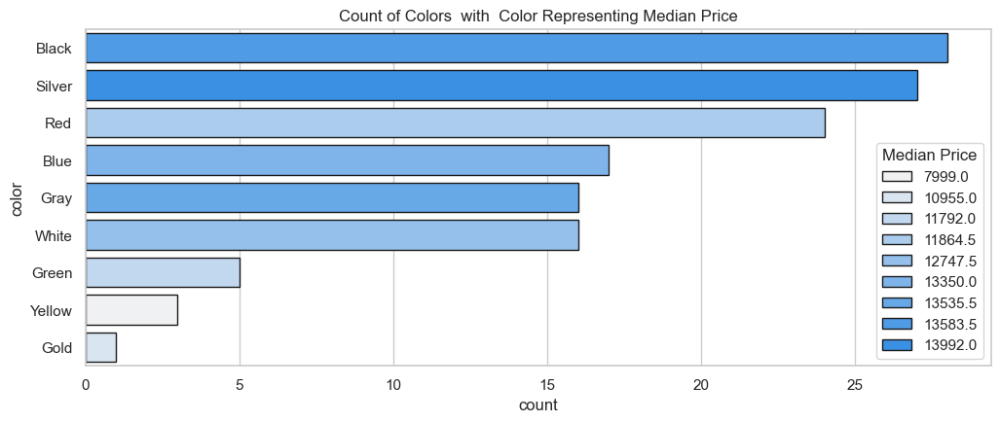

"color" has 9 SubCats:  ['Silver', 'Black', 'Gray', 'Blue', 'White', 'Red', 'Green', 'Gold', 'Yellow']


In [60]:
def CS_Count_Median( df_raw, cat, sclr, figsize_x, color ):
    
    # df groupped
    df = df_raw[ [cat,sclr] ].copy().dropna()
    grouped = df.groupby(cat).agg(count=(sclr,'count'), median=(sclr,'median')).reset_index()
    grouped = grouped.sort_values(['count'],ascending=False)
    
    # figsize
    figsize_y = min( 35, grouped.shape[0]*.50 )
    figsize   = ( figsize_x, figsize_y )
    
    # palette
    palette = sns.light_palette( color, n_colors=grouped.shape[0] )
    
    # plot
    plt.figure(figsize=figsize)
    bars = sns.barplot( data=grouped, y=cat, x='count', hue='median', dodge=False
                      , palette=palette, orient='h', edgecolor='k' )
    
    Title = 'Count of '+cat.title()+'s  with  Color Representing Median '+sclr.title()
    plt.title( Title )
    plt.legend( title='Median '+sclr.title(), loc='best' )
    
    # Saving
    bars.get_figure().savefig( 'CS_Count_Med_'+cat+'_'+sclr+'.png',bbox_inches='tight',dpi=360)
    plt.show()
    
    return [ df, grouped ]

df, g = CS_Count_Median( df_raw, cat, sclr, 12, 'dodgerblue' ) 
g = g.sort_values(['median'],ascending=False)

SubCats = g[cat].tolist(); print( '"'+cat + '" has '+str(len(SubCats))+' SubCats: ', SubCats )

In [61]:
# auto
Sclrs   = []
for subcat in SubCats:
    sclr_list = list(df.loc[ df[cat]==subcat, sclr ])
    Sclrs.append( sclr_list )

In [62]:
# input
SC = []
i  = 1
if len(SubCats)>=i:  sc00=Sclrs[i-1];  SC.append(sc00);  i=i+1
if len(SubCats)>=i:  sc01=Sclrs[i-1];  SC.append(sc01);  i=i+1
if len(SubCats)>=i:  sc02=Sclrs[i-1];  SC.append(sc02);  i=i+1
if len(SubCats)>=i:  sc03=Sclrs[i-1];  SC.append(sc03);  i=i+1
if len(SubCats)>=i:  sc04=Sclrs[i-1];  SC.append(sc04);  i=i+1
if len(SubCats)>=i:  sc05=Sclrs[i-1];  SC.append(sc05);  i=i+1
if len(SubCats)>=i:  sc06=Sclrs[i-1];  SC.append(sc06);  i=i+1
if len(SubCats)>=i:  sc07=Sclrs[i-1];  SC.append(sc07);  i=i+1
if len(SubCats)>=i:  sc08=Sclrs[i-1];  SC.append(sc08);  i=i+1
if len(SubCats)>=i:  sc09=Sclrs[i-1];  SC.append(sc09);  i=i+1
    
if len(SubCats)>=i:  print('Make more sc')
else              :  print('Done!')

Done!


#####   


Kruskal - Wallis H Test:
stat=9.210, p=0.325
Probably  all sub_colors have similar (dependent) distribution over price.


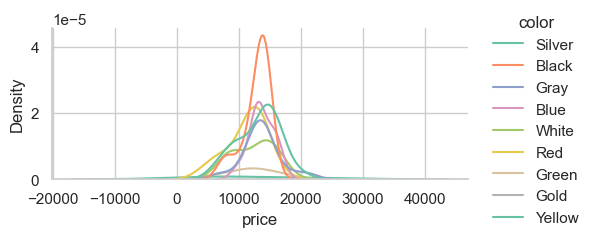

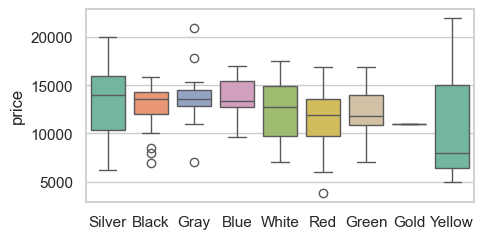


Dunn's Test:
"color" Dependet SubCats:
  ['Silver', 'Silver']
  ['Black', 'Silver']
  ['Gray', 'Silver']
  ['Blue', 'Silver']
  ['Silver', 'White']
  ['Red', 'Silver']
  ['Green', 'Silver']
  ['Gold', 'Silver']
  ['Silver', 'Yellow']
  ['Black', 'Black']
  ['Black', 'Gray']
  ['Black', 'Blue']
  ['Black', 'White']
  ['Black', 'Red']
  ['Black', 'Green']
  ['Black', 'Gold']
  ['Black', 'Yellow']
  ['Gray', 'Gray']
  ['Blue', 'Gray']
  ['Gray', 'White']
  ['Gray', 'Red']
  ['Gray', 'Green']
  ['Gold', 'Gray']
  ['Gray', 'Yellow']
  ['Blue', 'Blue']
  ['Blue', 'White']
  ['Blue', 'Red']
  ['Blue', 'Green']
  ['Blue', 'Gold']
  ['Blue', 'Yellow']
  ['White', 'White']
  ['Red', 'White']
  ['Green', 'White']
  ['Gold', 'White']
  ['White', 'Yellow']
  ['Red', 'Red']
  ['Green', 'Red']
  ['Gold', 'Red']
  ['Red', 'Yellow']
  ['Green', 'Green']
  ['Gold', 'Green']
  ['Green', 'Yellow']
  ['Gold', 'Gold']
  ['Gold', 'Yellow']
  ['Yellow', 'Yellow']
"color" Independet SubCats:


,Silver,Black,Gray,Blue,White,Red,Green,Gold,Yellow
Silver,D,D,D,D,D,D,D,D,D
Black,D,D,D,D,D,D,D,D,D
Gray,D,D,D,D,D,D,D,D,D
Blue,D,D,D,D,D,D,D,D,D
White,D,D,D,D,D,D,D,D,D
Red,D,D,D,D,D,D,D,D,D
Green,D,D,D,D,D,D,D,D,D
Gold,D,D,D,D,D,D,D,D,D
Yellow,D,D,D,D,D,D,D,D,D


In [63]:
##
## Non-Parametric Statistical Hypothesis Tests
##

# Kruskal-Wallis H Test:   Tests whether the distributions of two or more independent samples are equal or not.
# H0: The Means of all groups are equal
# H1: At least the Mean of one group is different from the others 
from scipy.stats import kruskal
print("\nKruskal - Wallis H Test:")

if   len(SubCats)==2:  stat, p = kruskal( sc00, sc01 )
elif len(SubCats)==3:  stat, p = kruskal( sc00, sc01, sc02 )
elif len(SubCats)==4:  stat, p = kruskal( sc00, sc01, sc02, sc03 )
elif len(SubCats)==5:  stat, p = kruskal( sc00, sc01, sc02, sc03, sc04 )
elif len(SubCats)==6:  stat, p = kruskal( sc00, sc01, sc02, sc03, sc04, sc05 )
elif len(SubCats)==7:  stat, p = kruskal( sc00, sc01, sc02, sc03, sc04, sc05, sc06 )
elif len(SubCats)==8:  stat, p = kruskal( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07 )
elif len(SubCats)==9:  stat, p = kruskal( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08 )
elif len(SubCats)==10: stat, p = kruskal( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08, sc09 )
else: print('Kruskal-Wallis Warning!  number of SubCats > 10 \nMake more sc')
    
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Probably  all sub_' +cat+'s have similar (dependent) distribution over '    +sclr+'.' )
else       : print('Probably  some sub_'+cat+'s have different (independent) distribution over '+sclr+'.' )
    

# displot 
sns_plot = sns.displot( data=df, x=sclr, hue=cat, kind="kde", height=2.5, aspect=5/2.5, palette=Palette, hue_order=SubCats )
sns_plot.savefig('bivar_'+cat+'_'+sclr+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()

# BoxPlot
plt.figure(figsize=(5,2.5))
sns_plot = sns.boxplot( x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette, order=SubCats )
plt.xlabel(''); #plt.axis('off'); #plt.title(sclr)
fig = sns_plot.get_figure(); fig.savefig('bivar_'+cat+'_'+sclr+'_BoxPlot_.png',bbox_inches='tight',dpi=120);   plt.show()
   

# Dunn's Test  (Rank-Based)
print("\nDunn's Test:")
if len(SubCats)>10: print("\nWarning!  number of SubCats > 10 \nMake more sc")

DunnTest = sp.posthoc_dunn( SC, p_adjust='holm' )
DunnTest.columns = SubCats
DunnTest.index   = SubCats
DunnTest = ( DunnTest < 0.05 ).replace(True,'').replace(False,'D') 

Independent_SubCats, Dependent_SubCats = [], []
for s1 in SubCats:
    for s2 in SubCats:
        if DunnTest.loc[s1,s2] == 'Indep':
            LIST = [s1,s2]
            LIST.sort()
            if (LIST not in Independent_SubCats):
                Independent_SubCats.append(LIST)
        else:
            LIST = [s1,s2]
            LIST.sort()
            if (LIST not in Dependent_SubCats):# and (s1!=s2):
                Dependent_SubCats.append(LIST)
                
print( '"'+cat+'" Dependet SubCats:')
if len(Dependent_SubCats)>1:   
    for sc_pair in Dependent_SubCats:   print(' ',sc_pair) 
        
print( '"'+cat+'" Independet SubCats:')
if len(Independent_SubCats)>1: 
    for sc_pair in Independent_SubCats: print(' ',sc_pair) 
DunnTest

In [64]:
# correctiong subcats
if cat in nom_cats:
    subcat_order = SubCats
    df_raw[cat]  = pd.Categorical( df_raw[cat], categories=subcat_order, ordered=True )
    df_raw       = df_raw.sort_values([ cat ])
    df_raw.head()

#####   

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.5em; color:#00b3e5;"> ordinal cats & nominal cats

In [50]:
ord_cats = df_raw.select_dtypes(include=['category']).columns.tolist()
nom_cats = df_raw.select_dtypes(include=[ 'object' ]).columns.tolist()

#####     

#####     

Analysis of Variance Test (ANOVA)
stat=1.204, p=0.302
Probably  all the same distributions   (dependent)


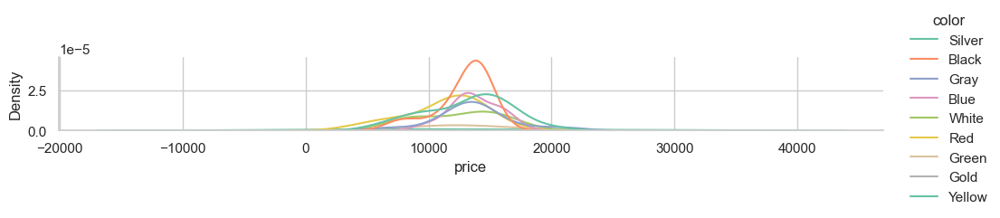

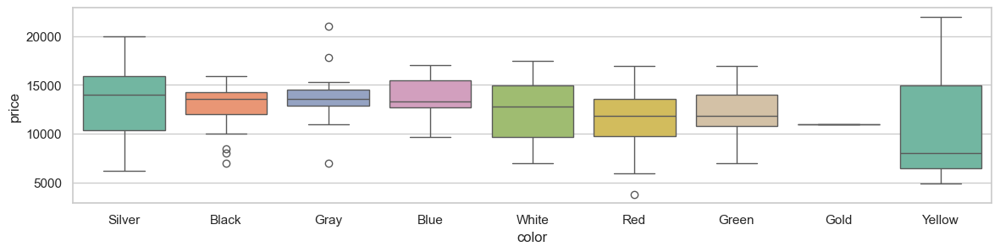


Groups Used in Tukey's HSD
[0, 'Silver']
[1, 'Black']
[2, 'Gray']
[3, 'Blue']
[4, 'White']
[5, 'Red']
[6, 'Green']
[7, 'Gold']
[8, 'Yellow']

Tukey_HSD Warning!
Test was not performed!
'Gold' has only 1 sample!


In [37]:
##
## Parametric Statistical Hypothesis Tests
##

# Analysis of Variance Test (ANOVA): Tests whether the means of two or more independent samples are significantly different
# H0: The Means of all groups are equal
# H1: At least the Mean of one group is different from the others
from scipy.stats import f_oneway
print("Analysis of Variance Test (ANOVA)")

if   len(SubCats)==2:  stat, p = f_oneway( sc00, sc01 )
elif len(SubCats)==3:  stat, p = f_oneway( sc00, sc01, sc02 )
elif len(SubCats)==4:  stat, p = f_oneway( sc00, sc01, sc02, sc03 )
elif len(SubCats)==5:  stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04 )
elif len(SubCats)==6:  stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04, sc05 )
elif len(SubCats)==7:  stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04, sc05, sc06 )
elif len(SubCats)==8:  stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07 )
elif len(SubCats)==9:  stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08 )
elif len(SubCats)==10: stat, p = f_oneway( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08, sc09 )
else: print('ANOVA Warning!  number of SubCats > 10 \nMake more sc')
    
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05: print('Probably  all the same distributions   (dependent)' )
else       : print('Probably  at least one different distribution  (independent)') 

# PairPlot
# displot (1)
sns_plot = sns.displot( data=df, x=sclr, hue=cat, kind="kde", height=1.8, aspect=10/1.8, palette=Palette, hue_order=SubCats ); plt.show()

# BoxPlot
plt.figure(figsize=(14,3))
sns_plot = sns.boxplot( x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette, order=SubCats ); plt.show()

# Tukey_HSD
from scipy.stats import tukey_hsd
print("\nGroups Used in Tukey's HSD")
i=0
for SubCat in SubCats:
    print([i,SubCat])
    i = i+1
print('')

try:
    if   len(SubCats)==2:  print( tukey_hsd( sc00, sc01 ) )
    elif len(SubCats)==3:  print( tukey_hsd( sc00, sc01, sc02 ) )
    elif len(SubCats)==4:  print( tukey_hsd( sc00, sc01, sc02, sc03 ) )
    elif len(SubCats)==5:  print( tukey_hsd( sc00, sc01, sc02, sc03, sc04 ) )
    elif len(SubCats)==6:  print( tukey_hsd( sc00, sc01, sc02, sc03, sc04, sc05 ) )
    elif len(SubCats)==7:  print( tukey_hsd( sc00, sc01, sc02, sc03, sc04, sc05, sc06 ) )
    elif len(SubCats)==8:  print( tukey_hsd( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07 ) )
    elif len(SubCats)==9:  print( tukey_hsd( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08 ) )
    elif len(SubCats)==10: print( tukey_hsd( sc00, sc01, sc02, sc03, sc04, sc05, sc06, sc07, sc08, sc09 ) )
    else: print('Tukey_HSD Warning!  number of SubCats > 10 \nMake more sc')
except:
    print('Tukey_HSD Warning!')
    print('Test was not performed!')
    #Probably one of subcats has only one sample!
    #Checking size of subcats 
    for i in range(len(SubCats)):
        sc   = SubCats[i]
        n_sc = len(SC[i])
        if n_sc==1:  
            print( "'" + sc + "' has only 1 sample!" )

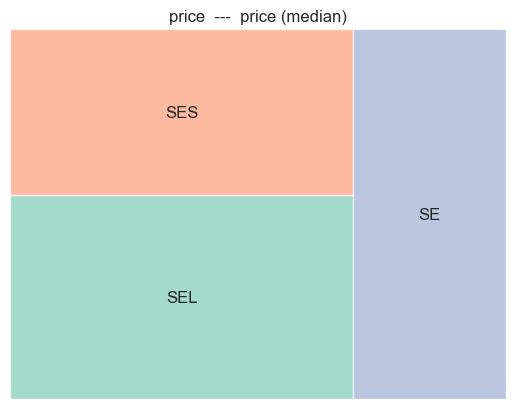

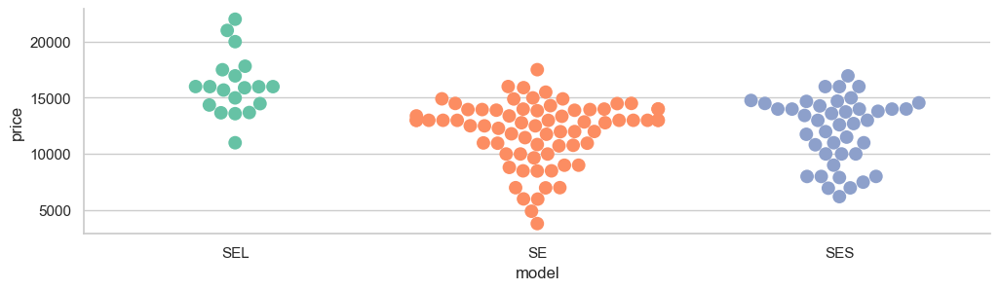

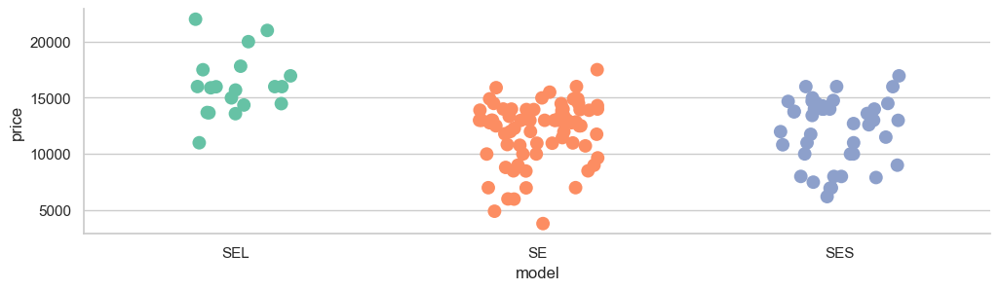

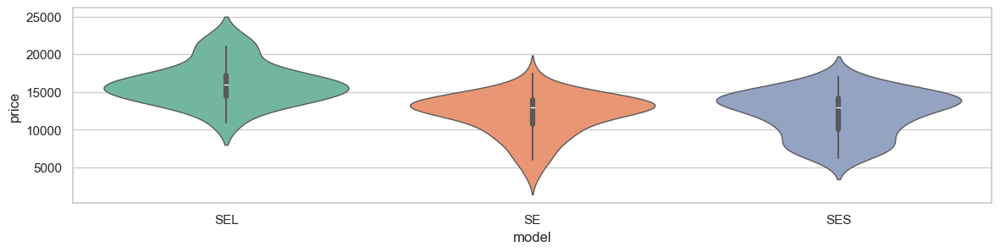

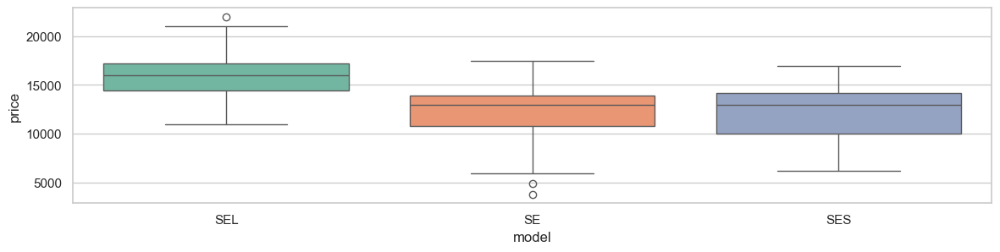

...

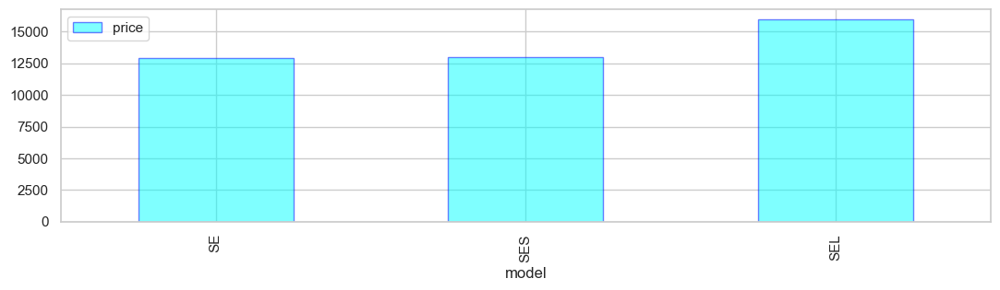

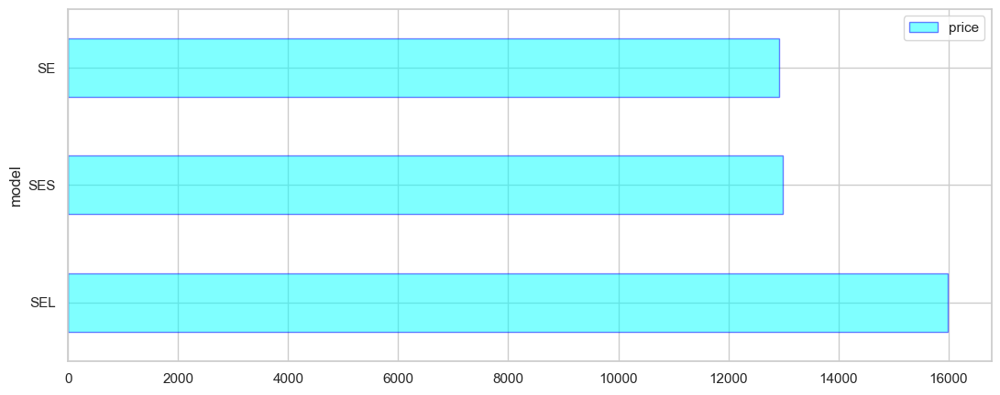

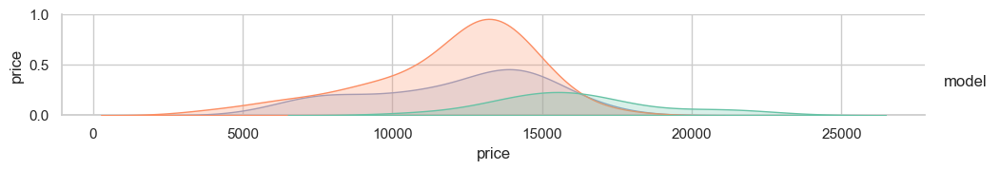

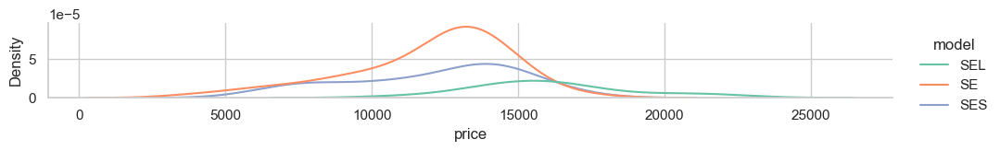

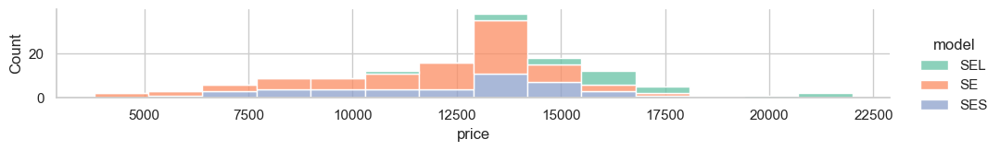

In [21]:
# (input)
cat  = 'model'
sclr = estimated_column   # estimated_column 


# (auto)
# Sampling
np.random.seed( 3 ) 
df       = df_raw.copy().dropna()
df.index = range( len(df) )
n_Max    = df.shape[0]
df       = df.sample( n=n_Max )
df.index = range( len(df) )
df.sort_values([cat],inplace=True)

#cat = list( df[cat].copy().astype('str') )
#sc  = list( df[sclr].copy()               )

 

# TreeMap (median)
import squarify   #pip install squarify
df_grouped = df.groupby(cat)[sclr].median()
df_grouped = pd.DataFrame(df_grouped)
df_grouped.sort_values([sclr],ascending=False,inplace=True)
label      = df_grouped.index
sizes      = list( df_grouped[sclr] )
colors     = Palette 
squarify.plot(sizes=sizes, label=label, alpha=0.6,color=Palette).set(title=estimated_column+'  ---  '+sclr+' (median)')
plt.axis('off'); plt.show()


# swarmplot
plt.figure(figsize=(12,3))
sns_plot = sns.swarmplot( data=df, x=cat, y=sclr, hue=cat, palette=Palette, s=10 )
sns.despine(); plt.show()

# stripplot
plt.figure(figsize=(12,3))
sns_plot = sns.stripplot( data=df, x=cat, y=sclr, hue=cat, palette=Palette, s=10, jitter=0.2, legend=False )
sns.despine(); plt.show()


# ViolinPlot
plt.figure(figsize=(14,3))
sns_plot = sns.violinplot( x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette ); plt.show()
# BoxPlot
plt.figure(figsize=(14,3))
sns_plot = sns.boxplot(    x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette ); plt.show()


# BarPlot
plt.figure(figsize=(14,3))
sns_plot = sns.barplot(    x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette ); plt.show()



## guide: .median() .mean() .sum()

# BarPlot Top 20 (Vertical)
df.groupby(by=[cat])[sclr].median().reset_index().sort_values([sclr],ascending=False).head(20).\
plot( x=cat, y=sclr, kind='bar',  figsize=(13,3), color='cyan', edgecolor='blue', alpha=0.5 ); plt.show()
# BarPlot Top 20 (Horizontal)
df.groupby(by=[cat])[sclr].median().reset_index().sort_values([sclr],ascending=True).tail(20).\
plot( x=cat, y=sclr, kind='barh', figsize=(13,5), color='cyan', edgecolor='blue', alpha=0.5 ); plt.show()

# BarPlot Bottom 20 (Vertical)
df.groupby(by=[cat])[sclr].median().reset_index().sort_values([sclr],ascending=True).head(20).\
plot( x=cat, y=sclr, kind='bar',  figsize=(13,3), color='cyan', edgecolor='blue', alpha=0.5 ); plt.show()
# BarPlot Bottom 20 (Horizontal)
df.groupby(by=[cat])[sclr].median().reset_index().sort_values([sclr],ascending=False).tail(20).\
plot( x=cat, y=sclr, kind='barh', figsize=(13,5), color='cyan', edgecolor='blue', alpha=0.5 ); plt.show()

# PairPlot 
sns_plot = sns.pairplot( data=df.loc[:,[cat,sclr]], hue=cat, diag_kind='kde', height=1.8, aspect=10/1.8, palette=Palette ) 
plt.show()

# displot (1)
sns_plot = sns.displot(data=df, x=sclr, hue=cat,     kind="kde"  , height=1.8, aspect=10/1.8, palette=Palette ); plt.show()
# displot (2)
sns_plot = sns.displot(data=df, x=sclr, hue=cat, multiple="stack", height=1.8, aspect=10/1.8, palette=Palette ); plt.show()



#####   

In [245]:
# Tableau          cat           sclr           sclr
# TreeMap  of  cat(SubCats) + cat(count) + estimated_column  

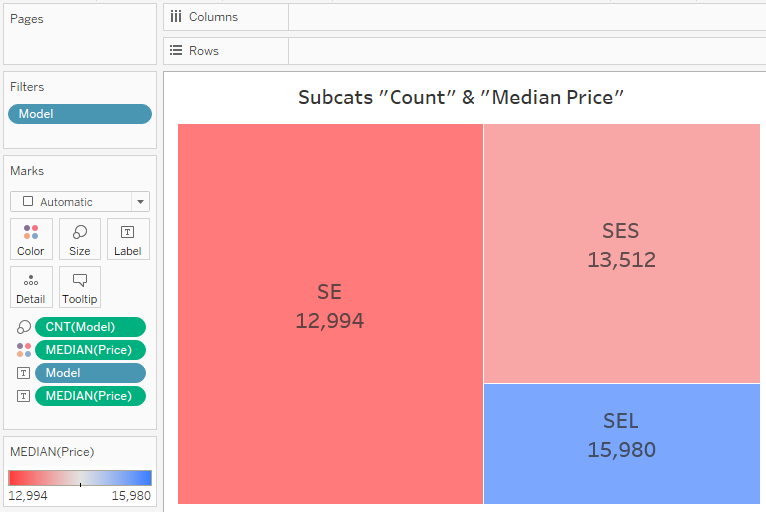

#####   

In [98]:
# help
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 cats:   ['model', 'color', 'transmission']

 There are 3 sclrs:  ['price', 'year', 'mileage'] 



#####   

#####   

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr - sclr

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [99]:
# help sclrs
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 sclrs:  ['price', 'year', 'mileage'] 



In [131]:
np.log10(10)

1.0

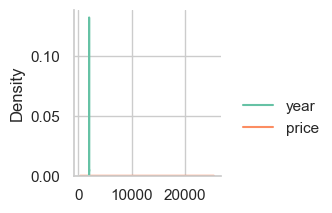

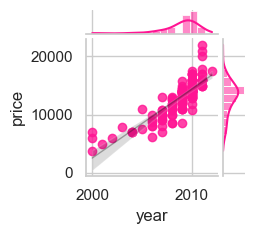




Non-Paired Samples Tests:

Mann-Whitney U Test:  (Non-Parametric, Median-Based Test)
stat=0.000, p=0.000, Independent Samples

Spearman's Rank Correlation Test:  (Non-Parametric, strength of linear relationship)
stat=0.858, p=0.000, Correlated


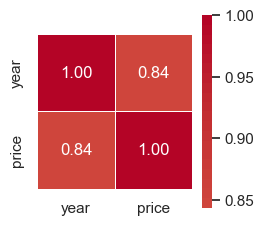

In [134]:
# (input)
sclr1 = 'year'         # x
sclr2 = estimated_column  # y


# Sampling
np.random.seed(3); 
df = df_raw[[sclr1,sclr2]].copy().dropna()
df = df.sample(n=min(3000,df.shape[0]))

sc1 = list( df[sclr1].copy() )
sc2 = list( df[sclr2].copy() )


# displot (1)
sc_A, sc_B = [], []
for i in range(len(sc1)): sc_A.append(sclr1)
for i in range(len(sc2)): sc_B.append(sclr2)
df_sc = pd.DataFrame([ sc1+sc2, sc_A+sc_B ]).T
df_sc.columns = ['SC',' ']
sns_plot = sns.displot(data=df_sc, x='SC', hue=' ', kind="kde", height=2.5, aspect=1, palette=Palette, legend=True)
plt.xlabel('');  #plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()
 
# Joint-Plot (1)
sns_plot = sns.jointplot( x=sclr1, y=sclr2, data=df, color='deeppink', kind='reg', height=2.5 
                        , dropna=True, line_kws={"color":"k","alpha":0.35,"lw":1} )
#plt.xlabel(''); plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_JointPlot1_.png',bbox_inches='tight',dpi=120);   plt.show()


##
## Non-Paired Samples Tests
##
print("\n\n\nNon-Paired Samples Tests:")

# Mann-Whitney U Test:   Tests whether the distributions of two independent samples are equal or not.
print("\nMann-Whitney U Test:  (Non-Parametric, Median-Based Test)")
from scipy.stats import mannwhitneyu  
stat, p = mannwhitneyu( sc1, sc2 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 
    
# Spearman's Rank Correlation Test
print("\nSpearman's Rank Correlation Test:  (Non-Parametric, strength of linear relationship)")
from scipy.stats import spearmanr
stat, p = spearmanr( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated')
    

# Correlation-Matrix
f,ax = plt.subplots(figsize=(2.5,2.5))
corr = df[ [sclr1,sclr2] ].corr('pearson')
sns_plot = sns.heatmap( corr,  mask=np.zeros_like(corr,dtype=bool),  cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr1+'_heatmap.png',bbox_inches='tight',dpi=360); plt.show()

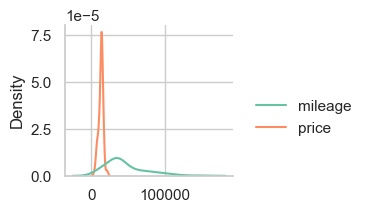

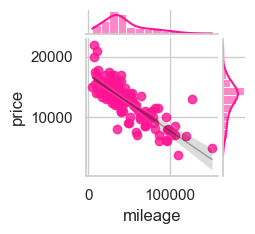

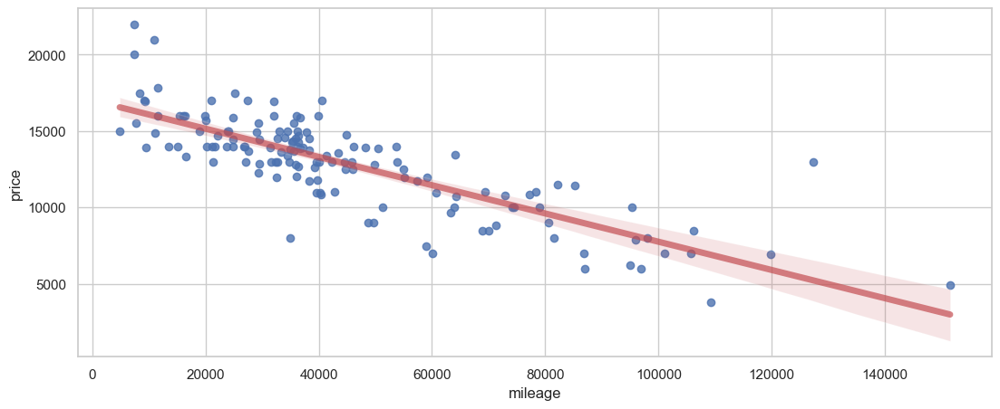

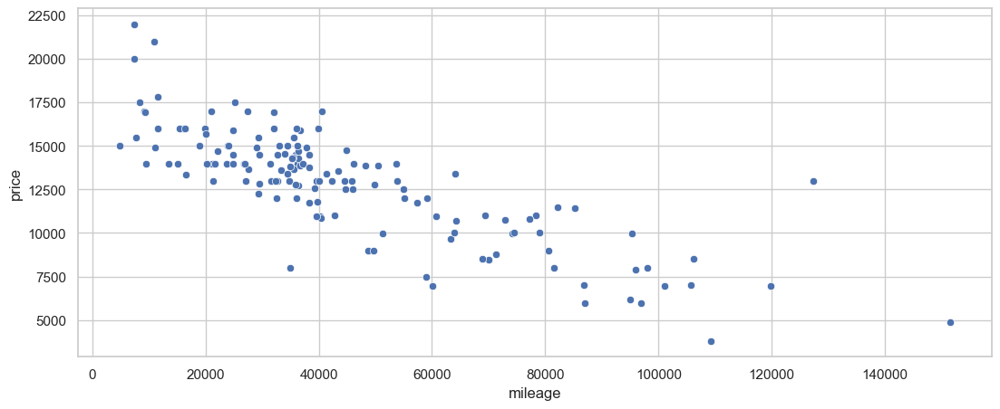

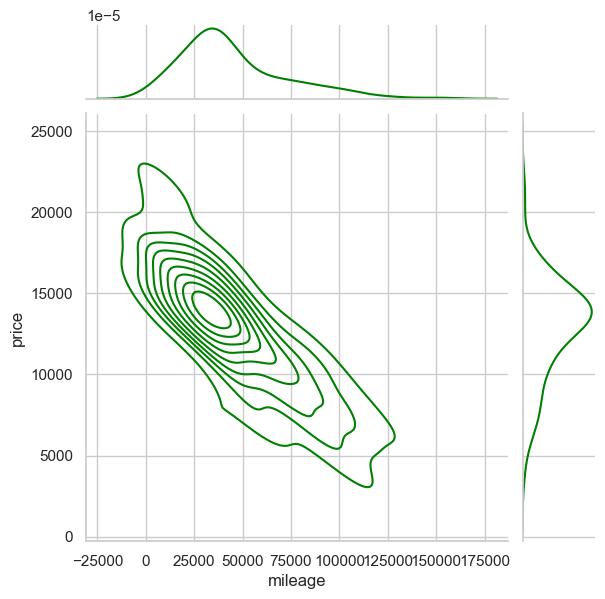

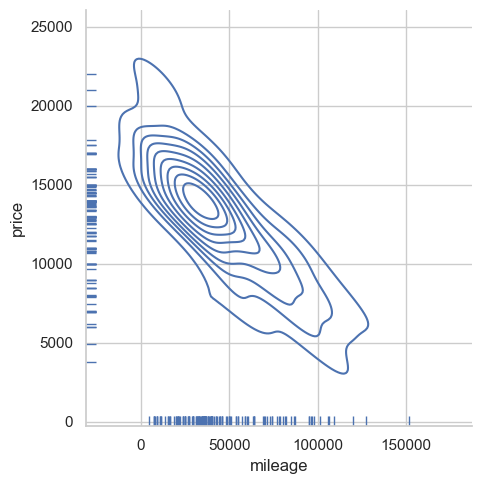

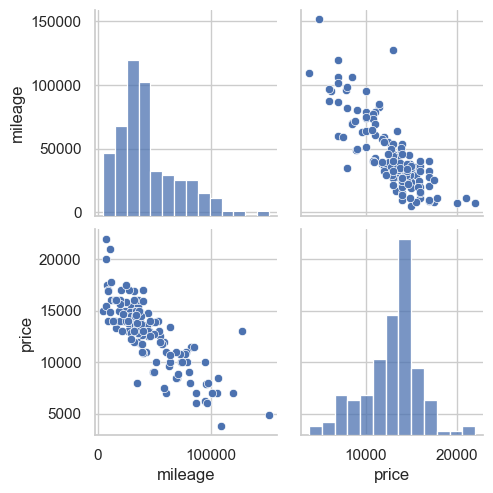

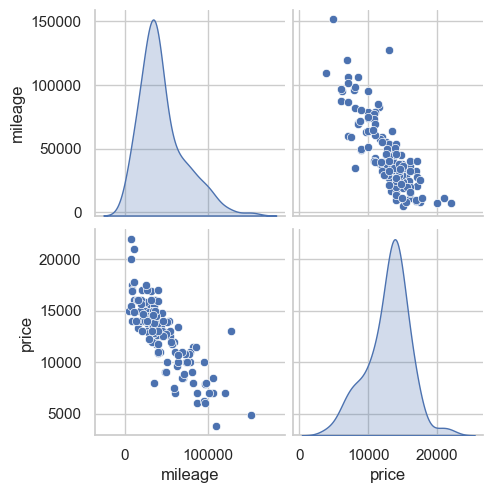

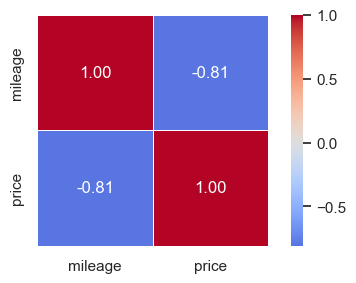




Non-Paired Samples Tests:

Mann-Whitney U Test:  (Non-Parametric, Median-Based Test)
stat=19657.000, p=0.000, Independent Samples

Spearman's Rank Correlation Test:  (Non-Parametric, strength of linear relationship)
stat=-0.799, p=0.000, Correlated


Student’s t-test:  (Parametric, Mean-Based Test)
stat=13.988, p=0.000, Independent Samples

Pearson's Correlation Test:  (Parametric, strength of linear relationship)
stat=-0.809, p=0.000, Correlated




Paired-Samples Tests:

Wilcoxon Signed-Rank Test:  (Non-Parametric, Median-Based Test)
stat=273.000, p=0.000, Dependent Samples

Paired Student’s t-test:  (Parametric, Mean-Based Test)
stat=12.863, p=0.000, Dependent Samples




Ordinal-Samples Tests:

Kendall's Rank Correlation Test:
stat=-0.609, p=0.000, Correlated


In [124]:
# (input)
sclr1 = 'mileage'         # x
sclr2 = estimated_column  # y


# Sampling
np.random.seed(3); 
df = df_raw[[sclr1,sclr2]].copy().dropna()
df = df.sample(n=min(3000,df.shape[0]))

sc1 = list( df[sclr1].copy() )
sc2 = list( df[sclr2].copy() )


# displot (1)
sc_A, sc_B = [], []
for i in range(len(sc1)): sc_A.append(sclr1)
for i in range(len(sc2)): sc_B.append(sclr2)
df_sc = pd.DataFrame([ sc1+sc2, sc_A+sc_B ]).T
df_sc.columns = ['SC',' ']
sns_plot = sns.displot(data=df_sc, x='SC', hue=' ', kind="kde", height=2.5, aspect=1, palette=Palette, legend=True)
plt.xlabel('');  #plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()
 
# Joint-Plot (1)
sns_plot = sns.jointplot( x=sclr1, y=sclr2, data=df, color='deeppink', kind='reg', height=2.5 
                        , dropna=True, line_kws={"color":"k","alpha":0.35,"lw":1} )
#plt.xlabel(''); plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_JointPlot1_.png',bbox_inches='tight',dpi=120);   plt.show()



# Reg-Plot
sns.set(rc={'figure.figsize':(13,5)}); sns.set(style='whitegrid')
sns_plot = sns.regplot( x=sclr1, y=sclr2, data=df, scatter_kws={"color":'dodgerblue'} 
                      , line_kws={"color":"deeppink","alpha":0.7,"lw":3} )
fig = sns_plot.get_figure(); fig.savefig('regplot.png',bbox_inches='tight',dpi=360); plt.show()


# Scatter-Plot 
sns.set(rc={'figure.figsize':(13,5)}); sns.set(style='whitegrid')
sns_plot = sns.scatterplot( data=df, x=sclr1, y=sclr2, markers=True, palette=Palette ) # ,size=sclr2
fig = sns_plot.get_figure(); fig.savefig('scatterplot.png',bbox_inches='tight',dpi=360); plt.show()

# Joint-Plot (2)
sns_plot = sns.jointplot( x=sclr1, y=sclr2, data=df, color='green', kind='kde', dropna=True, palette=Palette )
sns_plot.savefig('jointplot.png',bbox_inches='tight',dpi=360); plt.show()


# displot
sns.displot( data=df, x=sclr1, y=sclr2, kind='kde', rug=True, palette=Palette ); plt.show()
 

# PairPlot
sns.pairplot( data=df, vars=[sclr1,sclr2]                 , palette=Palette ); plt.show()
sns.pairplot( data=df, vars=[sclr1,sclr2], diag_kind='kde', palette=Palette ); plt.show()


# Correlation-Matrix
f,ax = plt.subplots(figsize=(6,3))
corr = df[ [sclr1,sclr2] ].corr('pearson')
sns_plot = sns.heatmap( corr,  mask=np.zeros_like(corr,dtype=bool),  cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
fig = sns_plot.get_figure(); fig.savefig('heatmap.png',bbox_inches='tight',dpi=360); plt.show()
 
    
    
    
    
##
## Non-Paired Samples Tests
##
print("\n\n\nNon-Paired Samples Tests:")

# Mann-Whitney U Test:   Tests whether the distributions of two independent samples are equal or not.
print("\nMann-Whitney U Test:  (Non-Parametric, Median-Based Test)")
from scipy.stats import mannwhitneyu  
stat, p = mannwhitneyu( sc1, sc2 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 
    
# Spearman's Rank Correlation Test
print("\nSpearman's Rank Correlation Test:  (Non-Parametric, strength of linear relationship)")
from scipy.stats import spearmanr
stat, p = spearmanr( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated') 

    
# Student’s t-test:   Tests whether the means of two independent samples are significantly different. 
print("\n\nStudent’s t-test:  (Parametric, Mean-Based Test)") 
from scipy.stats import ttest_ind
stat, p = ttest_ind( sc1, sc2, equal_var=False )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 
    
# Pearson's Correlation Test
print("\nPearson's Correlation Test:  (Parametric, strength of linear relationship)")
from scipy.stats import pearsonr
stat, p = pearsonr( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated') 


    
##
## Paired-Samples Tests
##
print("\n\n\n\nPaired-Samples Tests:")

# Wilcoxon Signed-Rank Test:   Tests whether the distributions of two paired samples are equal or not. 
print("\nWilcoxon Signed-Rank Test:  (Non-Parametric, Median-Based Test)")
from scipy.stats import wilcoxon 
stat, p = wilcoxon( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 

# Paired Student’s t-test:   Tests whether the means of two paired samples are significantly different.
print("\nPaired Student’s t-test:  (Parametric, Mean-Based Test)")
from scipy.stats import ttest_rel 
stat, p = ttest_rel( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')  


    
##
## Ordinal Samples Tests
##
print("\n\n\n\nOrdinal-Samples Tests:")    
  
# Kendall's Rank Correlation Test
print("\nKendall's Rank Correlation Test:")
from scipy.stats import kendalltau
stat, p = kendalltau( sc1, sc2 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated'  ) 


    
##
## Categorical Samples Tests
##
''' 
print("\n\n\n\nCategorical-Samples Tests:")

# Chi-Squared Test
from scipy.stats import chi2_contingency
print("\nChi-Squared Test:")
table = [ sc1, sc2 ]
stat, p, dof, expected = chi2_contingency(table)
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')
''' 
pass

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr ( Time ) - sclr

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [135]:
# help sclrs
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 sclrs:  ['price', 'year', 'mileage'] 



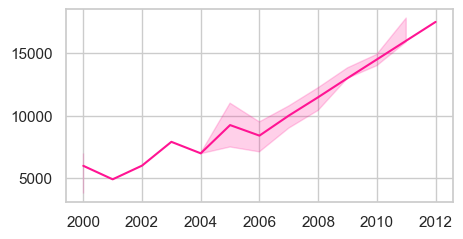

In [170]:
sclr_time = 'year'            # x
sclr2     = estimated_column  # y 

# lineplot (median)
plt.figure(figsize=(5,2.5)) 
sns_plot  = sns.lineplot( data=df_raw, x=sclr_time, y=sclr2, estimator='median', markers=True
                        , color='deeppink', palette=Palette )  # hue='cat1', style='cat2'
plt.xlabel(''); plt.ylabel('');  #plt.axis('off');  plt.xticks(rotation=30)
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr_time+'_lineplot.png'); plt.show()

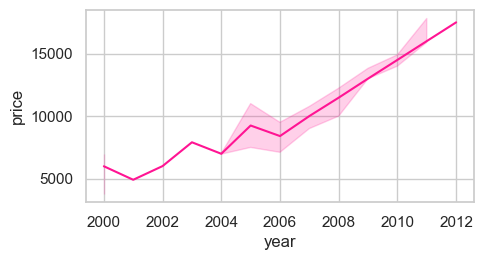

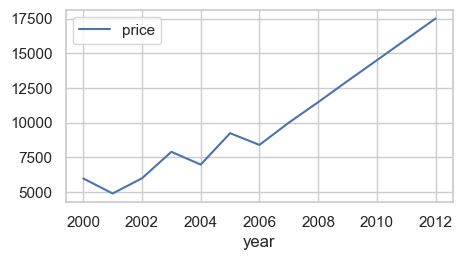

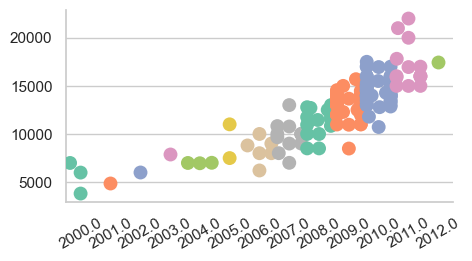

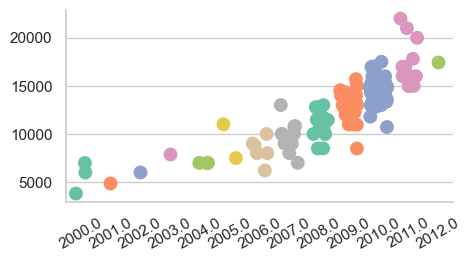

In [177]:
sclr_time = 'year'            # x
sclr2     = estimated_column  # y 

# lineplot (median)
plt.figure(figsize=(5,2.5)) 
sns_plot  = sns.lineplot( data=df_raw, x=sclr_time, y=sclr2, markers=True, color='deeppink', palette=Palette
                        , estimator='median' )  # hue='cat1', style='cat2'
#plt.xlabel(''); plt.ylabel('');  plt.axis('off');  plt.xticks(rotation=30)
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr_time+'_lineplot.png'); plt.show()

# Trend (median)
fig = df_raw[[sclr_time,sclr2]].groupby([sclr_time]).median().plot(figsize=(5,2.5))
#plt.xlabel(''); plt.ylabel('');  plt.axis('off');  plt.xticks(rotation=30)
fig.get_figure().savefig('bivar_'+sclr2+'_'+sclr_time+'_trend.png'); plt.show()

# swarmplot
plt.figure(figsize=(5,2.5))
sns_plot = sns.swarmplot( data=df_raw, x=sclr_time, y=sclr2, hue=sclr_time, palette=Palette, s=10, legend=False )
sns.despine(); plt.xticks(rotation=30)
plt.xlabel(''); plt.ylabel('');  #plt.axis('off')
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr_time+'_swarmplot.png'); plt.show()

# stripplot
plt.figure(figsize=(5,2.5))
sns_plot = sns.stripplot( data=df_raw, x=sclr_time, y=sclr2, hue=sclr_time, palette=Palette, s=10, legend=False, jitter=0.3 )
sns.despine(); plt.xticks(rotation=30)
plt.xlabel(''); plt.ylabel('');  #plt.axis('off')
fig = sns_plot.get_figure(); fig.savefig('bivar_'+sclr2+'_'+sclr_time+'_stripplot.png'); plt.show()

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> cat - cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [178]:
# help sclrs
print('\n There are ' + str(len(cats)) + ' cats:  ', cats, '\n')


 There are 3 cats:   ['model', 'color', 'transmission'] 



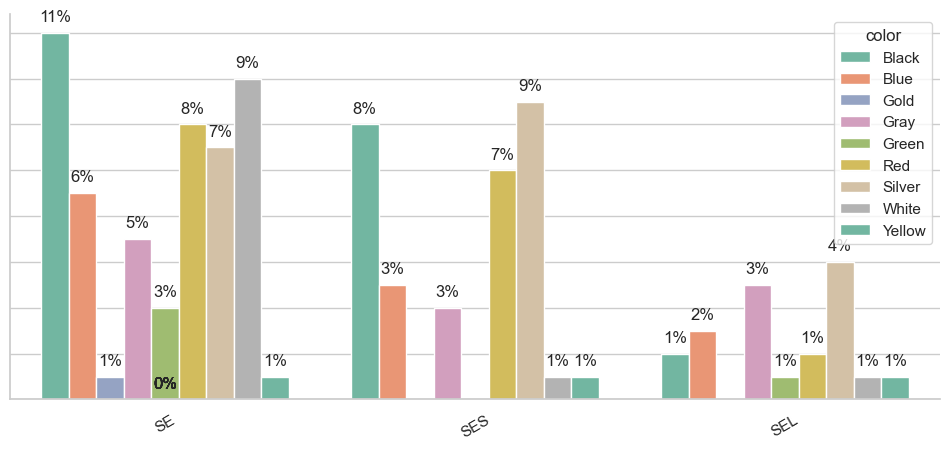

In [219]:
cat1 = 'model'            #  estimated_column
cat2 = 'color'            # 'Education', 'Marital_Status', 'Dt_Customer'

# countplot
plt.figure(figsize=(12,5)); sns.set(style='whitegrid')
sns_plot = sns.countplot( x=cat1, hue=cat2, data=df_raw.sort_values([cat2]), palette=Palette ) 
total = float( df_raw.shape[0] )
for p in sns_plot.patches:
    height=p.get_height()
    sns_plot.text(p.get_x()+p.get_width()/2.0,height+0.5,'{0:.0%}'.format(height/total),ha='center')
# sns parameters
sns.despine(); #plt.axis('off')
plt.xlabel(''); plt.ylabel('');
plt.xticks(rotation=30); plt.yticks(rotation=30); 
#sns_plot.set(xticklabels=[]); 
sns_plot.set(yticklabels=[])
# saving
fig = sns_plot.get_figure(); fig.savefig('trivar_'+cat1+'_'+cat2+'_countplot.png'); plt.show()

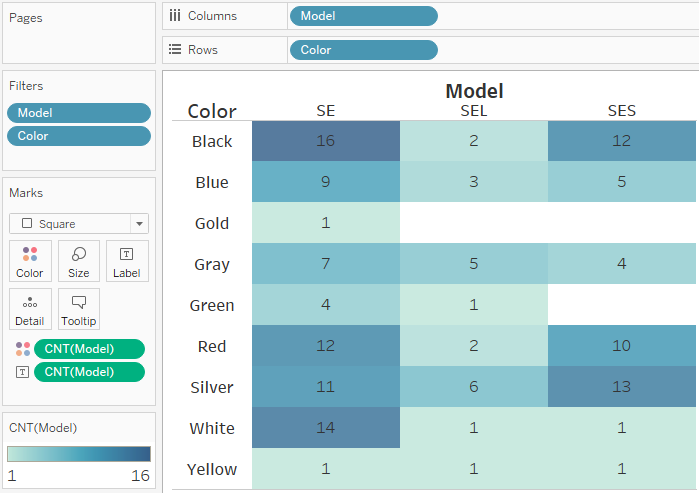

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">    

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">    

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> cat-cat (count plot)
    
 **+ Method (1): crosstab = pd.crosstab( df[cat1], df[cat2] )**
  - heatmap
  - bar plot
    
 **+ Method (2): df + crosstab**
  - mosaic plot

<span style="font-family:Arial; font-weight:Bold; font-size:1.5em; color:#00b3e5;"> Method 1

In [162]:
# help: how to make crosstab
''' 
cat2 = 'cat2'    # columns
cat1 = 'cat1'    # index
df   =  df_raw[[cat1,cat2]].copy()
crosstab         = pd.crosstab( df[cat1], df[cat2] )
crosstab.columns = crosstab.columns.tolist()
crosstab.index   = crosstab.index.tolist()
crosstab         = crosstab.sort_values( crosstab.index.tolist()  , ascending=False, axis=1 )
crosstab         = crosstab.sort_values( crosstab.columns.tolist(), ascending=False, axis=0 )
''' 

cat2 = ['Sun','Mon','Tue','Wed','Thu','Fri','Sat']  # columns
cat1 = ['Stew','Rice','Salad','Pepsi']              # index

Sun  = [  70  ,  100 ,  35   ,   75  ]
Mon  = [  20  ,   30 ,  15   ,   21  ]
Tue  = [  22  ,   35 ,  12   ,   18  ]
Wed  = [  18  ,   25 ,  14   ,   17  ]
Thu  = [  25  ,   40 ,  20   ,   23  ]
Fri  = [  30  ,   35 ,  15   ,   22  ]
Sat  = [  90  ,  120 ,  40   ,   90  ]

crosstab = pd.DataFrame( [Sun,Mon,Tue,Wed,Thu,Fri,Sat] ).T 
crosstab.columns = cat2
crosstab.index   = cat1
crosstab = crosstab.sort_values( CROSS_TAB.columns.to_list(), ascending=False, axis=0 )
crosstab

,Sun,Mon,Tue,Wed,Thu,Fri,Sat
Rice,100,30,35,25,40,35,120
Pepsi,75,21,18,17,23,22,90
Stew,70,20,22,18,25,30,90
Salad,35,15,12,14,20,15,40


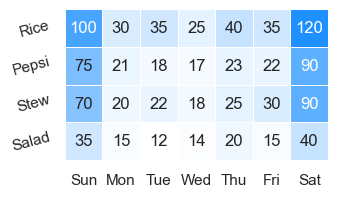

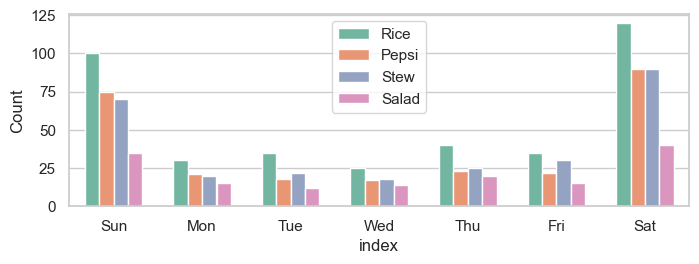

In [163]:
# heatmap (count plot)
_,ax = plt.subplots(figsize=( max(1.5,(1.5+crosstab.shape[1])/2.5), max(1.5,(1.5+crosstab.shape[0])/2.5) ))
sns_plot = sns.heatmap( crosstab,  mask=np.zeros_like(crosstab,dtype=bool),  cmap=W2B_Cmap, cbar=False,
                        center=None, square=True, ax=ax, annot=True, fmt='d', linewidth=.5 ) 
plt.xticks(rotation=0); plt.yticks(rotation=15) 
plt.show()

# bar plot (count plot)
dummy     = crosstab.T.copy().replace(0,0.1)
hue_order = dummy.columns.tolist()   # dummy.columns.sort_values().tolist()
df_long   = dummy.reset_index().melt( id_vars='index', var_name='', value_name='Count' )
plt.figure(figsize=(8,2.5))
sns_plot = sns.barplot( data=df_long, x='index', y='Count', hue='', hue_order=hue_order, palette='Set2', width=0.65 )

<span style="font-family:Arial; font-weight:Bold; font-size:1.5em; color:#00b3e5;"> Method 2

In [212]:
COL = [ 'Sat' , 'Sun' , 'Sun','Fri' , 'Fri' , 'Sat' ,'Sat','Fri','Fri','Sun' , 'Fri' ,'Sat' ,'Sat', 'Sun' ,'Sun','Sat' ]
IDX = ['Pepsi','Pepsi','Coca','Coca','Pepsi','Pepsi','7up','7up','7up','Coca','Pepsi','Coca','7up','Pepsi','7up','7up' ]
df  = pd.DataFrame()
df['col'] = COL
df['idx'] = IDX
df

,col,idx
0,Sat,Pepsi
1,Sun,Pepsi
2,Sun,Coca
3,Fri,Coca
4,Fri,Pepsi
5,Sat,Pepsi
6,Sat,7up
7,Fri,7up
8,Fri,7up
9,Sun,Coca


In [234]:
# input
cat1 = 'idx' 
cat2 = 'col'

# crosstab  (used in all plots)
crosstab         = pd.crosstab( df[cat1], df[cat2] )
crosstab.columns = crosstab.columns.tolist()
crosstab.index   = crosstab.index.tolist() 
crosstab = crosstab.T.sort_values( crosstab.T.columns.tolist(), ascending=False, axis=0 ); crosstab=crosstab.T
crosstab = crosstab.sort_values( crosstab.columns.tolist(), ascending=False, axis=0 )

hue_order = crosstab.index.tolist()
x_order   = crosstab.columns.tolist()

crosstab

,Sat,Fri,Sun
7up,3,2,1
Pepsi,2,2,2
Coca,1,1,2


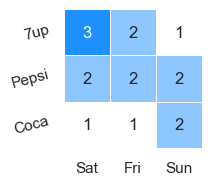

In [232]:
# heatmap (count plot)
_,ax = plt.subplots(figsize=( max(1.5,(1.5+crosstab.shape[1])/2.5), max(1.5,(1.5+crosstab.shape[0])/2.5) ))
sns_plot = sns.heatmap( crosstab,  mask=np.zeros_like(crosstab,dtype=bool),  cmap=W2B_Cmap, cbar=False,
                        center=None, square=True, ax=ax, annot=True, fmt='d', linewidth=.5 ) 
plt.xticks(rotation=0); plt.yticks(rotation=15) 
plt.show()

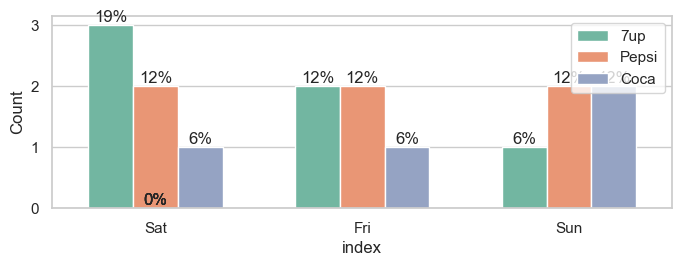

In [235]:
# bar plot (count plot)
df_long   = crosstab.T.replace(0,0.1).reset_index().melt( id_vars='index', var_name='', value_name='Count' )
plt.figure(figsize=(8,2.5))
sns_plot = sns.barplot( data=df_long, x='index', y='Count', hue='', hue_order=hue_order, palette='Set2', width=0.65 )

total = float( df.shape[0] )
for p in sns_plot.patches:
    height=p.get_height()
    sns_plot.text(p.get_x()+p.get_width()/2.0,height+0.05 ,'{0:.0%}'.format(height/total),ha='center')
    
plt.show()

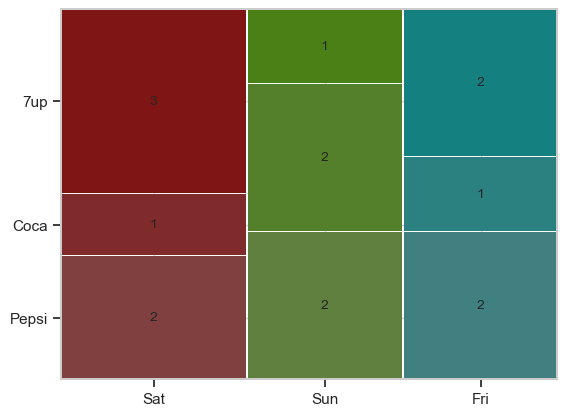

In [249]:
# mosaic plot  
def count_label(key):
    count = len(df[(df[cat1]==key[1]) & (df[cat2]==key[0])])
    return f'{count}' 
from statsmodels.graphics.mosaicplot import mosaic
mosaic( df, [cat2,cat1], labelizer=count_label ); plt.title(''); plt.show()

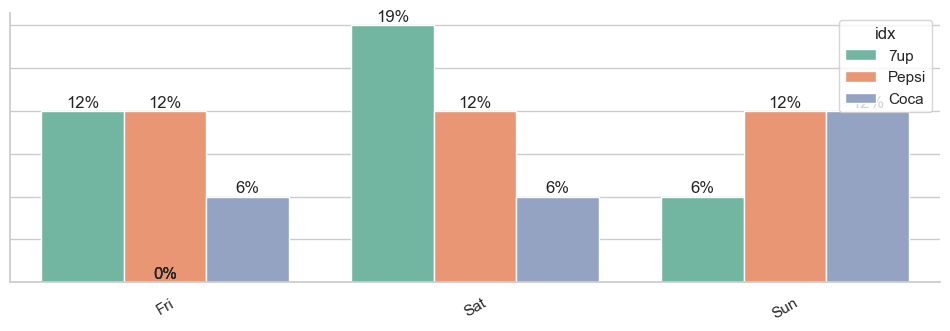

In [250]:
# countplot
plt.figure(figsize=(12,3.5)) 
sns_plot  = sns.countplot( x=cat2, hue=cat1, hue_order=hue_order, data=df.sort_values([cat2]), palette='Set2' ) 
total     = float( df.shape[0] )
for p in sns_plot.patches:
    height=p.get_height()
    sns_plot.text(p.get_x()+p.get_width()/2.0,height+0.05 ,'{0:.0%}'.format(height/total),ha='center')
# sns parameters
sns.despine(); plt.xlabel(''); plt.ylabel(''); plt.xticks(rotation=30); plt.yticks(rotation=30); 
sns_plot.set(yticklabels=[]); #sns_plot.set(xticklabels=[]); 
# saving
fig = sns_plot.get_figure(); fig.savefig('trivar_'+cat1+'_'+cat2+'_countplot.png'); plt.show()

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">    

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Trivariate Analysis

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> cat-cat - sclr

In [267]:
# help
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 cats:   ['model', 'color', 'transmission']

 There are 3 sclrs:  ['year', 'price', 'mileage'] 



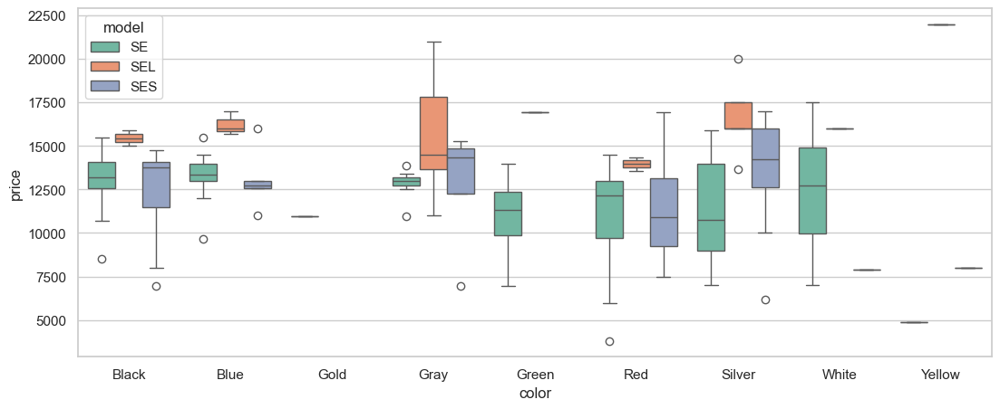

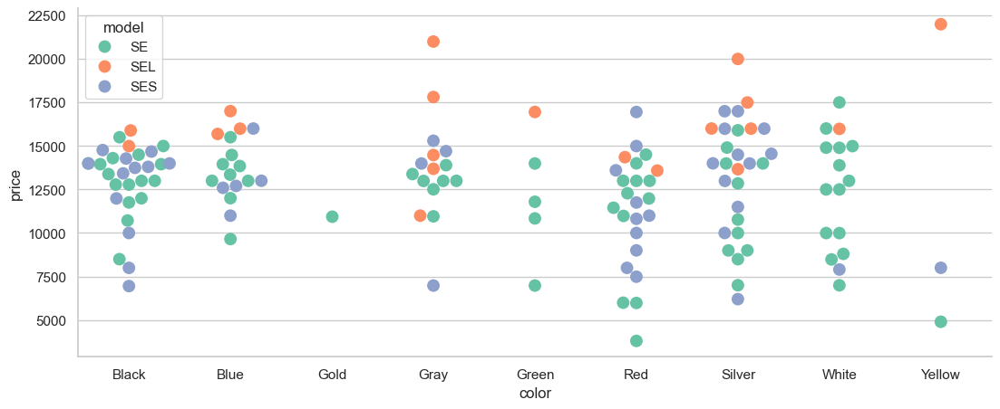

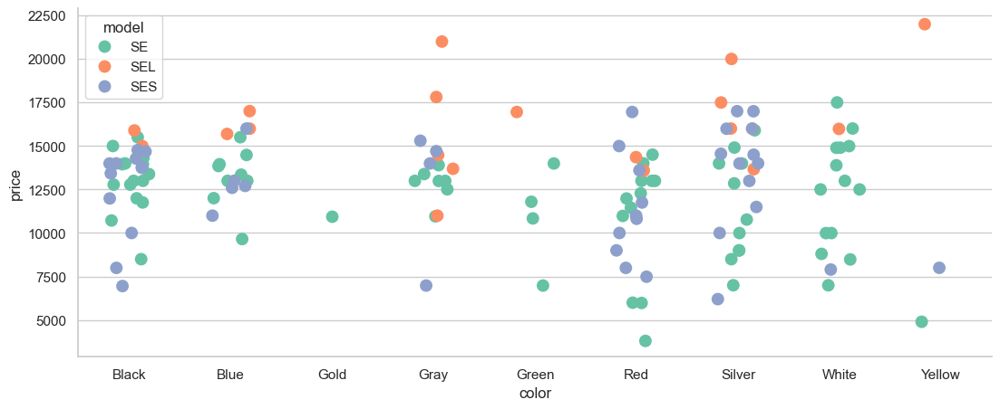

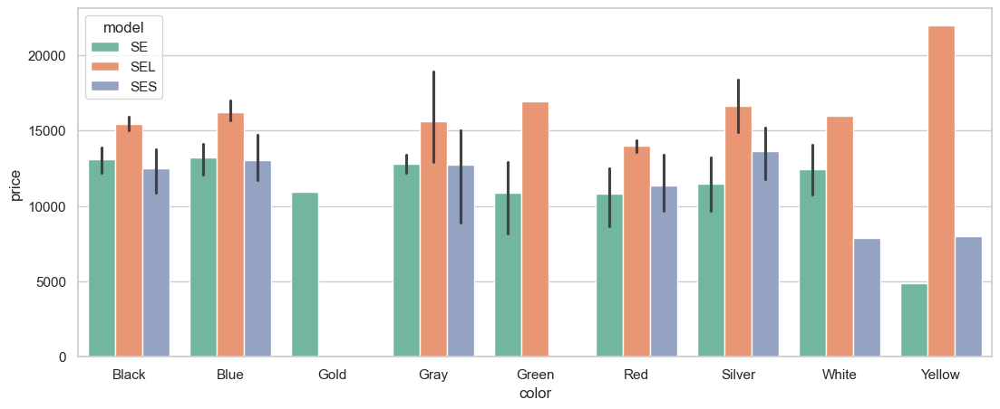

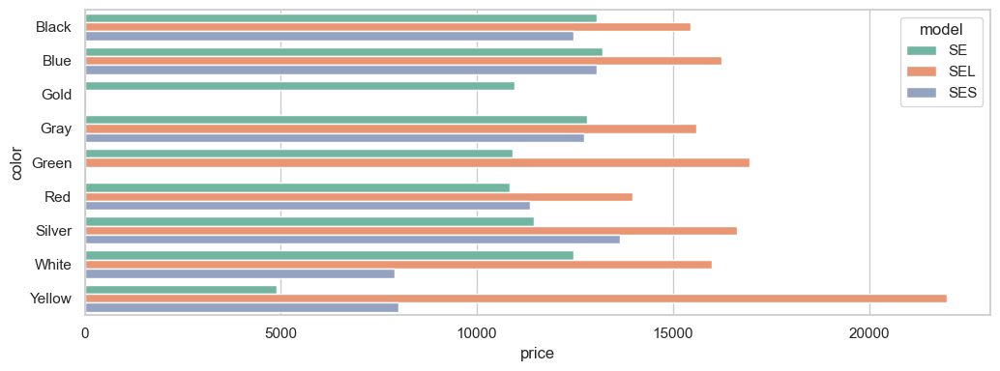

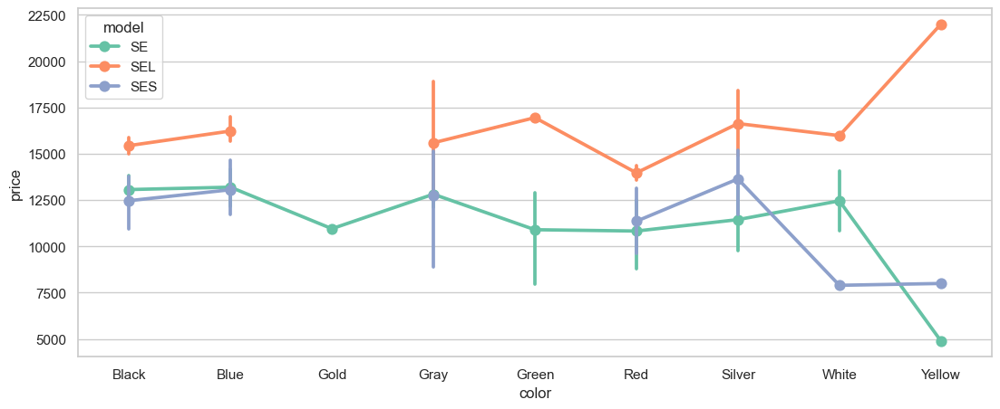

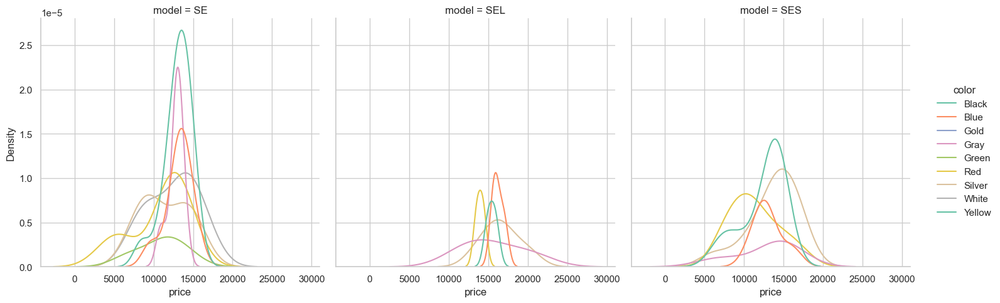

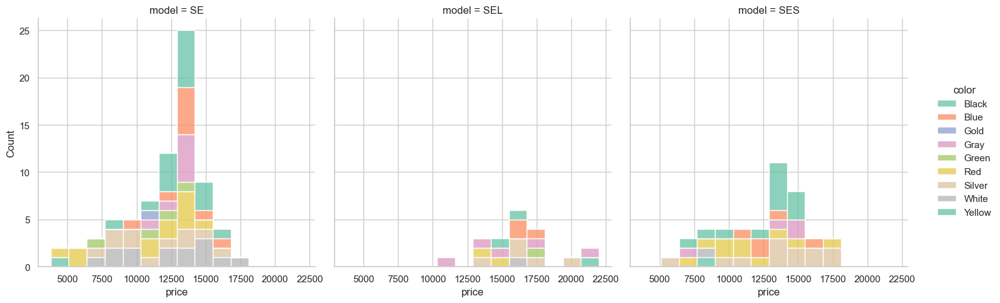

In [269]:
cat  = 'color'            #  estimated_column
hue  = 'model'            # 'Education', 'Marital_Status', 'Dt_Customer'

sclr = estimated_column   # 'Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntWines',
                          # 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
                          # 'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
                          # 'NumStorePurchases', 'NumWebVisitsMonth', 'Response', 'Complain'

df      = df_raw[ [hue,cat,sclr] ].copy().dropna().sort_values([hue,cat],ascending=[True,True])
df[cat] = df[cat].astype(str)
df[hue] = df[hue].astype(str)

# BoxPlot
sns.set(rc={'figure.figsize':(13,5)}); 
sns_plot = sns.boxplot( x=cat, y=sclr, data=df, linewidth=1.0, palette=Palette, hue=hue ) 
fig = sns_plot.get_figure(); fig.savefig('boxplot.png'); plt.show()

# swarmplot
plt.figure(figsize=(13,5))
sns_plot = sns.swarmplot( data=df, x=cat, y=sclr, hue=hue, palette=Palette, s=10, legend=True )
sns.despine(); plt.show()

# stripplot
plt.figure(figsize=(13,5))
sns_plot = sns.stripplot( data=df, x=cat, y=sclr, hue=hue, palette=Palette, s=10, legend=True, jitter=0.2 )
sns.despine(); plt.show()

# BarPlot  (Vertical) ( mean of sclr )
sns.set(rc={'figure.figsize':(13,5)}); sns.set(style='whitegrid')
sns_plot = sns.barplot( x=cat, y=sclr, data=df, hue=hue, palette=Palette )  
fig = sns_plot.get_figure(); fig.savefig('barplot.png'); plt.show()

# BarPlot (Horizontal)
Group    = df[sclr].groupby( [df[hue], df[cat]] ).mean().reset_index() #.sort_values( by=[y], ascending=[False] )
fig      = plt.figure( figsize=(10.5,4) )
sns_plot = sns.barplot( y=cat, x=sclr, hue=hue, data=Group, palette=Palette )
plt.tight_layout()
fig = sns_plot.get_figure(); fig.savefig('barplot_h.png'); plt.show()

# Point Plot
sns.set(rc={'figure.figsize':(13,5)}); sns.set(style='whitegrid')
sns_plot = sns.pointplot( x=cat, y=sclr, data=df, hue=hue, palette=Palette )  
fig = sns_plot.get_figure(); fig.savefig('pointplot.png'); plt.show()

# displot (1)
sns_plot = sns.displot(data=df, x=sclr, hue=cat, col=hue, palette=Palette,     kind="kde"  ); plt.show()
# displot (2)
sns_plot = sns.displot(data=df, x=sclr, hue=cat, col=hue, palette=Palette, multiple="stack"); plt.show()

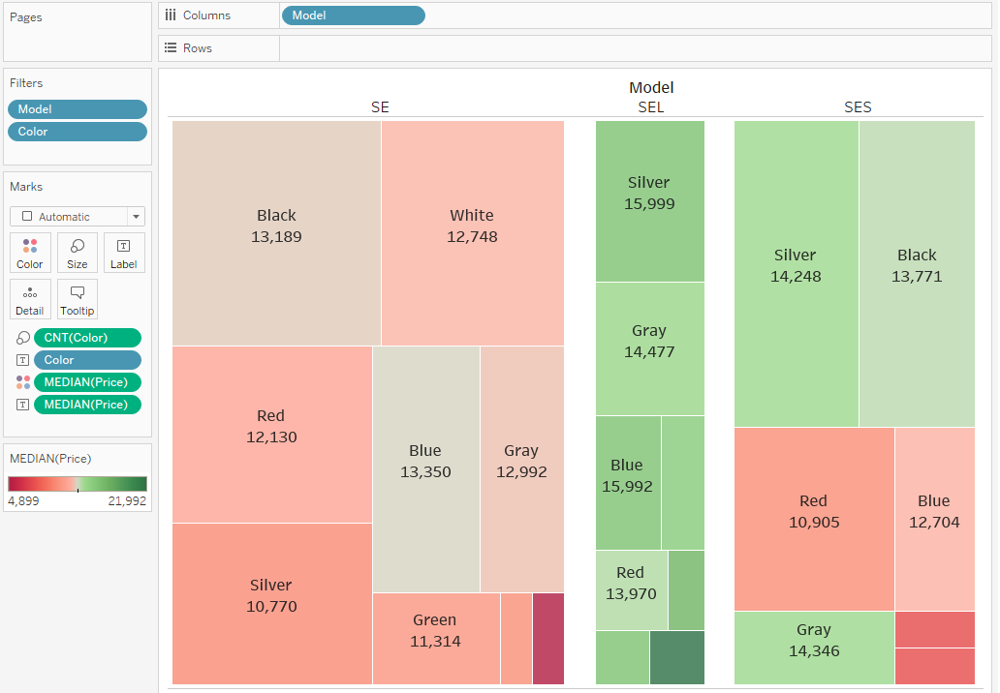

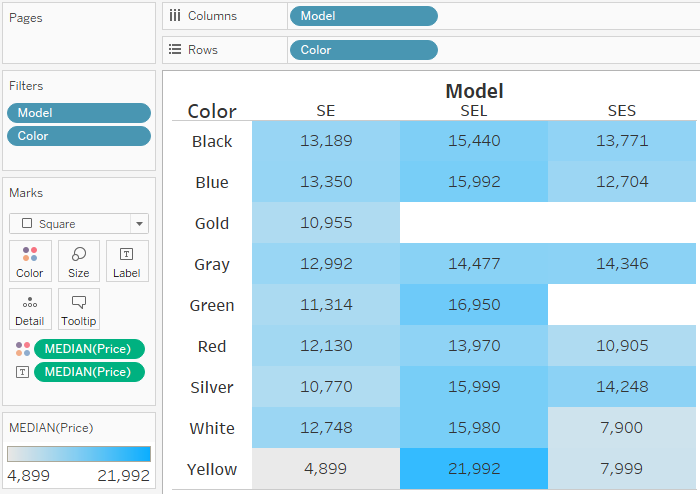

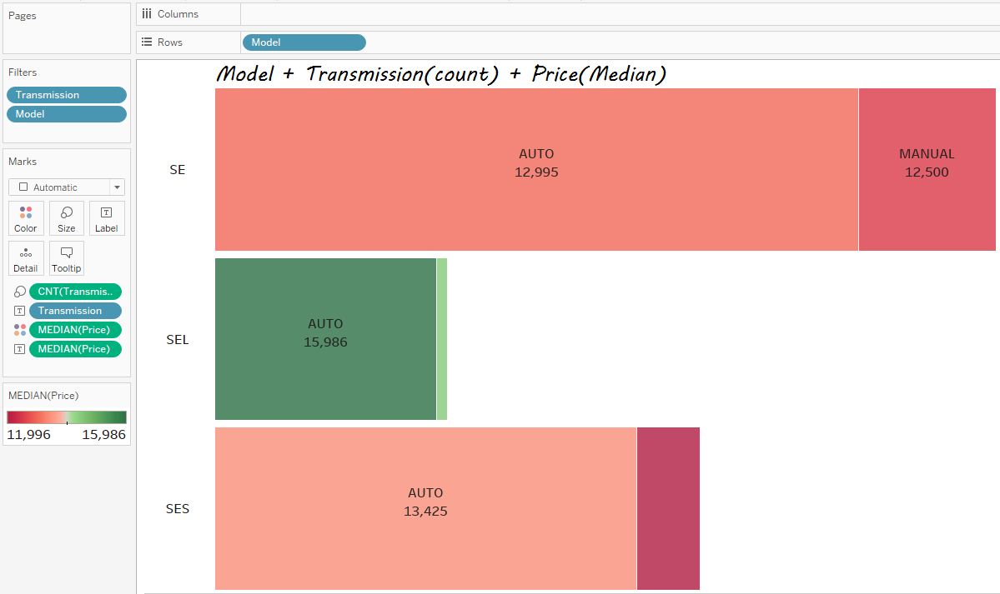

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr-sclr - cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [270]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 cats:   ['model', 'color', 'transmission']

 There are 3 sclrs:  ['year', 'price', 'mileage'] 



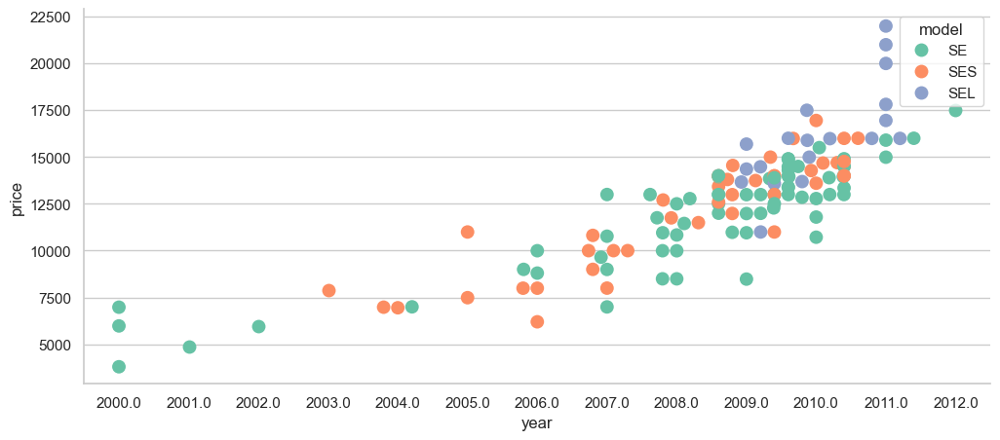

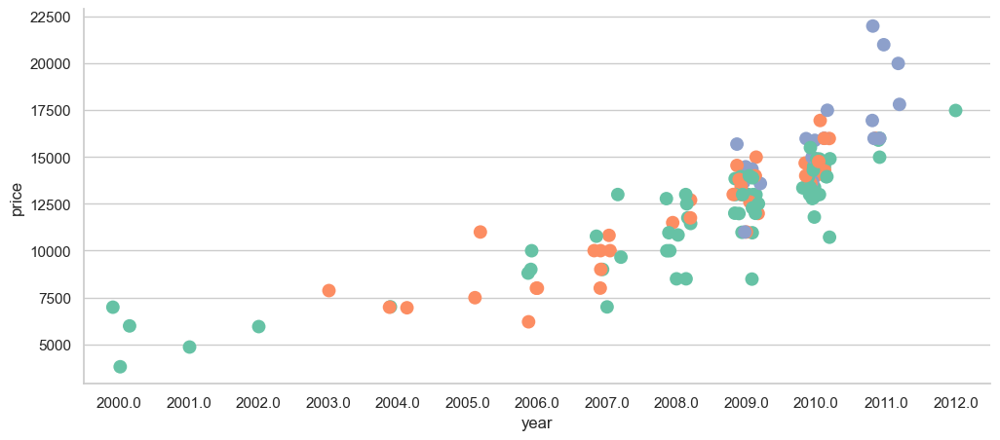

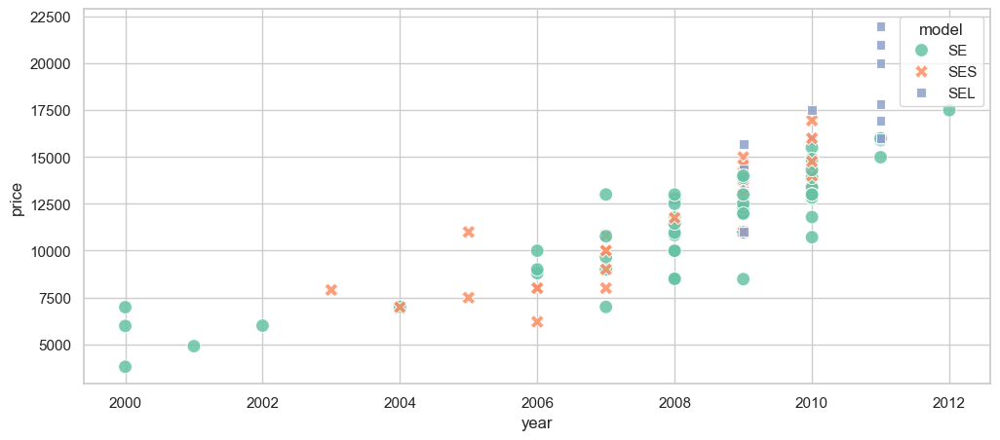

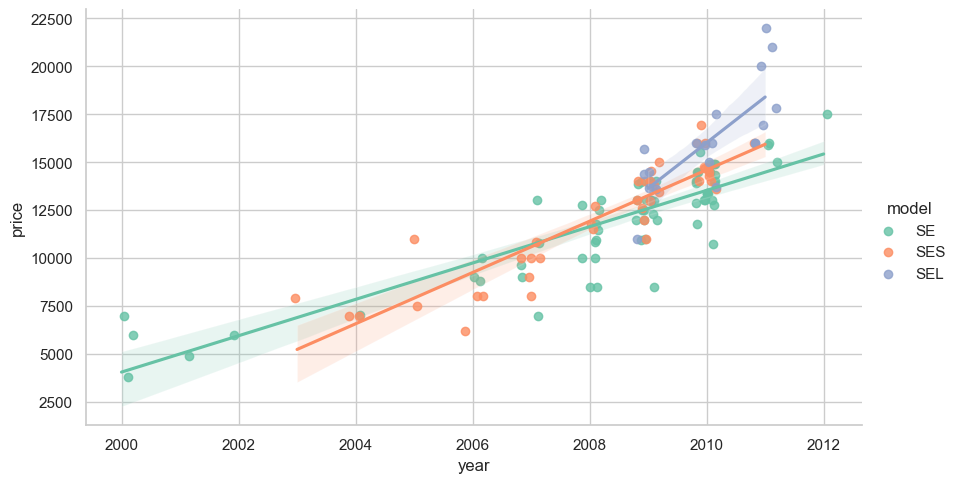

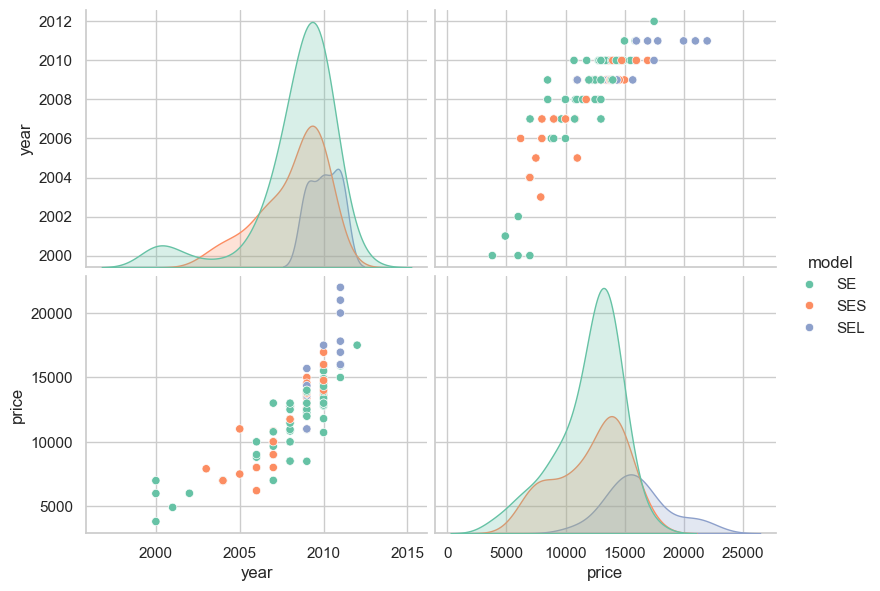

In [190]:
sclr2 =  estimated_column   # y  
sclr1 = 'year'              # x

cat   = 'model' 



# Sampling
np.random.seed(3)
df = df_raw.dropna()
df = df.sample(n=min(1000,df.shape[0]))

# swarmplot
plt.figure(figsize=(12,5))
sns_plot = sns.swarmplot( data=df, x=sclr1, y=sclr2, hue=cat, palette=Palette, s=10 )
sns.despine(); plt.show()

# stripplot
plt.figure(figsize=(12,5))
sns_plot = sns.stripplot( data=df, x=sclr1, y=sclr2, hue=cat, palette=Palette, s=10, jitter=0.2, legend=False )
sns.despine(); plt.show()

# Scatter-Plot 
sns.set(rc={'figure.figsize':(12,5)}); sns.set(style='whitegrid')
sns_plot = sns.scatterplot( x=sclr1, y=sclr2, hue=cat, style=cat, data=df, markers=True, s=100, alpha=.85, palette=Palette) 
#sns_plot.set( title="scatterplot" )
fig = sns_plot.get_figure(); fig.savefig('scatterplot.png'); plt.show()

# ImPlot 
sns.lmplot( x=sclr1, y=sclr2, data=df, hue=cat, palette=Palette, height=5, aspect=16/9, x_jitter=0.2 ); plt.show() 

# PairPlot
g = sns.pairplot( df, vars=[sclr1,sclr2], hue=cat, diag_kind='kde', palette=Palette, height=3, aspect=4/3 )
#g._legend.remove() 
plt.show()

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr(Time)-sclr - cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [385]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 cats:   ['model', 'color', 'transmission']

 There are 3 sclrs:  ['year', 'price', 'mileage'] 



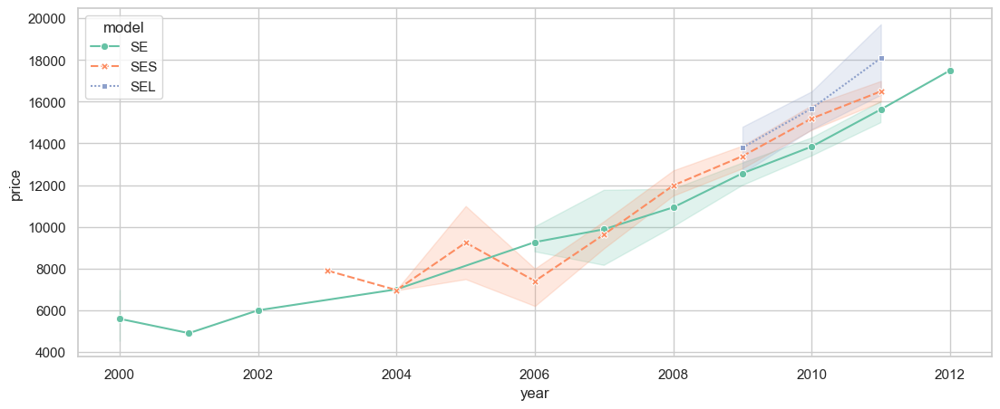

In [411]:
sclr_time = 'year'              # x
sclr2     = estimated_column    # y

cat       = 'model'   

        
# lineplot
sns.set(rc={'figure.figsize':(13,5)}); sns.set(style='whitegrid');
sns_plot = sns.lineplot( x=sclr_time, y=sclr2, data=df_raw, hue=cat, style=cat, markers=True, palette=Palette )
fig = sns_plot.get_figure(); fig.savefig('lineplot.png'); plt.show() 

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr - sclr - sclr 

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [387]:
# help sclrs
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')


 There are 3 sclrs:  ['year', 'price', 'mileage'] 



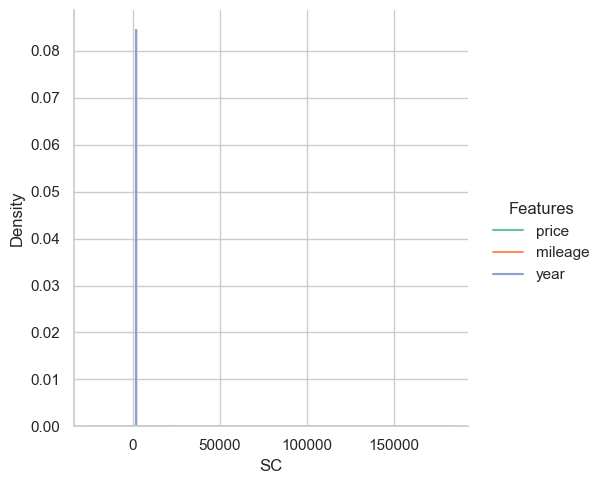

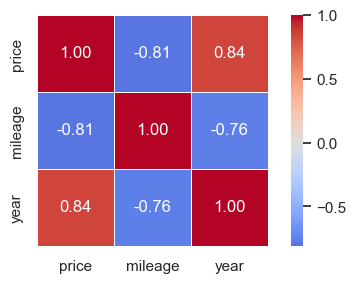

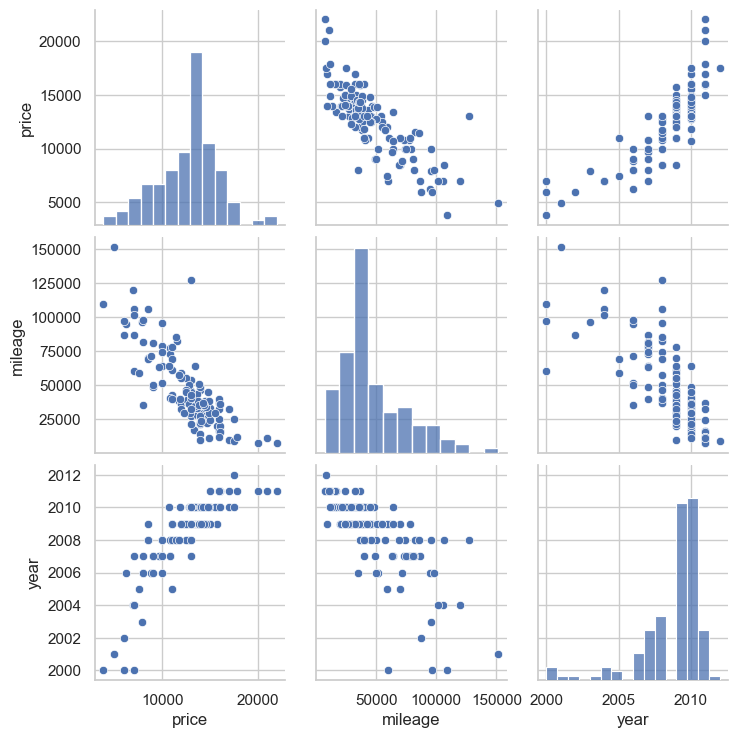




Non-Paired Samples Tests:

Kruskal-Wallis H Test  (Non-Parametric, Median-Based Test)
stat=334.267, p=0.000, Independent Samples

Analysis of Variance Test (ANOVA):  (Parametric, Mean-Based Test)
stat=282.325, p=0.000, Independent Samples

Groups Used in Tukey's HSD
[0, 'price']
[1, 'mileage']
[2, 'year']

Tukey's HSD Pairwise Group Comparisons (95.0% Confidence Interval)
Comparison  Statistic  p-value  Lower CI  Upper CI
 (0 - 1) -33916.068     0.000-38521.671-29310.465
 (0 - 2)  10615.947     0.000  6010.344 15221.550
 (1 - 0)  33916.068     0.000 29310.465 38521.671
 (1 - 2)  44532.015     0.000 39926.412 49137.618
 (2 - 0) -10615.947     0.000-15221.550 -6010.344
 (2 - 1) -44532.015     0.000-49137.618-39926.412





Paired-Samples Tests:

Friedman Test:  (Non-Parametric, Median-Based Test)
stat=245.820, p=0.000, Dependent Samples

Repeated Measures ANOVA Test
Currently not supported in Python




Ordinal-Samples Tests:

Kendall's Rank Correlation Test:
stat=-0.628, p=0.000, Cor

In [412]:
sclr1 = 'price'         
sclr2 = 'mileage'       
sclr3 = 'year'    
                           

# Sampling
np.random.seed(3); 
df = df_raw.dropna()
df = df.sample(n=min(3000,df.shape[0]))

sc1 = list( df[sclr1].copy() )
sc2 = list( df[sclr2].copy() )
sc3 = list( df[sclr3].copy() )


# displot (1)
sc_A, sc_B, sc_C = [], [], []
for i in range(len(sc1)): sc_A.append(sclr1)
for i in range(len(sc2)): sc_B.append(sclr2)
for i in range(len(sc3)): sc_C.append(sclr3)
df_sc = pd.DataFrame([ sc1+sc2+sc3, sc_A+sc_B+sc_C ]).T
df_sc.columns = ['SC','Features'] 
sns_plot = sns.displot(data=df_sc, x='SC', hue='Features', kind="kde", palette=Palette); plt.show()

# Correlation-Matrix
f,ax = plt.subplots(figsize=(6,3))
corr = df_raw[ [sclr1,sclr2,sclr3] ].corr('pearson')
sns_plot = sns.heatmap( corr, mask=np.zeros_like(corr,dtype=bool), cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
fig = sns_plot.get_figure(); fig.savefig('heatmap.png'); plt.show()

# PairPlot
sns.pairplot( data=df, vars=[sclr1,sclr2,sclr3], palette=Palette ); plt.show()

 




##
## Non-Paired Samples Tests
##
print("\n\n\nNon-Paired Samples Tests:")

# Kruskal-Wallis H Test:   Tests whether the distributions of two or more independent samples are equal or not.
print("\nKruskal-Wallis H Test  (Non-Parametric, Median-Based Test)") 
from scipy.stats import kruskal 
stat, p = kruskal( sc1, sc2, sc3 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')     
    
# Analysis of Variance Test (ANOVA):   Tests whether the means of two or more independent samples are significantly different.
print("\nAnalysis of Variance Test (ANOVA):  (Parametric, Mean-Based Test)")
from scipy.stats import f_oneway 
stat, p = f_oneway( sc1, sc2, sc3 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')

# Printing Groups Used in Tukey's HSD
print("\nGroups Used in Tukey's HSD")
i = 0
for sclr in [sclr1,sclr2,sclr3]:
    print([i, sclr])
    i = i+1    
    
# Tukey_HSD
from scipy.stats import tukey_hsd
print('') 
print( tukey_hsd( sc1, sc2, sc3 ) )


    
##
## Paired-Samples Tests
##
print("\n\n\n\nPaired-Samples Tests:")

# Friedman Test:   Tests whether the distributions of two or more paired samples are equal or not.
print("\nFriedman Test:  (Non-Parametric, Median-Based Test)")  
from scipy.stats import friedmanchisquare
stat, p = friedmanchisquare( sc1, sc2, sc3 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')   

# Repeated Measures ANOVA Test:   Tests whether the means of two or more paired samples are significantly different.
print("\nRepeated Measures ANOVA Test")
print("Currently not supported in Python")


    
##
## Ordinal Samples Tests
##
print("\n\n\n\nOrdinal-Samples Tests:")    
  
# Kendall's Rank Correlation Test
print("\nKendall's Rank Correlation Test:")
from scipy.stats import kendalltau
stat, p = kendalltau( sc1, sc2, sc3 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated'  ) 


    
##
## Categorical Samples Tests
##
print("\n\n\n\nCategorical-Samples Tests:")

# Chi-Squared Test
from scipy.stats import chi2_contingency
print("\nChi-Squared Test:")
table = [ sc1, sc2, sc3 ]
stat, p, dof, expected = chi2_contingency(table)
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 

#####   

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Multivariate Analysis

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> All Sclrs

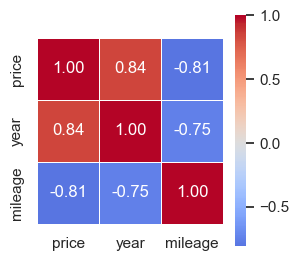

In [45]:
# Correlation-Matrix
_,ax = plt.subplots(figsize=(len(sclrs),len(sclrs)))
corr = df_raw[ sclrs ].corr('pearson')
sns_plot = sns.heatmap( corr,  mask=np.zeros_like(corr,dtype=bool),  cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
sns_plot.get_figure().savefig('heatmap.png'); plt.show()

#####     

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr-sclr-sclr - cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [ ]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')

In [ ]:
sclr1 = 'price'      # estimated_column
sclr2 = 'mileage'       
sclr3 = 'year'   

cat   = 'model'

# Sampling
np.random.seed(3); 
df = df_raw.dropna()
df = df.sample(n=min(3000,df.shape[0]))

# PairPlot  
g = sns.pairplot( data=df, vars=[sclr1,sclr2,sclr3], hue=cat, palette=Palette ) 
#g._legend.remove() 
plt.show()

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr-sclr - cat-cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [ ]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')

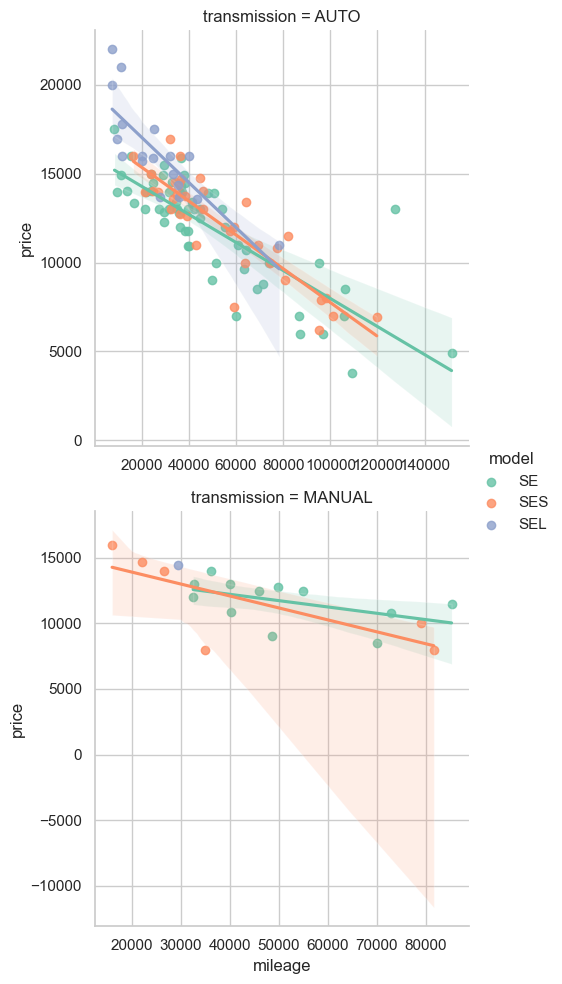

In [414]:
sclr1 = 'mileage' 
sclr2 = estimated_column   # estimated_column
        
cat1  = 'model'           
cat2  = 'transmission'


# Sampling
np.random.seed(3)
df = df_raw.dropna()
df = df.sample(n=min(2000,df.shape[0])).sort_values([cat2])

 
# ImPlot 
sns.lmplot( x=sclr1, y=sclr2, data=df, hue=cat1, col=None, row=cat2, height=5, palette=Palette,
            facet_kws=dict(sharex=False, sharey=False) )
plt.show()


#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr-sclr - cat-cat-cat

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [ ]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')

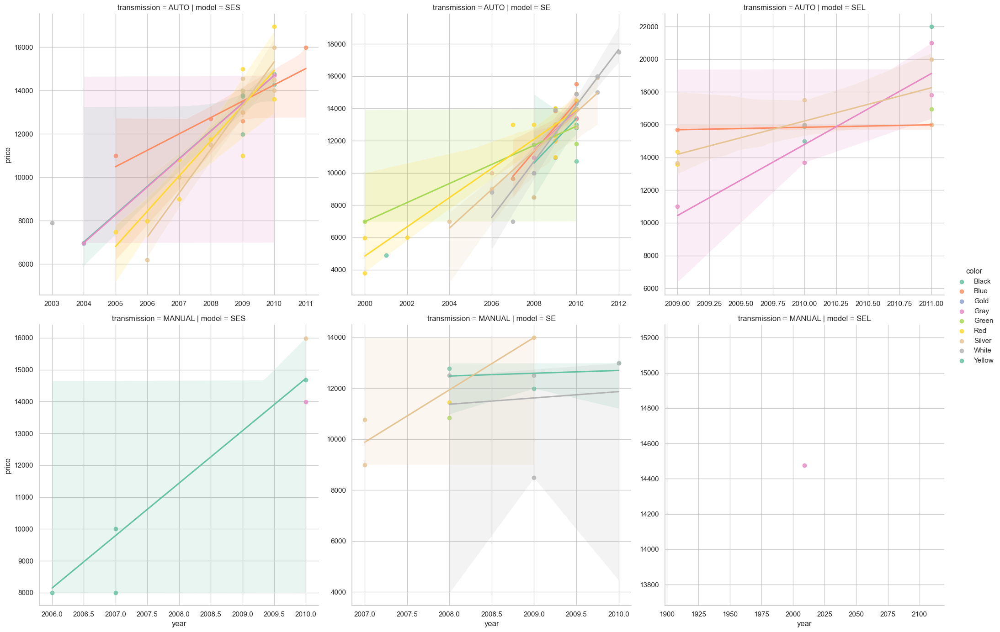

In [415]:
sclr1 = 'year'    
sclr2 = estimated_column   # estimated_column        
        
cat1  = 'model'
cat2  = 'color'
cat3  = 'transmission'


# Sampling
np.random.seed(3); 
df = df_raw.dropna()
df = df.sample(n=min(3000,df.shape[0])).sort_values([cat2])

# ImPlot 
sns.lmplot( x=sclr1, y=sclr2, data=df, hue=cat2, col=cat1, row=cat3, height=7, palette=Palette,
            facet_kws=dict(sharex=False, sharey=False) )
plt.show()


#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> sclr - sclr - sclr - sclr

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:red;"> modified

In [ ]:
# help sclrs
print('\n There are '+str(len(cats)) +' cats:  ',cats       )
print('\n There are '+str(len(sclrs))+' sclrs: ',sclrs, '\n')

In [ ]:
# sclr - sclr - sclr - sclr  

sclr1 = 'price'  
sclr2 = 'mileage'       
sclr3 = 'year'     
sclr4 = 'price'   

# Sampling
np.random.seed(3); 
df = df_raw.dropna()
df = df.sample(n=min(3000,df.shape[0]))

sc1 = list( df[sclr1].copy() )
sc2 = list( df[sclr2].copy() )
sc3 = list( df[sclr3].copy() )
sc4 = list( df[sclr4].copy() )


# Hist
df[ [sclr1,sclr2,sclr3,sclr4] ].hist(bins=64,grid=False,color='dodgerblue',figsize=(13,6)); plt.show()

# Shape Parameters: Skewness and Kurtosis
SKEW = df[ [sclr1,sclr2,sclr3,sclr4] ].skew() 
KURT = df[ [sclr1,sclr2,sclr3,sclr4] ].kurt() 

Shape_Parameters = pd.DataFrame([KURT,SKEW]).T
Shape_Parameters.columns = ['Kurtosis','Skewness']
Shape_Parameters.sort_values(['Kurtosis','Skewness'],ascending=[False,False],inplace=True)
print(Shape_Parameters)


# displot  
sc_A, sc_B, sc_C, sc_D = [], [], [], []
for i in range(len(sc1)): sc_A.append(sclr1)
for i in range(len(sc2)): sc_B.append(sclr2)
for i in range(len(sc3)): sc_C.append(sclr3)
for i in range(len(sc4)): sc_D.append(sclr4)
df_sc = pd.DataFrame([ sc1+sc2+sc3+sc4, sc_A+sc_B+sc_C+sc_D ]).T
df_sc.columns = ['SC','Features'] 
sns_plot = sns.displot(data=df_sc, x='SC', hue='Features', kind="kde", palette=Palette); plt.show()

# Correlation-Matrix
f,ax = plt.subplots(figsize=(6,3))
corr = df_raw[ [sclr1,sclr2,sclr3,sclr4] ].corr('pearson')
sns_plot = sns.heatmap( corr, mask=np.zeros_like(corr,dtype=bool), cmap='coolwarm',
                        square=True, ax=ax, annot=True, center=0.00, fmt='.2f', linewidth=.5 ) 
fig = sns_plot.get_figure(); fig.savefig('heatmap.png'); plt.show()

# PairPlot
sns.pairplot( data=df, vars=[sclr1,sclr2,sclr3,sclr4], palette=Palette ); plt.show()



##
## Non-Paired Samples Tests
##
print("\n\n\nNon-Paired Samples Tests:")

# Kruskal-Wallis H Test:   Tests whether the distributions of two or more independent samples are equal or not.
print("\nKruskal-Wallis H Test  (Non-Parametric, Median-Based Test)") 
from scipy.stats import kruskal 
stat, p = kruskal( sc1, sc2, sc3, sc4 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')     
    
# Analysis of Variance Test (ANOVA):   Tests whether the means of two or more independent samples are significantly different.
print("\nAnalysis of Variance Test (ANOVA):  (Parametric, Mean-Based Test)")
from scipy.stats import f_oneway 
stat, p = f_oneway( sc1, sc2, sc3, sc4 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')

# Printing Groups Used in Tukey's HSD
print("\nGroups Used in Tukey's HSD")
i = 0
for sclr in [sclr1,sclr2,sclr3,sclr4]:
    print([i, sclr])
    i = i+1
    
# Tukey_HSD
from scipy.stats import tukey_hsd
print('')
print( tukey_hsd( sc1, sc2, sc3, sc4 ) )


    
##
## Paired-Samples Tests
##
print("\n\n\n\nPaired-Samples Tests:")

# Friedman Test:   Tests whether the distributions of two or more paired samples are equal or not.
print("\nFriedman Test:  (Non-Parametric, Median-Based Test)")  
from scipy.stats import friedmanchisquare
stat, p = friedmanchisquare( sc1, sc2, sc3, sc4 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples')   

# Repeated Measures ANOVA Test:   Tests whether the means of two or more paired samples are significantly different.
''' 
print("\nRepeated Measures ANOVA Test")
print("Currently not supported in Python")
'''

    
##
## Ordinal Samples Tests
##
''' 
print("\n\n\n\nOrdinal-Samples Tests:")    
  
# Kendall's Rank Correlation Test
print("\nKendall's Rank Correlation Test:")
from scipy.stats import kendalltau
stat, p = kendalltau( sc1, sc2, sc3, sc4 )
if p < 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Correlated')
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Not Correlated'  ) 
''' 

    
##
## Categorical Samples Tests
##
''' 
print("\n\n\n\nCategorical-Samples Tests:")

# Chi-Squared Test
from scipy.stats import chi2_contingency
print("\nChi-Squared Test:")
table = [ sc1, sc2, sc3, sc4 ]
stat, p, dof, expected = chi2_contingency(table)
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 
'''

print("\n\n")

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Statistic Vs Parameter
 - Sample --- Population
 - Statistic --- Parameter
 - Xbar --- mue
 - SD --- Sigma
 - SD^2 --- Sigma^2
 - n --- N

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Range

In [340]:
Sample = [10, 12, 15, 18, 21, 21, 23, 24, 25, 27, 29, 30]
n  =  len(Sample)
H  =  max(Sample)
L  =  min(Sample)
R  = (H-L)          # Range
MR = (H+L) / 2      # Mid-Range
CR = (H-L) / (H+L)  # Coeff of Range
    
print( n, R, MR, CR )

12 20 20.0 0.5


<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> ME --- Margin of Error
 - for small samples --- n <= 30
 - for large samples --- n > 30

In [535]:
import scipy.stats as stats
def margin_of_error( sample, confidence=0.95 ):  # sample = [5,3,5,2,6,7,4,2]
    
    n    = len(sample)
    mean = np.mean(sample)
    sd   = np.std(sample,ddof=1)  # standard deviation
    se   = sd / n**.5             # standard error of mean
     
    
    if n<30:  
        
        # small sample --- use t-distribution --- t_critical
        print()
        print('n    = '+str(n)+' < 30   ---   small sample   ---   t-distribution')
        print('mean =', np.round(mean,2) )
        print('sd   =', np.round(sd,2)   )
        print('se   =', np.round(se,2) ,'  ---   standard error = sd / n**.5')
        print()
        
        dist_type  = 't-distribution'
        t_critical = stats.t.ppf( (1+confidence)/2, df=n-1 )
        moe        = t_critical * se   # margin of error 
        
        print('t_critical =  '+str(np.round(t_critical,2)))
        print('moe        = ±'+str(np.round(moe,2))+ '      ---   margin of error = se * t_critical')
        print()
        print( np.round((mean-moe),2),'<= Population Mean <=',np.round((mean+moe),2))
        print('\n')
        
        return [n, mean, sd, se, t_critical, moe]
          
    else:  
        
        # large sample --- use normal distribution --- z_critical
        print()
        print('n    = '+str(n)+' >= 30   ---   large sample   ---   normal distribution')
        print('mean =', np.round(mean,2) )
        print('sd   =', np.round(sd,2)   )
        print('se   =', np.round(se,2) ,'  ---   standard error = sd / n**.5')
        print()
        
        dist_type  = 'normal distribution'   
        z_critical = stats.norm.ppf( (1+confidence)/2 )
        moe        = z_critical * se   # margin of error 
        
        print('z_critical =  '+str(np.round(z_critical,2)))
        print('moe        = ±'+str(np.round(moe,2))+ '     ---   margin of error = se * z_critical')
        print()
        print( np.round((mean-moe),2),'<= Population Mean <=',np.round((mean+moe),2))
        print('\n')
        
        return [n, mean, sd, se, z_critical, moe]


<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

In [544]:
# example
np.random.seed(42)

# Small Sample Example ( n <= 30 )
small_sample = np.random.normal( loc=835, scale=35, size=25 )
n, mean, sd, se, t_critical, moe = margin_of_error( small_sample )

# Large Sample Example ( n > 30 )
large_sample = np.random.normal( loc=835, scale=35, size=100 )
n, mean, sd, se, t_critical, moe = margin_of_error( large_sample )


n    = 25 <= 30   ---   small sample   ---   t-distribution
mean = 829.28
sd   = 33.48
se   = 6.7   ---   standard error = sd / n**.5

t_critical =  2.06
moe        = ±13.82      ---   margin of error = se * t_critical

815.46 <= Population Mean <= 843.1



n    = 100 > 30   ---   large sample   ---   normal distribution
mean = 833.27
sd   = 32.53
se   = 3.25   ---   standard error = sd / n**.5

z_critical =  1.96
moe        = ±6.37     ---   margin of error = se * z_critical

826.89 <= Population Mean <= 839.64




In [545]:
# Visualizing
df_small = pd.DataFrame(); df_small['small_sample']=small_sample
df_large = pd.DataFrame(); df_large['large_sample']=large_sample
df = pd.concat( [ df_small['small_sample'],df_large['large_sample'] ], axis=1 )
df

,small_sample,large_sample
0,852.384995,838.882291
1,830.160749,794.715225
2,857.669099,848.149431
3,888.306045,813.977646
4,826.804632,824.790719
5,826.805207,813.940269
6,890.272449,899.829736
7,861.860216,834.527597
8,818.568396,797.980117
9,853.989602,863.789072


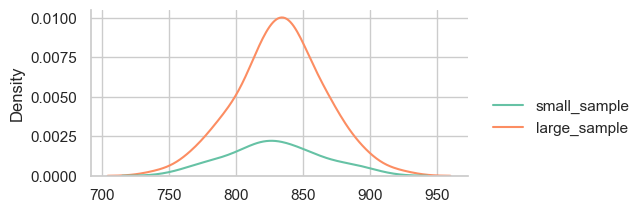

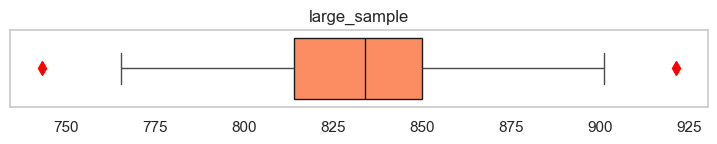

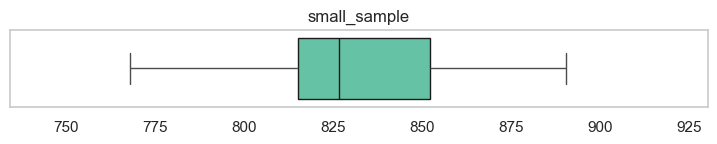


Mann-Whitney U Test:  (Non-Parametric, Median-Based Test)
stat=1144.000, p=0.515, Dependent Samples


In [546]:
sclr1 = 'small_sample'  # x
sclr2 = 'large_sample'  # y

sc1 = list( df[sclr1].copy().dropna() )
sc2 = list( df[sclr2].copy().dropna() )

# displot (1)
sc_A, sc_B = [], []
for i in range(len(sc1)): sc_A.append(sclr1)
for i in range(len(sc2)): sc_B.append(sclr2)
df_sc = pd.DataFrame([ sc1+sc2, sc_A+sc_B ]).T
df_sc.columns = ['SC',' ']
sns_plot = sns.displot(data=df_sc, x='SC', hue=' ', kind="kde", height=2.5, aspect=2, palette=Palette, legend=True)
plt.xlabel('');  #plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()

# BoxPlot
medianprops = dict( color     = 'k', linewidth  = 1  )
flierprops  = dict( marker    = 'd', markersize = 7, markerfacecolor = 'red', markeredgecolor = 'red' ) 


plt.figure(  figsize=(9,1)  )
boxprops    = dict( edgecolor = 'k', facecolor  = '#FC8D62', linewidth = 1 )
sns.boxplot( x=sc2, boxprops=boxprops, medianprops=medianprops, flierprops=flierprops )
xmin, xmax, ymin, ymax = plt.axis()
plt.xlabel(''); plt.ylabel(''); plt.grid(False); plt.title(sclr2); plt.show() 

plt.figure(  figsize=(9,1)  )
boxprops    = dict( edgecolor = 'k', facecolor  = '#66C2A5', linewidth = 1 )
sns.boxplot( x=sc1, boxprops=boxprops, medianprops=medianprops, flierprops=flierprops )
plt.xlim( xmin, xmax )
plt.xlabel(''); plt.ylabel(''); plt.grid(False); plt.title(sclr1); plt.show()     


# Mann-Whitney U Test:   Tests whether the distributions of two independent samples are equal or not.
print("\nMann-Whitney U Test:  (Non-Parametric, Median-Based Test)")
from scipy.stats import mannwhitneyu  
stat, p = mannwhitneyu( sc1, sc2 )
if p > 0.05: print('stat=%.3f, p=%.3f,' % (stat, p), 'Dependent Samples'  )
else       : print('stat=%.3f, p=%.3f,' % (stat, p), 'Independent Samples') 

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Critical Value for Margin of Error
 - n . . . . . . . sample size
 - n < 30 . . . t-distribution
 - n ≥ 30 . . . z-distribution (normal distribution)

In [801]:
from scipy.stats import t, norm
def critic_val(n, confidence=0.95):
    if n < 30:   return    t.ppf( (1+confidence)/2, df=n-1 )
    else     :   return norm.ppf( (1+confidence)/2         )

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Clean Array
 - Removing None
 - Removing Extreme Outliers

In [1353]:
def clean_Array(dirty_Array):
    
    # removing None
    L = pd.DataFrame(dirty_Array).dropna()[0].tolist()
    
    
    # removing Extreme Outliers
    P_25  = np.percentile( L, 25 )
    P_50  = np.percentile( L, 50 )
    P_75  = np.percentile( L, 75 )
    IQR   = P_75 - P_25
    lower = P_25 - 1.5*IQR
    upper = P_75 + 1.5*IQR
    
    V = []
    for l in L:
        if   l<=lower: V.append(lower)
        elif upper<=l: V.append(upper)
        else         : V.append(l)
            
    M     = np.mean(V)
    SD    = np.std(V) 
    lower = M-3*SD
    upper = M+3*SD
    
    Array = []
    for l in L:
        if lower<=l and l<=upper:   Array.append(l)
    
    return np.array(Array)

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Standard Errors
 - SEM . . . . Standard Error of Mean
 - SEMdn . . Standard Error of Median
 - SESD . . . Standard Error of Standard Deviation
 - SEV . . . . Standard Error of Variance
** **
 - SED ... Standard Error of Difference between two means
 - SECt ... Standard Error of Count
 - SEP ... Standard Error of Proportion
 - SEDP ... Standard Error of Difference between two proportions
 - SER ... Standard Error of (Linear) Regression Slope
 - SEC ... Standard Error of Correlation Coefficient

7.5  <=   mean   <=  11.64
7.13  <=  median  <=  12.0

2.72  <=   std    <=  6.07
3.27  <=   std    <=  6.53   ---   chi2

5.01  <=   var    <=  33.62
10.7  <=   var    <=  42.69   ---   chi2


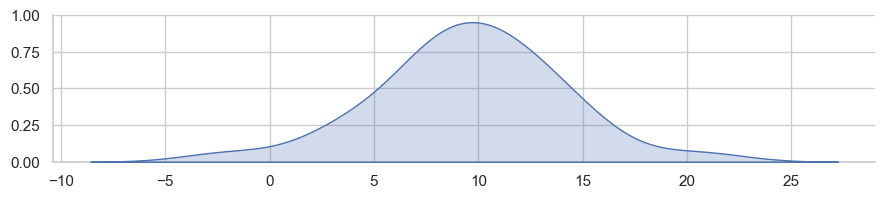

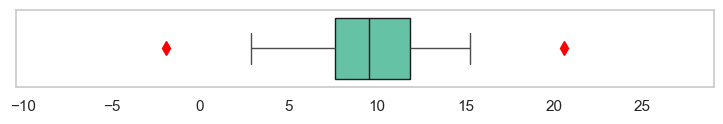

In [1354]:
def find_margin_of_errors( Array, n_bootstrap=1000, CI=0.95 ):

    # n
    n = len(Array)
    
    # Critical Value
    c_val  = critic_val( n, CI )
    
    # statistics
    mean   = np.mean(   Array         )
    median = np.median( Array         )
    std    = np.std(    Array, ddof=1 )
    var    = np.var(    Array, ddof=1 )
    
    ## Method1:  moe = c_val * se
    # Standard Error by Bootstrap
    Mean, Median, Std, Var = [],[],[],[]
    for i in range(n_bootstrap):
        resample = np.random.choice( Array, size=n, replace=True )
        Mean.append(   np.mean(   resample         ))
        Median.append( np.median( resample         ))
        Std.append(    np.std(    resample, ddof=1 ))
        Var.append(    np.var(    resample, ddof=1 ))
    se_bootstrap_mean   = np.std( Mean    , ddof=1 )
    se_bootstrap_median = np.std( Median  , ddof=1 )
    se_bootstrap_std    = np.std( Std     , ddof=1 )
    se_bootstrap_var    = np.std( Var     , ddof=1 )
    
    # Standard Error by direct Formula
    se_direct_mean =               np.std( Array, ddof=1 )     / np.sqrt(  n        )
    se_direct_std  =               np.std( Array, ddof=1 )     / np.sqrt( (n-1) * 2 )
    se_direct_var  = np.sqrt( 2 * (np.std( Array, ddof=1 )**4) /          (n-1)     )
    
    # Margin of Error
    moe_mean    =  c_val * max( se_bootstrap_mean, se_direct_mean )
    moe_median  =  c_val *      se_bootstrap_median
    moe_std     =  c_val * max( se_bootstrap_std , se_direct_std  )
    moe_var     =  c_val * max( se_bootstrap_var , se_direct_var  )
    
    # lower & upper
    lower_mean  , upper_mean   =   mean-moe_mean  ,   mean+moe_mean
    lower_median, upper_median = median-moe_median, median+moe_median
    lower_std   , upper_std    =    std-moe_std   ,    std+moe_std
    lower_var   , upper_var    =    var-moe_var   ,    var+moe_var
    
    
    ## Method2:  moe = chi2.ppf()
    from scipy.stats import chi2
    
    chi2_lower     = chi2.ppf( (1-CI)/2,  n-1   ) 
    chi2_upper     = chi2.ppf( (1+CI)/2,  n-1   )
    
    sd             =   np.std(  Array  , ddof=1 )
    var            =   np.var(  Array  , ddof=1 )
    
    chi2_lower_std =   np.sqrt( (n-1) / chi2_upper ) * sd
    chi2_upper_std =   np.sqrt( (n-1) / chi2_lower ) * sd
     
    chi2_lower_var =          ( (n-1) / chi2_upper ) * var
    chi2_upper_var =          ( (n-1) / chi2_lower ) * var
    
    return [ lower_mean  , upper_mean  ,   
             lower_median, upper_median,   
             lower_std   , upper_std   ,   chi2_lower_std, chi2_upper_std,
             lower_var   , upper_var   ,   chi2_lower_var, chi2_upper_var
           ]

# example                        mean     sd       n
dirty_Array = np.random.normal( loc=10, scale=5, size=30 )
Array       = clean_Array( dirty_Array )
n_BootStrap = 1000
CI          = 0.99


# MOE
MOE = find_margin_of_errors( Array, n_bootstrap=n_BootStrap, CI=CI )
MOE = np.round( np.array(MOE), 2 )
lower_mean  , upper_mean   = MOE[0], MOE[1]
lower_median, upper_median = MOE[2], MOE[3]
lower_std   , upper_std,  chi2_lower_std,  chi2_upper_std  =  MOE[4], MOE[5], MOE[6] , MOE[7]
lower_var   , upper_var,  chi2_lower_var,  chi2_upper_var  =  MOE[8], MOE[9], MOE[10], MOE[11]

# Report
print( str(lower_mean)    +'  <=   mean   <=  '+str(upper_mean)                       )
print( str(lower_median)  +'  <=  median  <=  '+str(upper_median)  +    '\n'          )
print( str(lower_std)     +'  <=   std    <=  '+str(upper_std)                        )
print( str(chi2_lower_std)+'  <=   std    <=  '+str(chi2_upper_std)+'   ---   chi2\n' )
print( str(lower_var)     +'  <=   var    <=  '+str(upper_var)                        )
print( str(chi2_lower_var)+'  <=   var    <=  '+str(chi2_upper_var)+'   ---   chi2'   )


# pair-plot
df = pd.DataFrame([Array]).T;  df.columns=['']
sns.pairplot(df, diag_kind='kde', height=2.0, aspect=9/2.0, dropna=True ); 
xmin, xmax, ymin, ymax = plt.axis(); plt.axis(False); plt.xlabel(''); plt.ylabel(''); plt.show()

# BoxPlot
boxprops    = dict( edgecolor = 'k', facecolor  = '#66C2A5', linewidth = 1 )
medianprops = dict( color     = 'k', linewidth  = 1  )
flierprops  = dict( marker    = 'd', markersize = 7, markerfacecolor = 'red', markeredgecolor = 'red' ) 

plt.figure(  figsize=(9,1)  )
sns.boxplot( x=Array, boxprops=boxprops, medianprops=medianprops, flierprops=flierprops )
plt.xlabel(''); plt.ylabel(''); plt.grid(False); plt.title(''); 
plt.xlim(xmin, xmax); plt.show()

In [1359]:
# SED ... Standard Error of Difference between two means
def sed( Array1, Array2 ):
    print( '|mean1 - mean2| =', np.round( np.abs( np.mean(Array1)-np.mean(Array2) ), 2 ))
    se1 = np.std(Array1,ddof=1) / np.sqrt(len(Array1))
    se2 = np.std(Array2,ddof=1) / np.sqrt(len(Array2))
    return np.sqrt( se1**2 + se2**2 )

Array1=np.random.normal(loc=100,scale=20,size=30);  Array1=clean_Array(Array1)  
Array2=np.random.normal(loc=12 ,scale=3 ,size=30);  Array2=clean_Array(Array2)
print( 'SED =', np.round(sed( Array1, Array2 ), 2 ))

|mean1 - mean2| = 92.69
SED = 3.51


In [1364]:
# SECt ... Standard Error of Count
def sect( Array ):
    count_se = np.sqrt( len(Array) )
    return count_se

Array=np.random.normal(loc=10,scale=2,size=36);  Array=clean_Array(Array) 
print( 'SECt =', np.round(sect( Array ), 2 ))

SECt = 6.0


In [1371]:
# SEP ... Standard Error of Proportion
def sep( Array ):  
    p_hat=np.mean(Array); print( 'p_hat =',p_hat)
    return np.sqrt( (p_hat*(1-p_hat)) / len(Array) )

Array=np.random.binomial(n=1,p=0.6,size=50);  Array=clean_Array(Array)
print( 'SEP =', np.round(sep(Array), 2 ))

p_hat = 0.54
SEP = 0.07


In [1373]:
# SEDP ... Standard Error of Difference between two proportions
def sedp( Array1, Array2 ):  
    p_hat1, p_hat2 = np.mean(Array1), np.mean(Array2)
    print( ' p_hat1 , p_hat2  =', p_hat1, p_hat2)
    print( '|p_hat1 - p_hat2| =', np.round(abs(p_hat1-p_hat2), 2 ))
    return np.sqrt( (p_hat1*(1-p_hat1))/len(Array1) + (p_hat2*(1-p_hat2))/len(Array2) )

Array1=np.random.binomial(n=1,p=0.6,size=200);  Array1=clean_Array(Array1)
Array2=np.random.binomial(n=1,p=0.3,size=200);  Array2=clean_Array(Array2)
print( ' SEDP =', np.round(sedp(Array1, Array2), 2 ))

 p_hat1 , p_hat2  = 0.6 0.335
|p_hat1 - p_hat2| = 0.26
 SEDP = 0.05


intercept    = 10.92
coef (slope) = 2.82
SER = 0.18


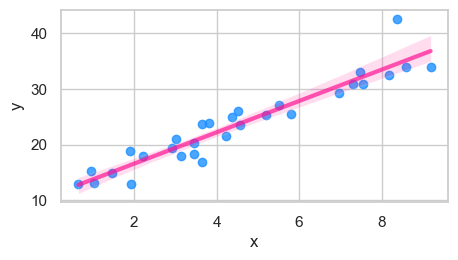

In [1378]:
# SER ... Standard Error of (Linear) Regression Slope
from sklearn.linear_model import LinearRegression
def ser( x_Array, y_Array ):
    X_Array   = []
    for x in x_Array: X_Array.append([x])
    X_Array   = np.array(X_Array)
    lin_model = LinearRegression().fit(X_Array,y_Array)
    print( 'intercept    =', np.round( lin_model.intercept_, 2 ) )
    print( 'coef (slope) =', np.round( lin_model.coef_[0], 2 ) )
    y_pred    = lin_model.predict( X_Array )
    x_mean    = np.mean( X_Array )
    slope_se  = np.std( y_Array-y_pred, ddof=1 ) / np.sqrt( np.sum((X_Array-x_mean)**2))
    return slope_se

n         = 30
INTERCEPT = 10
SLOPE     = 3   # coef
x_Array   = (np.random.rand(n,1)*10).flatten()
y_Array   = SLOPE*x_Array + np.random.normal(loc=INTERCEPT,scale=2,size=n)
print( 'SER =', np.round(ser(x_Array, y_Array), 2 ))

# Reg-Plot 
plt.figure(figsize=(5.0,2.5))
df = pd.DataFrame(); df['x']=x_Array; df['y']=y_Array
sns_plot = sns.regplot( x='x', y='y', data=df, scatter_kws={"color":'dodgerblue'} 
                      , line_kws={"color":"deeppink","alpha":0.7,"lw":3} )
sns_plot.get_figure().savefig('regplot.png',bbox_inches='tight',dpi=360); plt.show()

r   = 0.96
SEC = 0.05


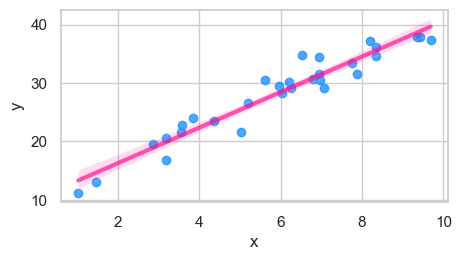

In [1377]:
# SEC ... Standard Error of Correlation Coefficient
def sec( x_Array, y_Array ):
    r = np.corrcoef( x_Array, y_Array )[0,1]
    print( 'r   =', np.round(r,2) )
    corr_se = np.sqrt( (1-r**2) / (len(x_Array)-2) )
    return corr_se


n         = 30
INTERCEPT = 10
SLOPE     = 3
x_Array   = (np.random.rand(n,1)*10).flatten()
y_Array   = SLOPE*x_Array + np.random.normal(loc=INTERCEPT,scale=2,size=n)
print( 'SEC =', np.round(sec(x_Array, y_Array), 2 ))

# Reg-Plot 
plt.figure(figsize=(5.0,2.5))
df = pd.DataFrame(); df['x']=x_Array; df['y']=y_Array
sns_plot = sns.regplot( x='x', y='y', data=df, scatter_kws={"color":'dodgerblue'} 
                      , line_kws={"color":"deeppink","alpha":0.7,"lw":3} )
sns_plot.get_figure().savefig('regplot.png',bbox_inches='tight',dpi=360); plt.show()

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Mean
 - Weighted Mean

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> Weighted Mean

In [371]:
W = np.array([ 3, 3, 2, 2, 1, 1])
X = np.array([20,19,19,20,19,20])
Weighted_Mean = sum(W*X) / sum(W)
Weighted_Mean

19.5

#####   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> flatten reshape

In [1610]:
x = np.array([1,2,3])
x

array([1, 2, 3])

In [1611]:
x = x.reshape(-1,1)
x

array([[1],
       [2],
       [3]])

In [1612]:
x = x.flatten()
x

array([1, 2, 3])

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:1.8em; color:#00b3e5;"> df_long

In [402]:
df_fat = pd.DataFrame( index=['a','b'] )
df_fat['C1'] = [5,6]
df_fat['C2'] = [4,3]
df_fat['C3'] = [4,5]
df_fat['C4'] = [3,5]
df_fat

,C1,C2,C3,C4
a,5,4,4,3
b,6,3,5,5


In [407]:
df_long = df_fat.reset_index().melt( id_vars='index', var_name='C', value_name='Count' )
df_long

,index,C,Count
0,a,C1,5
1,b,C1,6
2,a,C2,4
3,b,C2,3
4,a,C3,4
5,b,C3,5
6,a,C4,3
7,b,C4,5


<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Effect Size
    
 it shows **magnitude** of differences or **strength** of relationships
** ** 
 - **t-test:**
   - **Cohen's d**:
     - used in **t-test**
     - compares **two means**
     - Represents **difference between group means** divided by **pooled standard deviation**
     - Interpretation:
       - **0.2**: **Small**
       - **0.5**: indicates a **Medium** difference
       - **0.8**: **Large**
    
   - **Hedges' g**:
     - used in **t-test**
     - compares **two means**
** **   
 - **correlation** between two variables:
   - **Pearson's r**:
     - measures **strength** and **direction** of a linear relashionship between two variables.
     - **simple linear regression**: r = slope
     - range: **-1 to +1**
     - Interpretation:
       - **0.0**: **No Relationship**
       - **0.1**: **Small**
       - **0.3**: **Medium**
       - **0.5**: **Large**
   
   - **Spearman's rho**:
     - measures **correlation** between two variables
** **
 - **R-squared, R2**
   - Coeff of Determination
   - uses LinearRegression from **scikit-learn**
   - **100 * R2 %** of the **variance in y** is explained by **Xs** via the **linear regression model**
   - Ranges from 0 to 1
   - in simple linear regression (only one x): R2 = r^2
** **
 - **ANOVA:**
   - **Eta-squared**
     - measures **proportion of variance** explained by **group factor**
     - (Tells how much of the variation is explained by group differences)
     - Interpretation:
       - **0.01**: **Small Effect**
       - **0.06**: **Medium Effect**
       - **0.14**: **Large Effect**
    
   - **Omega-squared**
** **
 - **Odds Ratio --- OR**:
   - measures association between **two categorical variables**
   - measures **Odds of an Evnt** occuring in one group compared to another
   - Interpretation:
     - **OR > 1**: **Higher Odds**
     - **OR = 1**: **No Difference**
     - **OR < 1**: **Lower Odds**
** **
 - **Cramer's V**:
   - for **categorical data assosiation** in **contingency tables ( confusion matrix )**
   - uses **Chi2 Statistics** and normalizes it


<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

Effect-Size (Cohen's d) of two Arrays  =  0.51
Guide:  0.2:Small  0.5:Medium  0.8:Large


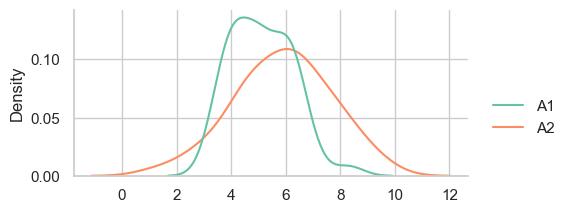

In [1480]:
def cohens_d( Array1, Array2 ):
    n1 = len(Array1);   mean1 = np.mean(Array1);   var1 = np.var(Array1, ddof=1)
    n2 = len(Array2);   mean2 = np.mean(Array2);   var2 = np.var(Array2, ddof=1)
    
    pooled_sd = np.sqrt(((n1-1)*var1+(n2-1)*var2)/(n1+n2-2))
    d  = np.abs(mean1-mean2) / pooled_sd 
    
    return d

# example 
A1 =     np.random.normal(loc=5,scale=1,size=45)
A2 = 1 + np.random.normal(loc=5,scale=2,size=50)
d  = cohens_d( A1, A2 )
d  = np.round(d,2)
print( "Effect-Size (Cohen's d) of two Arrays  = ", d )
print("Guide:  0.2:Small  0.5:Medium  0.8:Large")
 
# displot (1)
sc_A, sc_B = [], []
for i in range(len(A1)): sc_A.append('A1')
for i in range(len(A2)): sc_B.append('A2')
df_sc = pd.DataFrame([ list(A1)+list(A2), sc_A+sc_B ]).T
df_sc.columns = ['SC',' ']
sns_plot = sns.displot(data=df_sc, x='SC', hue=' ', kind="kde", height=2.5, aspect=5/2.5, palette=Palette, legend=True)
plt.xlabel('');  #plt.axis('off')
sns_plot.savefig('bivar_'+sclr2+'_'+sclr1+'_DisPlot_.png',bbox_inches='tight',dpi=120);   plt.show()

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

Effect-Size (Pearson's r) of two Arrays  =  0.98
Guide:  0.1:Small  0.3:Medium  0.5:Large


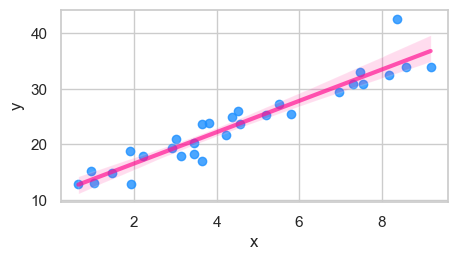

In [1481]:
def pearsons_r( x_Array, y_Array ):
    r,_ = stats.pearsonr( x_Array, y_Array )
    return r

# example
x =         np.random.normal(loc=5,scale=2,size=36)
y = 3 * x + np.random.normal(loc=2,scale=1,size=36)
r = pearsons_r( x, y )
r = np.round(r,2)
print( "Effect-Size (Pearson's r) of two Arrays  = ", r )
print("Guide:  0.1:Small  0.3:Medium  0.5:Large")

# Reg-Plot 
plt.figure(figsize=(5.0,2.5))
df = pd.DataFrame(); df['x']=x_Array; df['y']=y_Array
sns_plot = sns.regplot( x='x', y='y', data=df, scatter_kws={"color":'dodgerblue'} 
                      , line_kws={"color":"deeppink","alpha":0.7,"lw":3} )
sns_plot.get_figure().savefig('regplot.png',bbox_inches='tight',dpi=360); plt.show()

R2 = 0.84


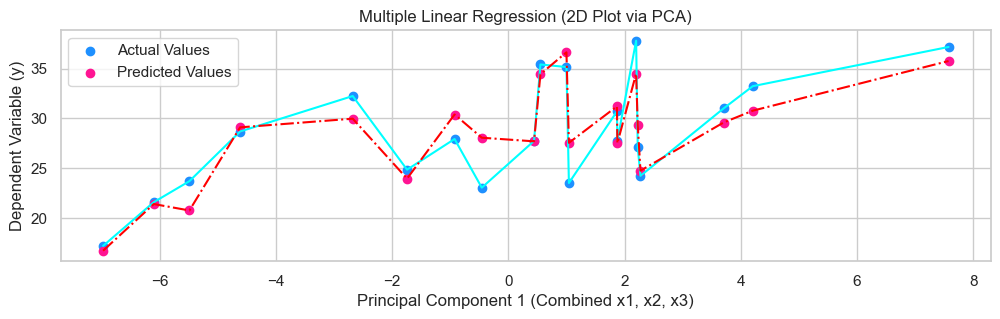

In [1600]:
# R2
from sklearn.linear_model import LinearRegression
def calculate_R2( y, y_pred ): # Array Array 
    ss_res = np.sum( (y-y_pred)**2 )
    ss_tot = np.sum( (y-np.mean(y))**2 )
    R2 = 1 - ( ss_res / ss_tot )
    return R2

# example
#np.random.seed(42)
n_samples = 20

x1 = np.random.normal( loc= 5, scale=2, size=n_samples )
x2 = np.random.normal( loc=10, scale=3, size=n_samples )
x3 = np.random.normal( loc=15, scale=4, size=n_samples )

noise1 = np.random.normal( loc=+0.1, scale=2.0, size=n_samples )
noise2 = np.random.normal( loc=-0.1, scale=1.5, size=n_samples )
y = 2*x1 + 1*x2 + 0.5*x3 + noise

df = pd.DataFrame(); df['x1']=x1; df['x2']=x2; df['x3']=x3; df['y']=y
X  = df[['x1','x2','x3']].values

# model
model  = LinearRegression()
model.fit( X, y )
y_pred = model.predict( X )

# R2
R2 = calculate_R2( y, y_pred )
R2 = np.round( R2, 2 )
print( 'R2 =', R2 )

# PCA
from sklearn.decomposition import PCA
pca   = PCA(n_components=1)
X_pca = pca.fit_transform(X)

# plot
plt.figure(figsize=(12,3))
df=pd.DataFrame();  df['X_pca']=X_pca.flatten();  df['y']=y;  df['y_pred']=y_pred
df=df.sort_values(['X_pca','y','y_pred'],ascending=True)

plt.plot(df['X_pca'],df['y'     ],color='cyan',linewidth=1.5)
plt.plot(df['X_pca'],df['y_pred'],color='red',linewidth=1.5,linestyle='-.')

plt.scatter(X_pca,y     ,color='dodgerblue',label='Actual Values'   )
plt.scatter(X_pca,y_pred,color='deeppink'  ,label='Predicted Values')

plt.title("Multiple Linear Regression (2D Plot via PCA)")
plt.xlabel("Principal Component 1 (Combined x1, x2, x3)")
plt.ylabel("Dependent Variable (y)")
plt.legend()
plt.show()

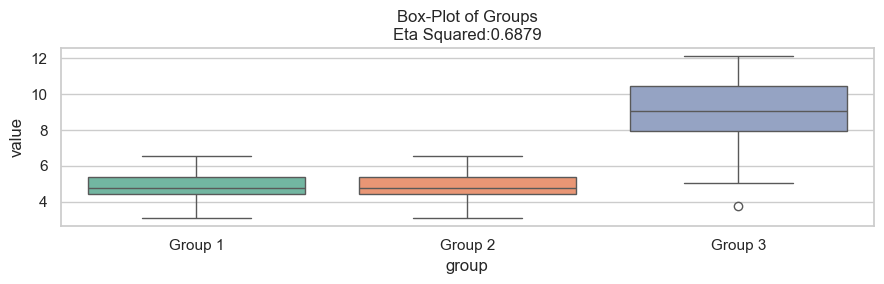

,Source,SS,df,MS,F,Eta Squared
0,Between Groups,355.1,2,177.6,95.9,0.7
1,Within Groups,161.1,87,1.9,NaN,NaN
2,Total,516.3,89,NaN,NaN,NaN


In [424]:
def calculate_anova_table( data ):
    
    groups     = data['group'].unique()
    grand_mean = data['value'].mean()
    
    # Sum of Squares Total (SST)
    SST = np.sum( ( data['value'] - grand_mean )**2 )
    
    # Sum of Squares Between (SSB)
    SSB = sum([
        len(data[data['group']==group]) * (data[data['group']==group]['value'].mean() - grand_mean)**2 for group in groups
    ])
    
    # Sum of Squares Within (SSW)
    SSW = sum([
        np.sum((data[data['group']==group]['value'] - data[data['group']==group]['value'].mean())**2) for group in groups
    ])
    
    # degrees of freedom 
    df_between = len(groups) - 1
    df_within  = len(data) - len(groups)
    df_total   = df_between + df_within
    
    # Mean Squares
    MSB = SSB / df_between
    MSW = SSW / df_within
    
    # F-Statistics
    F = MSB / MSW
    
    # Eta-Squared
    eta_squared = SSB / SST
    
    # ANOVA Table
    anova_table = pd.DataFrame({
        "Source": ["Between Groups","Within Groups","Total"],
        "SS"    : [SSB,SSW,SST],
        "df"    : [df_between,df_within,df_total],
        "MS"    : [MSB,MSW,np.nan],
        "F"     : [F,np.nan,np.nan],
        "Eta Squared": [eta_squared,np.nan,np.nan]
    })
        
    return anova_table, eta_squared
    
    
    
    
# example
np.random.seed(42)
n_samples = 30

group1 = np.random.normal( loc=5, scale=1, size=n_samples )
group2 = np.random.normal( loc=7, scale=1.5, size=n_samples )
group3 = np.random.normal( loc=9, scale=2, size=n_samples )

Dict = {'value': np.concatenate([ group1, group1, group3 ])
       ,'group': ['Group 1']*n_samples + ['Group 2']*n_samples + ['Group 3']*n_samples }

data = pd.DataFrame(Dict)
anova_table, eta_squared = calculate_anova_table( data ) 

# box plot
plt.figure( figsize=(9,3) )
sns.boxplot( data=data, x="group", y="value", palette="Set2" )
plt.title(f'Box-Plot of Groups\nEta Squared:{eta_squared:.4f}'); plt.tight_layout(); plt.show()


# view anova_table
np.round(anova_table,1)

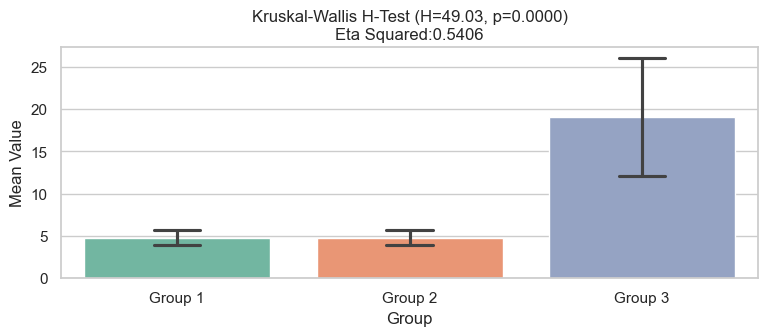

In [17]:
from scipy.stats import kruskal
def calculate_kruskal_table( data ):
    
    groups     = [data.loc[data['group']==g,'value'] for g in data['group'].unique()]
    
    # Perform Kruskal-Wallis Test
    H, p_value = kruskal(*groups)
    
    # calculate the Effect Size (Eta Squared)
    N = len(data)
    k = len(groups)
    eta_squared = (H-(k-1)) / (N-k)
    
    ## Summary Table
    
    # Sum of Squares Between (SSB)
    SSB = H
    
    # Sum of Squares Within (SSW)
    SSW = np.nan
    
    # degrees of freedom 
    df_between = k-1
    df_within  = N-k
    df_total   = N-1
    
    # Mean Squares
    MSB = SSB / df_between
    #MSW = SSW / df_within
    
    # F-Statistics
    #F = MSB / MSW
    
    # Eta-Squared
    #eta_squared = SSB / SST
    
    # ANOVA Table
    kruskal_table = pd.DataFrame({
        "Source": ["Between Groups","Within Groups","Total"],
        "SS"    : [SSB,SSW,np.nan],
        "df"    : [df_between,df_within,df_total],
        "MS"    : [MSB,np.nan,np.nan],
        "H Statistic": [H,np.nan,np.nan],
        "p-value": [p_value,np.nan,np.nan],
        "Eta Squared": [eta_squared,np.nan,np.nan]
    })
        
    return kruskal_table, eta_squared, H, p_value
    
    
    
    
# example
np.random.seed(42)
n_samples = 30

group1 = np.random.normal( loc=5, scale=1, size=n_samples )
group2 = np.random.normal( loc=7, scale=1.5, size=n_samples )
group3 = np.random.normal( loc=19, scale=7, size=n_samples )

Dict = {'value': np.concatenate([ group1, group1, group3 ])
       ,'group': ['Group 1']*n_samples + ['Group 2']*n_samples + ['Group 3']*n_samples }

data = pd.DataFrame(Dict)
kruskal_table, eta_squared, H, p_value = calculate_kruskal_table( data )

# plot
plt.figure(figsize=(9,3))
sns.barplot(data=data,x='group',y='value',estimator=np.mean, ci='sd', capsize=0.2, palette='Set2')
plt.title(f'Kruskal-Wallis H-Test (H={H:.2f}, p={p_value:.4f})\nEta Squared:{eta_squared:.4f}')
plt.xlabel('Group')
plt.ylabel('Mean Value')
plt.show()

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

In [1500]:
def odds_ratio(a,b,c,d):
    or_value = (a/b) / (c/d)
    return or_value

# example
odds_ratio(30,10,15,45)

9.0

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

In [1503]:
def cramers_v( confusion_matrix ):
    chi2    = stats.chi2_contingency( confusion_matrix )[0]
    n       = np.sum( confusion_matrix )
    min_dim = min( confusion_matrix.shape ) - 1
    v       = np.sqrt( chi2 / (n*min_dim) )
    return  v
    
conf_matrix = np.array([ [30,10], [15,45] ])
cramers_v( conf_matrix )

0.4718507154207755

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

In [ ]:
def R_squared( x_Array, y_Array ):
    x = x.reshape(-1,1)
    model = LinearRegression().fit( x_Array, y_Array )
    preds = model.predict( x_Array )
    R2 = r2_score( y, preds )
    return R2

# example
x  =         np.random.normal(loc=5,scale=2,size=36)
y  = 3 * x + np.random.normal(loc=2,scale=1,size=36)
R2 = R_squared( x, y )
R2 = np.round( R2, 2 )
R2

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Generator
 - **Modeling Uncertainty:** Gamma, Exponential
 - **Event Counting:** Poisson, Binomial
 - **Reliability Testing:** Weibull
 - **Modeling Income Distribution:** Pareto
 - **Probability Distribution:** Beta
 - **General Sampling:** Normal, Uniform

In [30]:
def plot_distribution(data,title):
    plt.figure(figsize=(9,2.5))
    sns.histplot(data,kde=True,bins=30,color='dodgerblue',edgecolor='black')
    plt.title(title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.show()

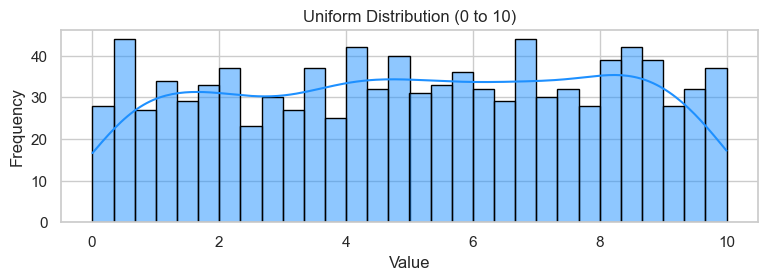

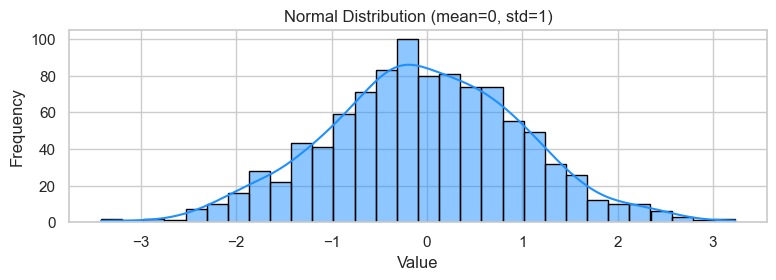

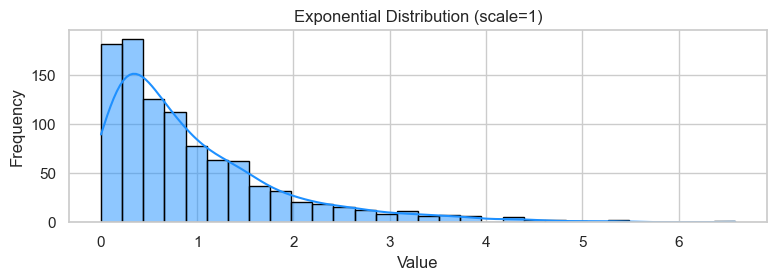

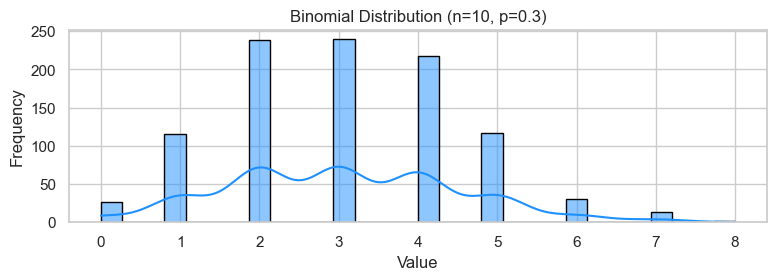

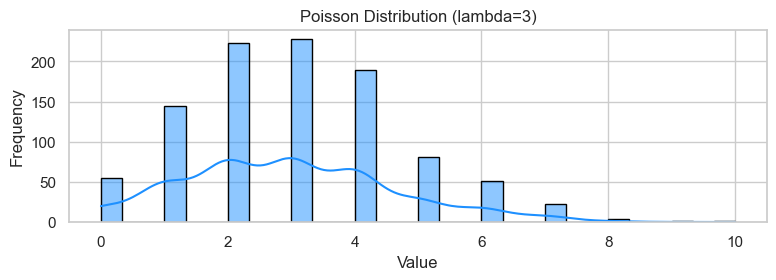

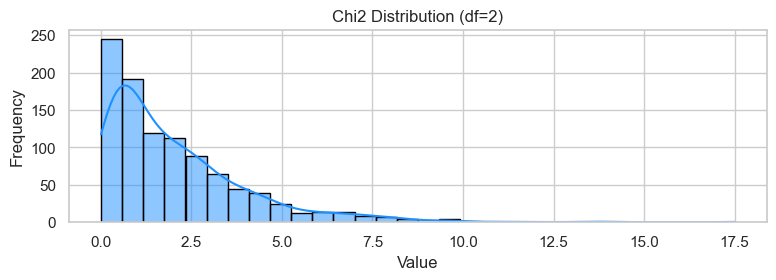

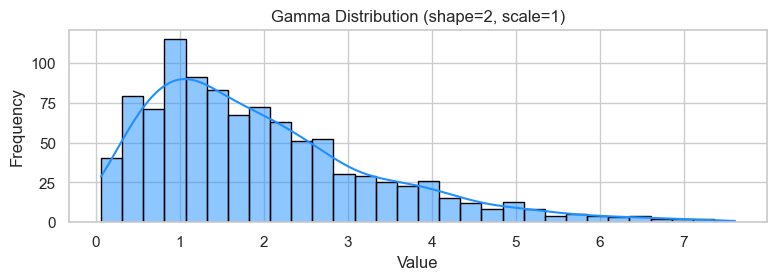

In [31]:
# 1. Uniform Distribution   Equal Probability across a Range
uniform_data = np.random.uniform(low=0, high=10, size=1000)
plot_distribution( uniform_data, 'Uniform Distribution (0 to 10)' )

# 2.1 Normal Distribution   Bell-Shaped Curve
normal_data = np.random.normal(loc=0, scale=1, size=1000)
plot_distribution( normal_data, 'Normal Distribution (mean=0, std=1)' )

# 3. Exponential Distribution   Time Between Events (eg. customer arrivals)
exponential_data = np.random.exponential(scale=1, size=1000)
plot_distribution( exponential_data, 'Exponential Distribution (scale=1)' )

# 4. Binomial Distribution   number of Successes in n trials
binomial_data = np.random.binomial(n=10, p=0.3, size=1000)
plot_distribution( binomial_data, 'Binomial Distribution (n=10, p=0.3)' )

# 5. Poisson Distribution   Counts of Events in a Fixed Time Interval
poisson_data = np.random.poisson(lam=3, size=1000)
plot_distribution( poisson_data, 'Poisson Distribution (lambda=3)' )

# 6. Chi2 Distribution   Sum of Squares of (df) Independent Standard Normals
chi2_data = np.random.chisquare(df=2, size=1000)
plot_distribution( chi2_data, 'Chi2 Distribution (df=2)' )

# 7. Gamma Distribution   Generalized Form of of Exponential
gamma_data = np.random.gamma(shape=2, scale=1, size=1000)
plot_distribution( gamma_data, 'Gamma Distribution (shape=2, scale=1)' )


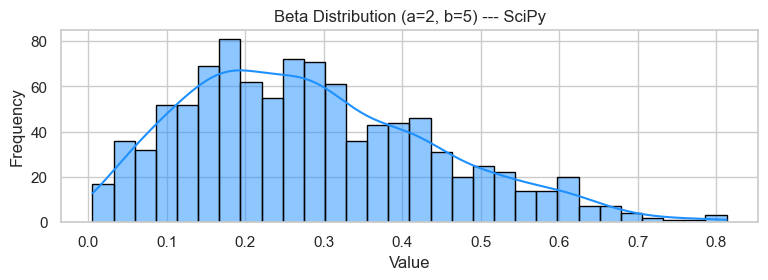

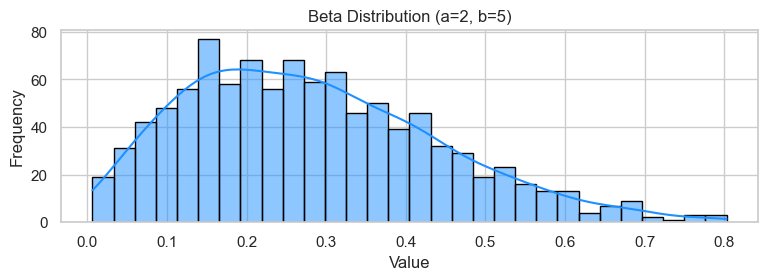

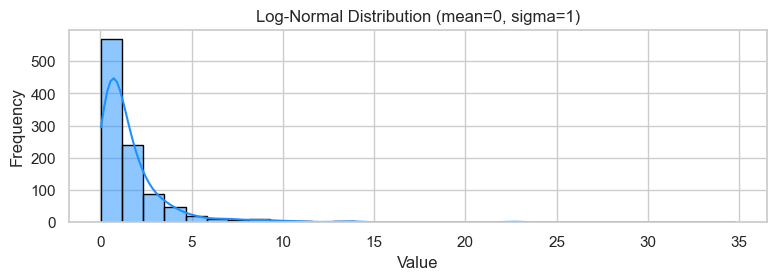

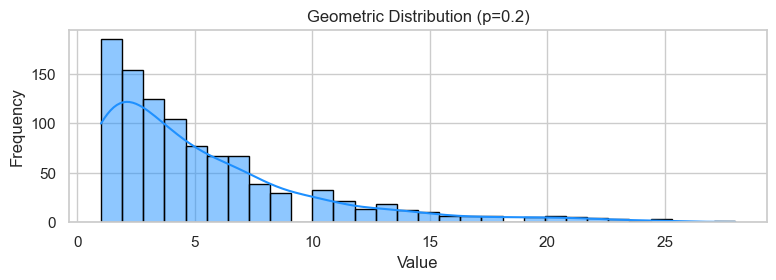

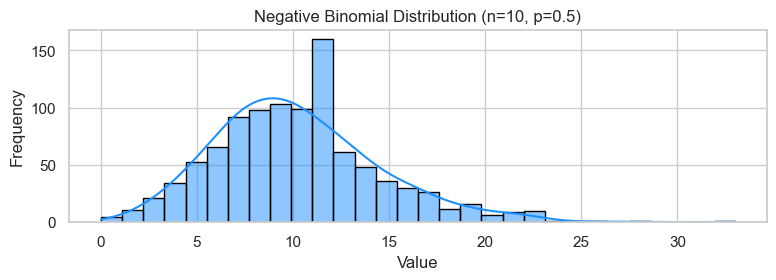

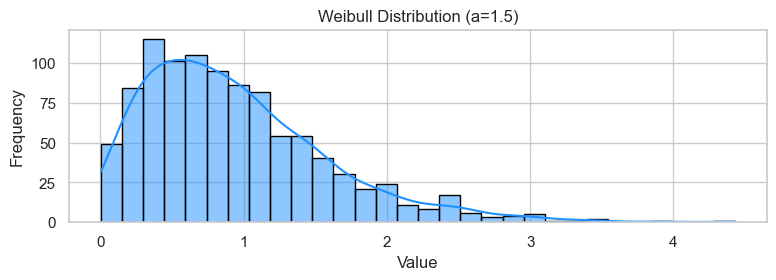

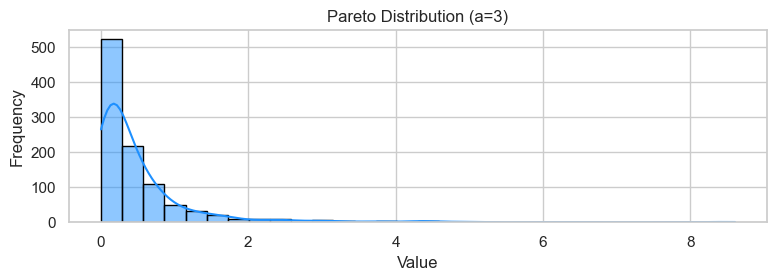

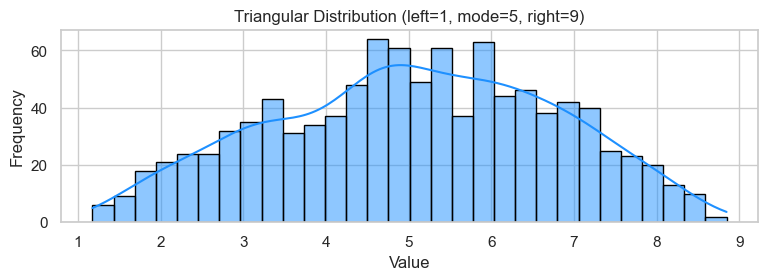

In [35]:
# 8.1 Beta Distribution   Models the Probability Distribution between 0 & 1
from scipy import stats
beta_data = stats.beta.rvs(a=2, b=5, size=1000)
plot_distribution( beta_data, 'Beta Distribution (a=2, b=5) --- SciPy' )

# 8.2 Beta Distribution   Models the Probability Distribution between 0 & 1
beta_data = np.random.beta(a=2, b=5, size=1000)
plot_distribution( beta_data, 'Beta Distribution (a=2, b=5)' )

# 9. Log-Normal Distribution   Logarithmically Normal distribution (useful for +ve data)
log_normal_data = np.random.lognormal(mean=0, sigma=1, size=1000)
plot_distribution( log_normal_data, 'Log-Normal Distribution (mean=0, sigma=1)' )

# 10. Geometric Distribution   Number of Trials until the First Success
geo_data = np.random.geometric(p=0.2, size=1000)
plot_distribution( geo_data, 'Geometric Distribution (p=0.2)' )

# 11. Negative Binomial Distribution   Number of Failures until achieving n successes
neg_binom_data = np.random.negative_binomial(n=10, p=0.5, size=1000)
plot_distribution( neg_binom_data, 'Negative Binomial Distribution (n=10, p=0.5)' )

# 12. Weibull Distribution   Skewed Right, used in Reliability Analysis
weibull_data = np.random.weibull(a=1.5, size=1000)
plot_distribution( weibull_data, 'Weibull Distribution (a=1.5)' )

# 13. Pareto Distribution   Heavy-Tailed, modeling Wealth Distribution
pareto_data = np.random.pareto(a=3, size=1000)
plot_distribution( pareto_data, 'Pareto Distribution (a=3)' )

# 14. Triangular Distribution   Skewed between min, mode, max
triangular_data = np.random.triangular(left=1, mode=5, right=9, size=1000)
plot_distribution( triangular_data, 'Triangular Distribution (left=1, mode=5, right=9)' )


<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

In [136]:
# 15. Pandas: Time Series Data Generation
dates = pd.date_range(start='2022-01-01', periods=100, freq='D')
print("Sample Time Series Dates (Pandas):")
print(dates[:5])


# 16. Scikit-Learn: Classification Data for ML
from sklearn.datasets import make_classification
n_features = 5
X, y = make_classification( n_samples=100, n_features=n_features, n_informative=5, n_redundant=0, n_repeated=0,
                            n_classes=2, n_clusters_per_class=3, weights=None, random_state=42,
                            flip_y=0.01, class_sep=1.0, hypercube=True, shift=0.0, scale=1.0, shuffle=True )
COLS=[]
for i in range(n_features): COLS.append( 'X'+str(i) )
df=pd.DataFrame(X);  df.columns=COLS;   df['y']=y
print( '\n\nClassificaion Data (Scikit-Learn)'); print(df.tail())

# Scatter Plot of first two features colored by class
plt.figure(figsize=(9,3))
plt.scatter( X[:,0], X[:,1], c=y, cmap='coolwarm', alpha=0.5)
plt.title("Synthetic Classification Data")
plt.xlabel('Feature1'); plt.ylabel('Feature2'); plt.show()



# 17. Scikit-Learn: Regression Data for ML
from sklearn.datasets import make_regression
n_features = 5
X, y = make_regression( n_samples=100, n_features=n_features, n_informative=10, n_targets=1,
                        bias=0.0, effective_rank=None, tail_strength=0.5, noise=0.1,
                        shuffle=True, coef=False, random_state=42 )
COLS=[]
for i in range(n_features): COLS.append( 'X'+str(i) )
df=pd.DataFrame(X);  df.columns=COLS;   df['y']=y
print( '\n\nRegression Data (Scikit-Learn)'); print(df.tail())

# Scatter Plot of first two features colored by class
plt.figure(figsize=(9,3))
plt.scatter( X[:,0], y, c='dodgerblue', alpha=0.7)
plt.title("Synthetic Classification Data")
plt.xlabel('Feature1'); plt.ylabel('Target'); plt.show()



# 18. Scikit-Learn: Blob Data for Clustering
from sklearn.datasets import make_blobs
n_features = 5
X, y = make_blobs( n_samples=1000, n_features=n_features, centers=3, cluster_std=6, 
                   center_box=(-5.0, 5.0), shuffle=True, random_state=42, return_centers=False )
COLS=[]
for i in range(n_features): COLS.append( 'X'+str(i) )
df=pd.DataFrame(X);  df.columns=COLS;   df['y']=y
print( '\n\nClustering Data (Scikit-Learn)'); print(df.tail())

# Scatter Plot of first two features colored by class
plt.figure(figsize=(9,3))
plt.scatter( X[:,0], X[:,1], c=y, cmap='jet', alpha=0.6, marker='p', s=100 )
plt.title("Synthetic Classification Data")
plt.xlabel('Feature1'); plt.ylabel('Feature2'); plt.show()

SyntaxError: invalid syntax (3250774340.py, line 64)

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

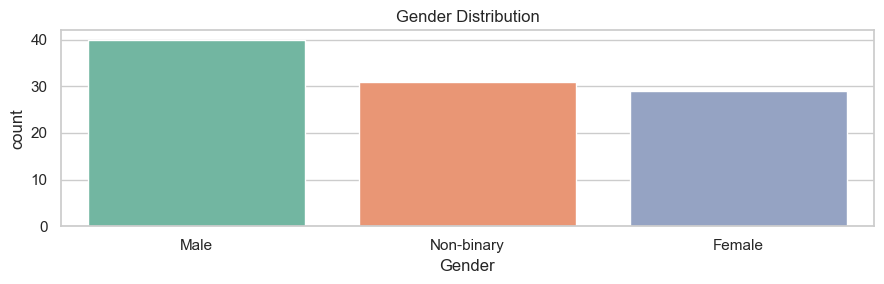

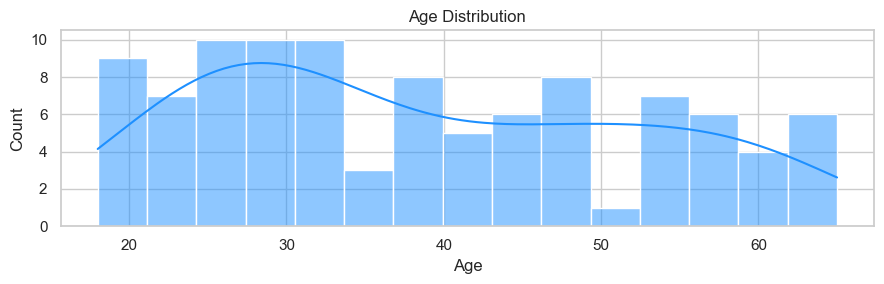

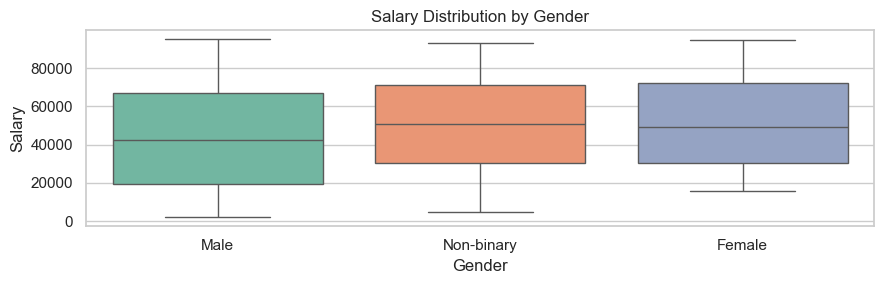

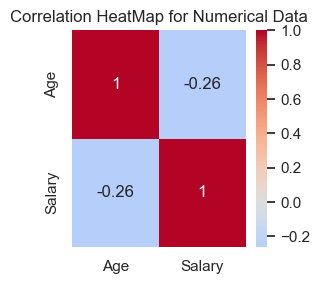

In [163]:
from faker import Faker
def generate_synthetic_data(num_records=100):
    fake = Faker()
    data = {
        "Name"         : [ fake.name()                                                  for _ in range(num_records) ],
        "Gender"       : [ fake.random_element(elements=["Male","Female","Non-binary"]) for _ in range(num_records) ],
        "Age"          : [ fake.random_int(min=18, max=65)                              for _ in range(num_records) ],
        "Job Title"    : [ fake.job()                                                   for _ in range(num_records) ],
        "Company"      : [ fake.company()                                               for _ in range(num_records) ],
        "Email"        : [ fake.email()                                                 for _ in range(num_records) ],
        "Phone Number" : [ fake.phone_number()                                          for _ in range(num_records) ],
        "Address"      : [ fake.address()                                               for _ in range(num_records) ],
        "City"         : [ fake.city()                                                  for _ in range(num_records) ],
        "Country"      : [ fake.country()                                               for _ in range(num_records) ],
        "Birth Date"   : [ fake.date_of_birth(minimum_age=18, maximum_age=65)           for _ in range(num_records) ],
        "Salary"       : [ round( fake.random_number(digits=5), -2 )                    for _ in range(num_records) ],
        "Credit Card"  : [ fake.credit_card_number()                                    for _ in range(num_records) ],
        "SSN"          : [ fake.ssn()                                                   for _ in range(num_records) ]
    }
    df = pd.DataFrame(data)
    return df

# Generate the dataset
df = generate_synthetic_data(num_records=100)

# Display a Sample of the dataset
#print("\nSample Data:")
#print(df.tail(5))


### Data Visualization ###

# cat --- Gender Distribution
plt.figure( figsize=(9,3) )
sns.countplot( data=df, x="Gender", palette='Set2' )
plt.title("Gender Distribution"); plt.tight_layout(); plt.show()

# sclr --- Age Distribution
plt.figure( figsize=(9,3) )
sns.histplot( df['Age'], kde=True, bins=15, color='dodgerblue' )
plt.title("Age Distribution"); plt.tight_layout(); plt.show()

# cat-sclr --- Salary Distribution by Gender
plt.figure( figsize=(9,3) )
sns.boxplot( data=df, x="Gender", y="Salary", palette="Set2" )
plt.title("Salary Distribution by Gender"); plt.tight_layout(); plt.show()

# SCLRS --- Correlation HeatMap for Numerical Data
plt.figure( figsize=(3,3) )
corr = df[["Age","Salary"]].corr()
sns.heatmap( corr, annot=True, cmap="coolwarm", center=0 )
plt.title("Correlation HeatMap for Numerical Data"); plt.tight_layout(); plt.show()

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;">   

<span style="font-family:Arial; font-weight:Bold; font-size:2.3em; color:#00b3e5;"> Power
 - **0.80 (80%)**: Standard benchmark for sufficient power
 - **< 0.8**: Consider increasing sample size or effect size
 - **> 0.9**: Very High Power, reducing the chance of missing an effect

In [1394]:
from statsmodels.stats.power import TTestIndPower
def calc_power( effect_size, alpha=0.05, power=0.80, sample_size=None ):
    
    analysis = TTestIndPower()
    
    if sample_size:
        # calculate the power given the sample size
        calculated_power     = analysis.power( effect_size=effect_size, nobs1=sample_size, alpha=alpha, alternative='two-sided')
        print( 'calculated_power =', np.round( calculated_power, 2 ))
    
    else:
        # calculate the required sample size given the desired power
        required_sample_size = analysis.solve_power( effect_size=effect_size, power=power, alpha=alpha, alternative='two-sided' )
        print( 'required_sample_size =', int( np.round( required_sample_size, 0 )))
    
# Example
calc_power( effect_size=0.5, sample_size=50 )
calc_power( effect_size=0.5, power=0.80 )
        
        
        

calculated_power = 0.7
required_sample_size = 64
